In [2]:
!pip install control
!pip install pymannkendall

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 549.6/549.6 kB 6.3 MB/s eta 0:00:00


In [3]:
from google.colab import files
import seaborn as sns
import io
import pandas as pd
import numpy as np
import pymannkendall as mk
import statsmodels.api as sm
from collections import defaultdict
import matplotlib.pyplot as plt
from sklearn.metrics import root_mean_squared_error as rmse
from sklearn.preprocessing import MinMaxScaler
import control as ctrl
#from sklearn.metrics import mean_absolute_error as mae
#from sklearn.metrics import r2_score
from scipy import signal

In [4]:
def dataloader(data, na, nb, d):

    # Initialize empty arrays for lagged features
    y = data['y']
    u = data['u']
    X = pd.DataFrame()


    # Create lagged features for output ('a' parameters)
    for i in range(1,na+1):
        X['y-{}'.format(i)] = y.shift(i)
    # Create lagged features for input ('b' parameters)
    for i in range(0,nb):
        X['u-{}'.format(i + d)] = u.shift(i + d)


    #Only select data after a certain value
    X = X.iloc[max(na,nb+d):]
    # Set the target values
    y = y[max(na,nb+d):]

    X.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    return X, y


## NOT USED
def r_2(y, y_hat):  ## NOT USED
  y_mean = np.mean(y)
  y_hat_mean = np.mean(y_hat)
  sst = np.sum((y - y_mean) ** 2)
  #ssr = np.sum((y - y_hat_mean) ** 2)
  ssr = np.sum((y - y_hat) ** 2)
  r_squared = 1 - (ssr / sst)
  #print("SSR:", ssr)
  #print("SST:", sst)
  #print("Mean of y:", y_mean)
  #print("Variance of y:", np.var(y))
  return r_squared
  ## NOT USED



def model_metrics(y_real,y_sim,na,nb):
        # Calculate r-squared and AIC and RMSE and BIC and FPE
        k = na + nb # number of parameters
        n = len(y_real)
        SSR = np.sum((y_real - y_sim) ** 2)
        #Calculate usefull Model evaluation parameters
        r_squared = r_2(y_real, y_sim)
        aic =  2 * (na + nb) + n * np.log(1 - r_squared) # Evaluates the complexicity of the Model
        Rmse = rmse(y_real, y_sim[0:])  #Root Mean Squared Error (Less sensitive to outliers: It is less affected by extreme errors compared to RMSE)
        fpe = SSR * (n + k) / (n - k)                  #Final Prediction Error(used for model order selection)(Considers both model fit and complexity) (Asymptotically equivalent to AIC: For large sample sizes, FPE and AIC tend to select the same model)
        bic = n * np.log(SSR / n) + k * np.log(n)      #Bayesian Information Criterion (BIC penalizes model complexity more heavily than AIC.)(Consistent: more likely to select the true model when sample is bigger)

        return r_squared, aic, Rmse, bic, fpe

In [175]:
def model_generator(data, na, nb, d):

  #print(f"Athlete: {code_name[i]}")
  print('\nModel with {} a parameters, {} b parameters and {} time delay'.format(na,nb,d))
  #load the associated data using dataloader(data, na, nb, d)
  X_loader, y_loader = dataloader(data, na,  nb, d)

  ##Calculate the a and b parameters      #parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
  parameters = np.linalg.inv(X_loader.T.dot(X_loader)).dot(X_loader.T).dot(y_loader)
  parameters_a = parameters[:na]
  parameters_b = parameters[na:]

  ## Simulate values of Y
  ysim = np.zeros(len(y_loader)) # the plus one is because the first value is initialized and not simulated
  ysim[0]= y_loader.values[0] # initialize the first value
  max_lag= max(na,nb+d-1)  # Maximum lag across both endogenous and exogenous variables

  for k in range(max_lag, len(X_loader)):
  # Add the contribution from autoregressive terms (endogenous variables)
    for i_a in range(1,na+1):
        #print("parameter a: ",i_a)
        ysim[k] += parameters_a[i_a-1] * ysim[k - i_a]  # Note: parameters_a starts at index 0

  # Add the contribution from exogenous input terms (with delay d)
    for j_b in range(nb):
        #print("parameter b: ",j_b)
        ysim[k] += parameters_b[j_b] * X_loader['u-{}'.format(d+j_b)].iloc[k-j_b]  # Note: parameters_b starts at index 0
        #print('u-{}'.format(d+j_b),j_b,d)

  #Used? Needed?
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den = [1, -parameters_a] #a [1,a2,a3,...] (endogenous)

  #Calculate SSG(K) and TC
  ##SSG = how much the output of a system changes in response to a change in the input.
  SSG = sum(parameters_b)/ (1 - sum(parameters_a)) #a unit change in the input (u) will result in a 1.33 unit change in the output (y)
  SSG2 = sum(num)/ (sum(den))   #print("SSG:", SSG,'SSG2:',SSG2)
  #Calculate the TC
  #Check if parameters_a has more than one element to avoid the error
  #if len(parameters_a) > 1:
  #    poles = 1/parameters_a[0]
  #else:
  #    poles = 1/parameters_a  # In case parameters_a has only one element
  if parameters_a.size > 0:  # Check if parameters_a is not empty
    poles = 1/parameters_a[0]
  else:
    poles = 1
  #print("parameters a", parameters_a, "Poles:", poles)
  poles2 = 1/den[1]
  #print("parameters a2", den, "Poles2:", poles2)

  #Check if poles is an array before calculating dominant_pole
  #if isinstance(poles, np.ndarray):
  #    dominant_pole = poles[np.argmin(np.abs(poles.imag))] #get the dominant
  #else:
  #   dominant_pole = poles  # If poles is a scalar, directly assign to dominant_pole
  dominant_pole = poles

  tau = -1 / np.log(dominant_pole)
  #print("Time constant:", tau)
  #tau2 = -1 / np.log(poles[np.argmin(np.abs(poles.imag))])
  #print("Time constant2:", tau2)


  #Models Stability
  num = parameters_b # b [b1,b2,b3,...] (exogenous)
  den1 =  np.insert(-parameters_a, 0, 1)
  den = [1] + (-parameters_a).tolist() #a [1,a2,a3,...] (endogenous)
  TF = ctrl.TransferFunction(num, den)    #define transfer function
#  poles, zeroes = ctrl.pzmap(TF, plot=True)  #PLOT CIRCLE AND MODEL (DELETE?CHANGE?)
  #add unit circle
  #plt.gca().add_patch(plt.Circle((0, 0), radius=1, fill=False, color='gray', linestyle='--'))
  #plt.show()
  #New Verions (TESTED, but NOT CONFIRMED TO DO THE SAME)
  #poles, zeroes = ctrl.pole_zero_map(TF)
  #ctrl.pole_zero_plot(TF)         #


  ## Model evaluation for each generated model use r_squared and aic def above
  r_squared, aic, Rmse, bic, fpe = model_metrics(y_loader,ysim,na,nb)

  return y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe


In [ ]:
model_generator(athlete_list[1],1,2,0)

NameError: name 'athlete_list' is not defined

# 1º Practical assignment

In [ ]:
uploaded = files.upload()

Saving MOB_Dataset1_A1_M1.csv to MOB_Dataset1_A1_M1.csv
Saving MOB_Dataset1_A1_M2.csv to MOB_Dataset1_A1_M2.csv
Saving MOB_Dataset1_A2_M3.csv to MOB_Dataset1_A2_M3.csv
Saving MOB_Dataset1_A2_M4.csv to MOB_Dataset1_A2_M4.csv
Saving MOB_Dataset1_A3_M5.csv to MOB_Dataset1_A3_M5.csv
Saving MOB_Dataset1_A3_M6.csv to MOB_Dataset1_A3_M6.csv
Saving MOB_Dataset1_A4_M7.csv to MOB_Dataset1_A4_M7.csv
Saving MOB_Dataset1_A4_M8.csv to MOB_Dataset1_A4_M8.csv
Saving MOB_Dataset1_A5_M9.csv to MOB_Dataset1_A5_M9.csv
Saving MOB_Dataset1_A5_M10.csv to MOB_Dataset1_A5_M10.csv
Saving MOB_Dataset1_A6_M11.csv to MOB_Dataset1_A6_M11.csv
Saving MOB_Dataset1_A6_M12.csv to MOB_Dataset1_A6_M12.csv


In [ ]:
A1M1_df = pd.read_csv('MOB_Dataset1_A1_M1.csv', names=['y','u'])
A1M2_df = pd.read_csv('MOB_Dataset1_A1_M2.csv', names=['y','u'])
A2M1_df = pd.read_csv('MOB_Dataset1_A2_M3.csv', names=['y','u'])
A2M2_df = pd.read_csv('MOB_Dataset1_A2_M4.csv', names=['y','u'])
A3M1_df = pd.read_csv('MOB_Dataset1_A3_M5.csv', names=['y','u'])
A3M2_df = pd.read_csv('MOB_Dataset1_A3_M6.csv', names=['y','u'])
A4M1_df = pd.read_csv('MOB_Dataset1_A4_M7.csv', names=['y','u'])
A4M2_df = pd.read_csv('MOB_Dataset1_A4_M8.csv', names=['y','u'])
A5M1_df = pd.read_csv('MOB_Dataset1_A5_M9.csv', names=['y','u'])
A5M2_df = pd.read_csv('MOB_Dataset1_A5_M10.csv', names=['y','u'])
A6M1_df = pd.read_csv('MOB_Dataset1_A6_M11.csv', names=['y','u'])
A6M2_df = pd.read_csv('MOB_Dataset1_A6_M12.csv', names=['y','u'])

athlete_list = [A1M1_df, A1M2_df, A2M1_df, A2M2_df, A3M1_df, A3M2_df, A4M1_df, A4M2_df, A5M1_df, A5M2_df, A6M1_df, A6M2_df]
code_name = ['A1M1', 'A1M2', 'A2M1', 'A2M2', 'A3M1', 'A3M2', 'A4M1', 'A4M2', 'A5M1', 'A5M2', 'A6M1', 'A6M2']

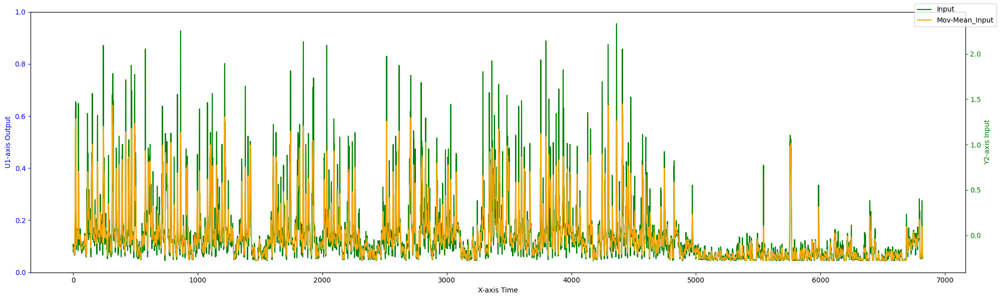

In [ ]:
#1ºData Preparation
#Pre-processing

#High frequency disturbances (too high measurement frequency -> Downsampling)
#1ºlow pass filter | 2º Downsampling


#Outliers
dataset = athlete_list[8]

dataset['u'] = dataset['u'] - np.mean(dataset['u'])
dataset['y'] = dataset['y'] - np.mean(dataset['y'])

mov_avrg_u = dataset['u'].rolling(window=5, center=True, min_periods=1).mean()
mov_avrg_y = dataset['y'].rolling(window=2, center=True, min_periods=1).mean()
#result = mk.original_test(data)
trend = mk.original_test(dataset['y'])
#plot
fig, ax1 = plt.subplots(figsize=(20, 6))

#ax1.plot(dataset['y'], color='blue', label='Real_Output')
#ax1.plot(mov_avrg_y, color='red', label='Mov-Mean-output')
ax1.set_xlabel('X-axis Time')
ax1.set_ylabel('U1-axis Output', color='blue')
ax1.tick_params('y', colors='blue')

ax2 = ax1.twinx()
ax2.plot(dataset['u'], color='green', label='Input')
ax2.plot(mov_avrg_u, color='orange', label='Mov-Mean_Input')

ax2.set_ylabel('Y2-axis Input', color='green')
ax2.tick_params('y', colors='green')

fig.legend(loc="upper right")
fig.tight_layout()


Athlete:(7743, 2)
athlete['u'] Max: 1.3940000000000006 Min: 0.004000000000000095
athlete['y'] Max: 97.5 Min: 0.5
Athlete:(4460, 2)
athlete['u'] Max: 1.348 Min: 0.0
athlete['y'] Max: 78.0 Min: 0.0
Athlete:(7743, 2)
athlete['u'] Max: 1.432 Min: 0.005999999999999911
athlete['y'] Max: 90.0 Min: 0.5
Athlete:(4460, 2)
athlete['u'] Max: 1.388 Min: 0.0019999999999998222
athlete['y'] Max: 100.5 Min: 0.5
Athlete:(5895, 2)
athlete['u'] Max: 1.3080000000000003 Min: 0.0
athlete['y'] Max: 75.0 Min: 0.0
Athlete:(4626, 2)
athlete['u'] Max: 1.2119999999999997 Min: 0.0
athlete['y'] Max: 85.5 Min: 0.5
Athlete:(6823, 2)
athlete['u'] Max: 1.3119999999999998 Min: 0.004000000000000178
athlete['y'] Max: 101.5 Min: 1.0
Athlete:(4906, 2)
athlete['u'] Max: 1.3920000000000001 Min: 0.0
athlete['y'] Max: 105.5 Min: 0.5
Athlete:(6823, 2)
athlete['u'] Max: 1.7240000000000006 Min: 0.0
athlete['y'] Max: 114.0 Min: 0.5
Athlete:(4906, 2)
athlete['u'] Max: 1.5780000000000007 Min: 0.00400000000000071
athlete['y'] Max: 84.5

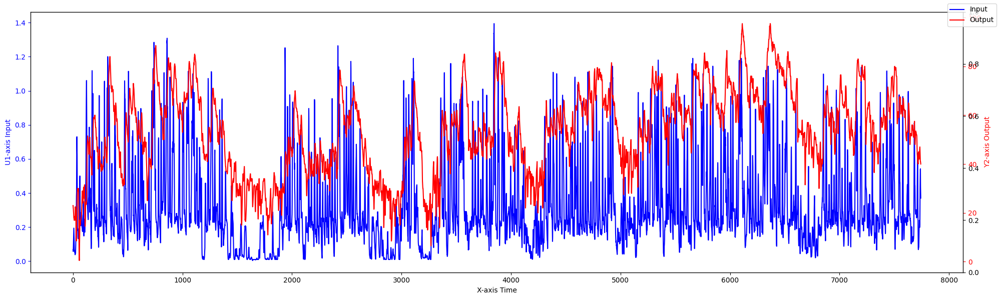

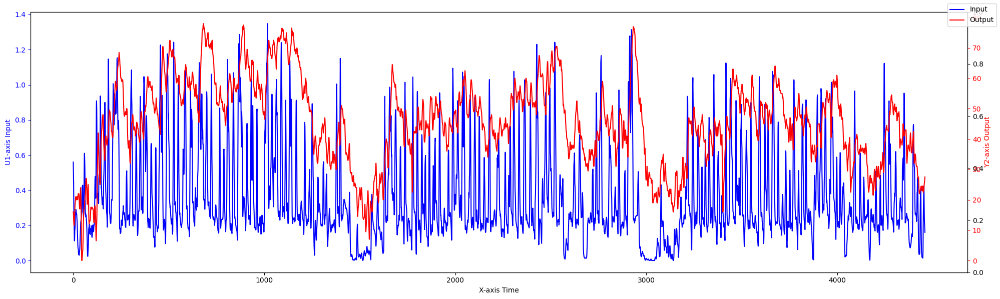

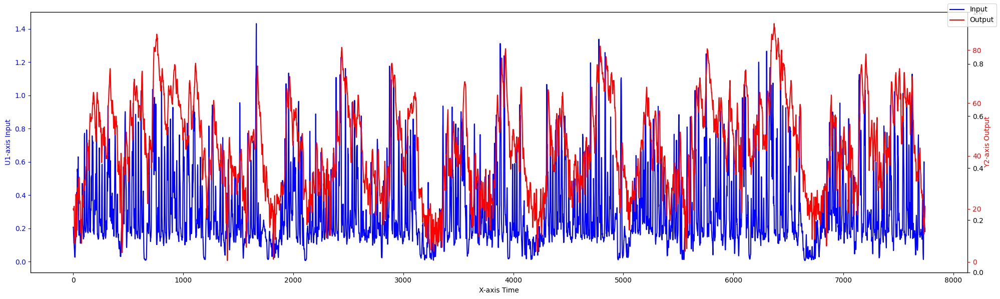

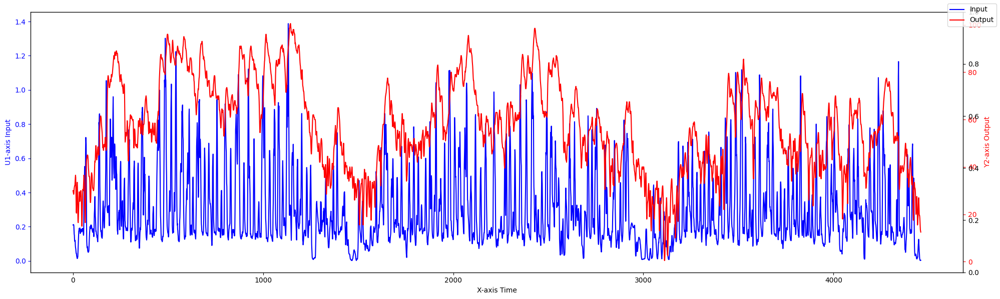

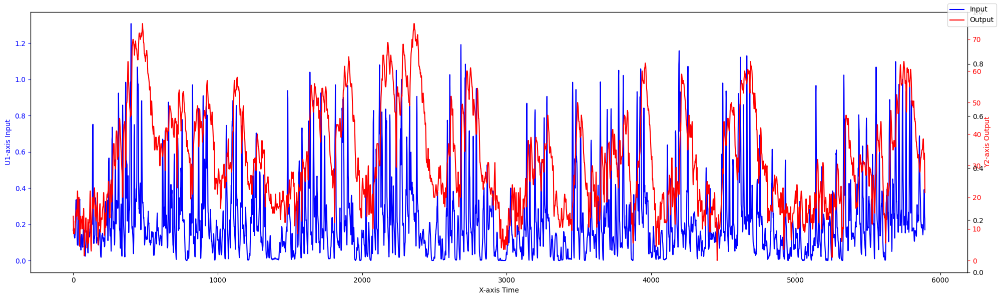

...

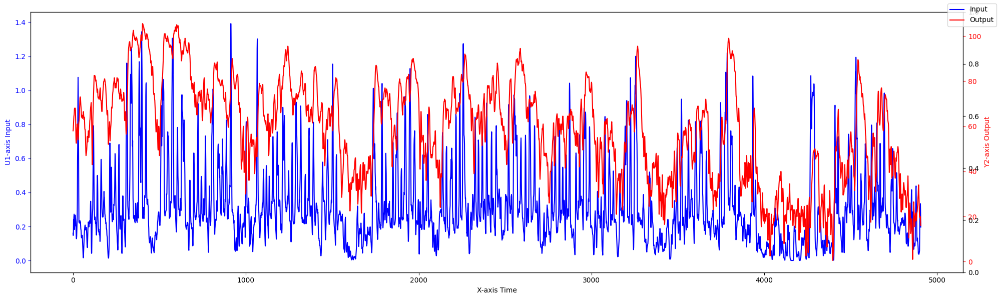

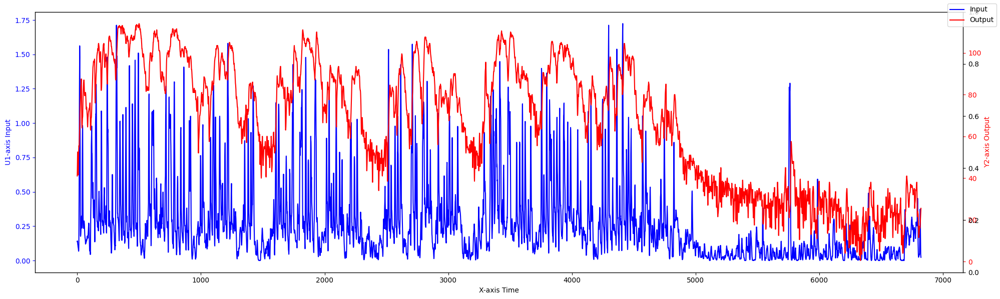

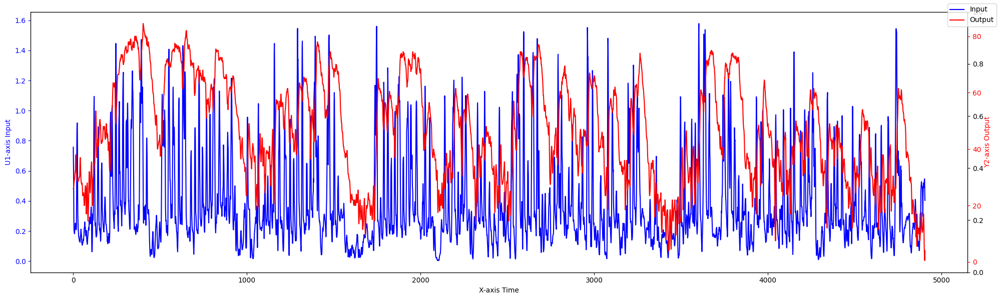

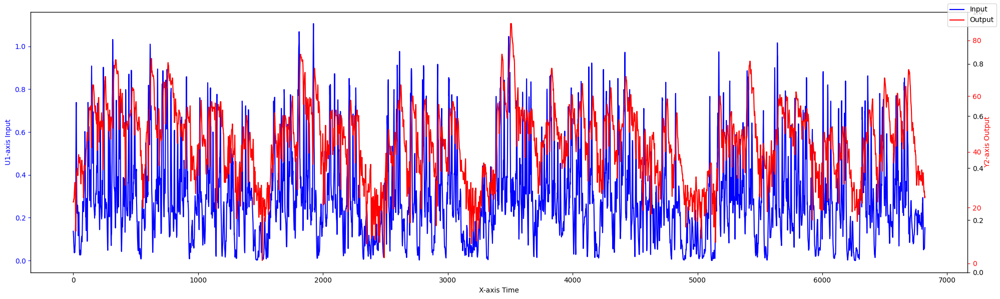

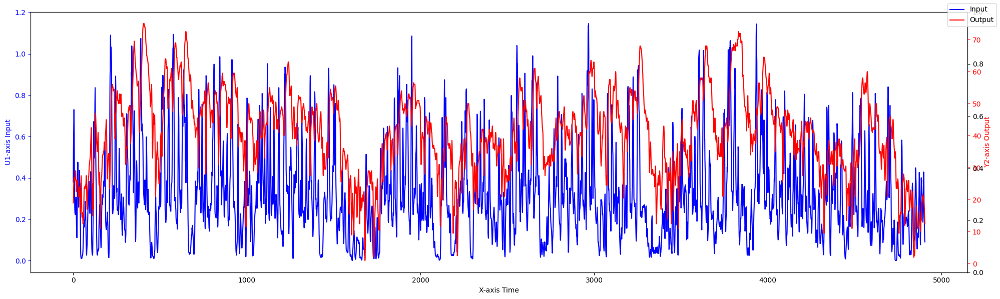

In [ ]:
#1ºData Preparation
#Pre-processing && Ploting
limit = 0
for athlete in athlete_list:
  #Start all values at Zero
  print(f"Athlete:{athlete.shape}")
  #athlete['u'] = athlete['u'] - athlete['u'][0]
  #athlete['y'] = athlete['y'] - athlete['y'][0]

  athlete['u'] = athlete['u'] - athlete['u'].min()
  athlete['y'] = athlete['y'] - athlete['y'].min()

  athlete['u'] = athlete['u'].rolling(window=5, center=True, min_periods=1).mean()
  athlete['y'] = athlete['y'].rolling(window=2, center=True, min_periods=1).mean()


  #Ploting using two axis with different scales
  fig, ax1 = plt.subplots(figsize=(20, 6))
  ax1.plot(athlete['u'], color='blue', label='Input')
  ax1.set_xlabel('X-axis Time')
  ax1.set_ylabel('U1-axis Input', color='blue')
  ax1.tick_params('y', colors='blue')
  ax2 = ax1.twinx()
  print("athlete['u']",'Max:',athlete['u'].max(),'Min:',athlete['u'].min())
  print("athlete['y']",'Max:',athlete['y'].max(),'Min:',athlete['y'].min())

  #trend = mk.original_test(athlete['y'])
  ax3 = ax1.twinx()
  #ax3.plot(trend, color='green', label='Output')

  '''  if athlete.shape[0] == 7743 and limit == 0:
    print("tEAWDAWDrue")
    athlete_list[0]['u'] = athlete['u']
    athlete_list[0]['y'] = athlete['y']
    limit +=+ 1'''
  #y_mean = np.mean(athlete['y'])
  #print("Mean of y:", y_mean)
  #print("Variance of y:", np.var(y))
  ax2.plot(athlete['y'], color='red', label='Output')
  ax2.set_ylabel('Y2-axis Output', color='red')
  ax2.tick_params('y', colors='red')
  fig.legend(loc="upper right")
  fig.tight_layout()


In [ ]:
#Smoothing the Data
#capture important patterns in the data, while leaving out noise or other fine-scale structures/rapid phenomena.

## 2º System Identification

Athlete: A1M1

Model #0 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.646507869999436, Akaike's information criteria: 10018.367043276934

Model #1 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-14-13e61a8a73f0>:52: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, new_row], ignore_index=True)
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings

its regression yield r squared: -2.5619477306342553, Akaike's information criteria: 9835.450439536073

Model #2 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -2.4760005860799175, Akaike's information criteria: 9645.129590322837

Model #3 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: -2.394949755194794, Akaike's information criteria: 9461.294271137516

Model #4 Dataset:A1M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.3246057838997696, Akaike's information criteria: 9298.054857034234

Model #5 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.361271589707112, Akaike's information criteria: 9388.564101500608

Model #6 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.2772211105163453, Akaike's information criteria: 9191.347808540935

Model #7 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.1981565993747454, Akaike's information criteria: 9001.164683306446

Model #8 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.128114509051194, Akaike's information criteria: 8828.65066552897

Model #9 Dataset:A1M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.068037924810121, Akaike's information criteria: 8677.472900327006

Model #10 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.398809200648542, Akaike's information criteria: 9475.310546232115

Model #11 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.31868743127294, Akaike's information criteria: 9289.467220777142

Model #12 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.2306307645859578, Akaike's information criteria: 9080.177731436132

Model #13 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.146102160928307, Akaike's information criteria: 8873.873014131457

Model #14 Dataset:A1M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.096298055879811, Akaike's information criteria: 8749.283072275264

Model #15 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.792435313301436, Akaike's information criteria: 10324.151818888904

Model #16 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.6802228244491952, Akaike's information criteria: 10090.407399035457

Model #17 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.575865620756623, Akaike's information criteria: 9866.541713886036

Model #18 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.521346758454225, Akaike's information criteria: 9746.41345733807

Model #19 Dataset:A1M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.517232943975514, Akaike's information criteria: 9736.112915079033

Model #20 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.721065334492146, Akaike's information criteria: -9880.812940940907

Model #21 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7222875909800334, Akaike's information criteria: -9913.530782495247

Model #22 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7211327597236764, Akaike's information criteria: -9880.130556256076

Model #23 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7152010875787399, Akaike's information criteria: -9715.966674928002

Model #24 Dataset:A1M1 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.7017111633682058, Akaike's information criteria: -9356.604522634001

Model #25 Dataset:A1M1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7151370788107558, Akaike's information criteria: -9714.73901872165

Model #26 Dataset:A1M1 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7196191898335541, Akaike's information criteria: -9836.23480161256

Model #27 Dataset:A1M1 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7210172279054456, Akaike's information criteria: -9873.648012974503

Model #28 Dataset:A1M1 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7203334504660587, Akaike's information criteria: -9853.429032739798

Model #29 Dataset:A1M1 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.711171414790587, Akaike's information criteria: -9602.749721766939

Model #30 Dataset:A1M1 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7149766075252596, Akaike's information criteria: -9707.12433974628

Model #31 Dataset:A1M1 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7186012797540491, Akaike's information criteria: -9804.91797695229

Model #32 Dataset:A1M1 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7206448508941319, Akaike's information criteria: -9860.049867199454

Model #33 Dataset:A1M1 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7197710226134753, Akaike's information criteria: -9834.610883590356

Model #34 Dataset:A1M1 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7120511143282791, Akaike's information criteria: -9623.105673378961

Model #35 Dataset:A1M1 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7137925138755934, Akaike's information criteria: -9671.785057250489

Model #36 Dataset:A1M1 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7183419195778489, Akaike's information criteria: -9794.521302518293

Model #37 Dataset:A1M1 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7195253730270632, Akaike's information criteria: -9825.831576459484

Model #38 Dataset:A1M1 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7139884408890909, Akaike's information criteria: -9673.329534196455

Model #39 Dataset:A1M1 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.705291222034362, Akaike's information criteria: -9440.372413655776

Model #40 Dataset:A1M1 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.5732299956811171, Akaike's information criteria: -6585.53923852271

Model #41 Dataset:A1M1 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5709680687474867, Akaike's information criteria: -6544.619449870927

Model #42 Dataset:A1M1 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.5402268697019048, Akaike's information criteria: -6008.1511017077855

Model #43 Dataset:A1M1 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5404777524994753, Akaike's information criteria: -6011.5981452621045

Model #44 Dataset:A1M1 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.2968626753761645, Akaike's information criteria: -2719.347319980643

Model #45 Dataset:A1M1 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.573833918496878, Akaike's information criteria: -6594.501296233153

Model #46 Dataset:A1M1 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5693507230154959, Akaike's information criteria: -6512.650172848208

Model #47 Dataset:A1M1 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6208437921812726, Akaike's information criteria: -7497.336380587049

Model #48 Dataset:A1M1 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5333178370486784, Akaike's information criteria: -5889.182776467856

Model #49 Dataset:A1M1 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.24663965138262778, Akaike's information criteria: -2183.208265490155

Model #50 Dataset:A1M1 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.571290036414049, Akaike's information criteria: -6545.583901321951

Model #51 Dataset:A1M1 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6408371070846177, Akaike's information criteria: -7914.575436580875

Model #52 Dataset:A1M1 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6150047480288479, Akaike's information criteria: -7376.108857846921

Model #53 Dataset:A1M1 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5844515617438654, Akaike's information criteria: -6784.293693456455

Model #54 Dataset:A1M1 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5480793073132632, Akaike's information criteria: -6134.306962292519

Model #55 Dataset:A1M1 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6415069931516768, Akaike's information criteria: -7927.023167813523

Model #56 Dataset:A1M1 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6393066239774577, Akaike's information criteria: -7878.647955230167

Model #57 Dataset:A1M1 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6253482902675451, Akaike's information criteria: -7583.865194469629

Model #58 Dataset:A1M1 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6125265876296024, Akaike's information criteria: -7322.56384215729

Model #59 Dataset:A1M1 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5685387094416778, Akaike's information criteria: -6489.866819415659

Model #60 Dataset:A1M1 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7074037041808392, Akaike's information criteria: -9504.161623110802

Model #61 Dataset:A1M1 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7045706634593052, Akaike's information criteria: -9429.58016392696

Model #62 Dataset:A1M1 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6969515048102033, Akaike's information criteria: -9232.49525578615

Model #63 Dataset:A1M1 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6840973479562429, Akaike's information criteria: -8909.81358113437

Model #64 Dataset:A1M1 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6562048340412743, Akaike's information criteria: -8253.934151371493

Model #65 Dataset:A1M1 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7072542728956923, Akaike's information criteria: -9498.209751805249

Model #66 Dataset:A1M1 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.704711913452144, Akaike's information criteria: -9431.281679821624

Model #67 Dataset:A1M1 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6993833008296728, Akaike's information criteria: -9291.653078928894

Model #68 Dataset:A1M1 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6953529323663243, Akaike's information criteria: -9187.397073706014

Model #69 Dataset:A1M1 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6608934737885799, Akaike's information criteria: -8357.108895929967

Model #70 Dataset:A1M1 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7071726901953772, Akaike's information criteria: -9494.053060616536

Model #71 Dataset:A1M1 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7060843898341551, Akaike's information criteria: -9464.116007997973

Model #72 Dataset:A1M1 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7057082449607487, Akaike's information criteria: -9452.995003473103

Model #73 Dataset:A1M1 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7009759741633004, Akaike's information criteria: -9328.34899248035

Model #74 Dataset:A1M1 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.677786942181954, Akaike's information criteria: -8749.347093572045

Model #75 Dataset:A1M1 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7049380906831356, Akaike's information criteria: -9431.991869003192

Model #76 Dataset:A1M1 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7133193193410612, Akaike's information criteria: -9653.751139706732

Model #77 Dataset:A1M1 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7026604799251136, Akaike's information criteria: -9370.057417752518

Model #78 Dataset:A1M1 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6820936156270135, Akaike's information criteria: -8851.443067783202

Model #79 Dataset:A1M1 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6777737388756117, Akaike's information criteria: -8745.897601123997
Athlete: A1M2

Model #0 Dataset:A1M2 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.6170790066599796, Akaike's information criteria: 5734.788242818447

Model #1 Dataset:A1M2 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: -2.5086466302496504, Akaike's information criteria: 5597.8170683532535

<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(




Model #2 Dataset:A1M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -2.4027704749516325, Akaike's information criteria: 5459.997386601917

Model #3 Dataset:A1M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.3097132896026054, Akaike's information criteria: 5335.215138906473

Model #4 Dataset:A1M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.2377482228735586, Akaike's information criteria: 5236.0819143139315

Model #5 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.283761129846182, Akaike's information criteria: 5304.5149742636895

Model #6 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -2.1826217486287867, Akaike's information criteria: 5163.892550512555

Model #7 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.0931627613849173, Akaike's information criteria: 5035.688975619944

Model #8 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -2.020978439265212, Akaike's information criteria: 4929.36230997346

Model #9 Dataset:A1M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9666650916227697, Akaike's information criteria: 4847.450888173583

Model #10 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.241671233400187, Akaike's information criteria: 5247.828715771116

Model #11 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.144129632805673, Akaike's information criteria: 5110.513342221061

Model #12 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.040079861485904, Akaike's information criteria: 4959.44226350571

Model #13 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.952694740608134, Akaike's information criteria: 4828.426973184488

Model #14 Dataset:A1M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9089454360320155, Akaike's information criteria: 4760.871641489318

Model #15 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.6472488825796687, Akaike's information criteria: 5773.944367969715

Model #16 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.499946229357414, Akaike's information criteria: 5588.990581774627

Model #17 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.3790489707815463, Akaike's information criteria: 5431.16501358884

Model #18 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.330584177033585, Akaike's information criteria: 5365.616784447486

Model #19 Dataset:A1M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.343935984145516, Akaike's information criteria: 5382.225351465258

Model #20 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.8006232754763936, Akaike's information criteria: -7186.401275856017

Model #21 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8041995296384141, Akaike's information criteria: -7265.47847569135

Model #22 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.8001330226842908, Akaike's information criteria: -7172.230172510162

Model #23 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7893353060336443, Akaike's information criteria: -6936.1644676836795

Model #24 Dataset:A1M2 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.759654795408473, Akaike's information criteria: -6347.4001081131855

Model #25 Dataset:A1M2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7955200529599864, Akaike's information criteria: -7070.118165155924

Model #26 Dataset:A1M2 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: 0.8009244486416537, Akaike's information criteria: -7187.913873122594

Model #27 Dataset:A1M2 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8014082200681549, Akaike's information criteria: -7197.141459940037

Model #28 Dataset:A1M2 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: 0.7954956787690608, Akaike's information criteria: -7064.825300754614

Model #29 Dataset:A1M2 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7681129283686285, Akaike's information criteria: -6503.54231698493

Model #30 Dataset:A1M2 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.794687284246352, Akaike's information criteria: -7048.416083683539

Model #31 Dataset:A1M2 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8001460187530803, Akaike's information criteria: -7166.9098238095685

Model #32 Dataset:A1M2 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.800613879711772, Akaike's information criteria: -7175.741099254872

Model #33 Dataset:A1M2 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7961602161607119, Akaike's information criteria: -7075.734987204861

Model #34 Dataset:A1M2 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7800904809871971, Akaike's information criteria: -6736.242587550127

Model #35 Dataset:A1M2 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7935725373612569, Akaike's information criteria: -7020.704421877529

Model #36 Dataset:A1M2 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7994541485713229, Akaike's information criteria: -7147.903621493271

Model #37 Dataset:A1M2 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8003081127257982, Akaike's information criteria: -7165.303423239568

Model #38 Dataset:A1M2 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7942815557914293, Akaike's information criteria: -7031.292092884127

Model #39 Dataset:A1M2 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7789569552101783, Akaike's information criteria: -6709.839110780819

Model #40 Dataset:A1M2 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6973324437615498, Akaike's information criteria: -5321.84607423007

Model #41 Dataset:A1M2 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6998525312505591, Akaike's information criteria: -5359.119914493386

Model #42 Dataset:A1M2 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6752560769390853, Akaike's information criteria: -5006.8696247775915

Model #43 Dataset:A1M2 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.6029071076557148, Akaike's information criteria: -4109.494937845539

Model #44 Dataset:A1M2 
with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.020124118958146475, Akaike's information criteria: 94.7627794263862

Model #45 Dataset:A1M2 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6963792903955317, Akaike's information criteria: -5305.8291075633715

Model #46 Dataset:A1M2 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6954554878034279, Akaike's information criteria: -5291.0967606938475

Model #47 Dataset:A1M2 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7281010692417859, Akaike's information criteria: -5795.159575416681

Model #48 Dataset:A1M2 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5849114946143628, Akaike's information criteria: -3909.118961552098

Model #49 Dataset:A1M2 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.246975442964376, Akaike's information criteria: 991.091216470312

Model #50 Dataset:A1M2 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6964558393773321, Akaike's information criteria: -5303.760973945045

Model #51 Dataset:A1M2 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7449322409723419, Akaike's information criteria: -6077.903267412124

Model #52 Dataset:A1M2 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7212228547141981, Akaike's information criteria: -5680.561188366572

Model #53 Dataset:A1M2 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.669023982629759, Akaike's information criteria: -4914.829495251894

Model #54 Dataset:A1M2 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5517794345658118, Akaike's information criteria: -3563.398171537181

Model #55 Dataset:A1M2 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7457574277810033, Akaike's information criteria: -6090.342541117329

Model #56 Dataset:A1M2 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7431028041342667, Akaike's information criteria: -6042.698237846948

Model #57 Dataset:A1M2 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7327737471538116, Akaike's information criteria: -5865.763815980811

Model #58 Dataset:A1M2 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7114173442917235, Akaike's information criteria: -5522.0714307300805

Model #59 Dataset:A1M2 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6125411931440665, Akaike's information criteria: -4209.144837718448

Model #60 Dataset:A1M2 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7984054006402913, Akaike's information criteria: -7129.870043275922

Model #61 Dataset:A1M2 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7959104435153377, Akaike's information criteria: -7075.0482616285335


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model #62 Dataset:A1M2 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7856254809842891, Akaike's information criteria: -6855.916850950149


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model #63 Dataset:A1M2 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.7612517159783064, Akaike's information criteria: -6374.531490031087

Model #64 Dataset:A1M2 
with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model with 3 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.687463903000239, Akaike's information criteria: -5173.322288574184

Model #65 Dataset:A1M2 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7980209017651514, Akaike's information criteria: -7119.377358964592

Model #66 Dataset:A1M2 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7966658251289, Akaike's information criteria: -7089.575230728482

Model #67 Dataset:A1M2 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7892110468924101, Akaike's information criteria: -6927.53690114948

Model #68 Dataset:A1M2 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.761420838625917, Akaike's information criteria: -6374.256060970759

Model #69 Dataset:A1M2 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6906957379006009, Akaike's information criteria: -5216.456416331752

Model #70 Dataset:A1M2 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7980179944265842, Akaike's information criteria: -7117.313204233494

Model #71 Dataset:A1M2 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7972384072004359, Akaike's information criteria: -7098.547970149784

Model #72 Dataset:A1M2 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7843643333639366, Akaike's information criteria: -6822.705181754858

Model #73 Dataset:A1M2 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7751852084477767, Akaike's information criteria: -6635.498635070503

Model #74 Dataset:A1M2 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7388597507660223, Akaike's information criteria: -5967.032691536371

Model #75 Dataset:A1M2 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7976891731264727, Akaike's information criteria: -7106.465277268106

Model #76 Dataset:A1M2 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7947644075749639, Akaike's information criteria: -7040.923424856813

Model #77 Dataset:A1M2 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.784672739359885, Akaike's information criteria: -6825.545767102684

Model #78 Dataset:A1M2 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.766998028703972, Akaike's information criteria: -6472.722349141285

Model #79 Dataset:A1M2 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7386302102903171, Akaike's information criteria: -5959.778435482881
Athlete: A2M1

Model #0 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6295208765445124, Akaike's information criteria: 7486.978400427342

Model #1 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5448833249840486, Akaike's information criteria: 7232.750468937537

Model #2 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.456901832491437, Akaike's information criteria: 6959.4948121828165

Model #3 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.369787815332772, Akaike's information criteria: 6679.212463873639

Model #4 Dataset:A2M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2879911093539773, Akaike's information criteria: 6406.542864717718

Model #5 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3943028724499427, Akaike's information criteria: 6762.606041087138

Model #6 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3065979433837178, Akaike's information criteria: 6472.888338826453

Model #7 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.220435535890371, Akaike's information criteria: 6177.426333841018

Model #8 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1381626850275044, Akaike's information criteria: 5884.469126616248

Model #9 Dataset:A2M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.060958419207155, Akaike's information criteria: 5599.175006872669

Model #10 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.209168994645033, Akaike's information criteria: 6140.851124032528

Model #11 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1257706075262148, Akaike's information criteria: 5842.245931798514

Model #12 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0354280728175729, Akaike's information criteria: 5505.44420391227

Model #13 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.9521601998456535, Akaike's information criteria: 5181.5621199725665

Model #14 Dataset:A2M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.8918817955589482, Akaike's information criteria: 4938.256935974088

Model #15 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1890849937201193, Akaike's information criteria: 6071.379932016313

Model #16 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0944942283193035, Akaike's information criteria: 5728.7970744067325

Model #17 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0123523407572117, Akaike's information criteria: 5418.517806754832

Model #18 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.9614397673669817, Akaike's information criteria: 5219.579032497893

Model #19 Dataset:A2M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.9329669307767581, Akaike's information criteria: 5105.798874401551

Model #20 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6678127441606628, Akaike's information criteria: -8528.121000710447

Model #21 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6886140823020136, Akaike's information criteria: -9027.596884259978

Model #22 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.6980443363941915, Akaike's information criteria: -9264.457131871079

Model #23 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6980685960533699, Akaike's information criteria: -9263.881446897462

Model #24 Dataset:A2M1 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.6873684751069473, Akaike's information criteria: -8993.204884645751

Model #25 Dataset:A2M1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6811110453980813, Akaike's information criteria: -8841.284435520352

Model #26 Dataset:A2M1 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6948204142852206, Akaike's information criteria: -9180.256694036174

Model #27 Dataset:A2M1 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6999367406732708, Akaike's information criteria: -9309.91382494174

Model #28 Dataset:A2M1 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6980555506602079, Akaike's information criteria: -9260.349566951107

Model #29 Dataset:A2M1 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6876554943341731, Akaike's information criteria: -8997.148564500663

Model #30 Dataset:A2M1 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6937754886040621, Akaike's information criteria: -9151.800434796723

Model #31 Dataset:A2M1 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.703690285398388, Akaike's information criteria: -9405.332948489113

Model #32 Dataset:A2M1 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7061812148640231, Akaike's information criteria: -9469.441105525519

Model #33 Dataset:A2M1 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7054831585532729, Akaike's information criteria: -9449.856506674445

Model #34 Dataset:A2M1 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6975674420109261, Akaike's information criteria: -9243.458999872328

Model #35 Dataset:A2M1 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6991667169581786, Akaike's information criteria: -9286.079406292707

Model #36 Dataset:A2M1 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7062794566899052, Akaike's information criteria: -9470.02883104092

Model #37 Dataset:A2M1 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7080502827980906, Akaike's information criteria: -9515.590862010135

Model #38 Dataset:A2M1 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7052905563456359, Akaike's information criteria: -9441.576707188151

Model #39 Dataset:A2M1 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6972249586856281, Akaike's information criteria: -9231.508722393648

Model #40 Dataset:A2M1 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6439560686846613, Akaike's information criteria: -7988.139626707559

Model #41 Dataset:A2M1 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6412435224646549, Akaike's information criteria: -7929.387782627346

Model #42 Dataset:A2M1 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6249883575080689, Akaike's information criteria: -7585.378121007497

Model #43 Dataset:A2M1 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6233703301048382, Akaike's information criteria: -7551.078416005002

Model #44 Dataset:A2M1 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5587436358389337, Akaike's information criteria: -6324.6841195594225

Model #45 Dataset:A2M1 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6467183103643388, Akaike's information criteria: -8046.429626949544

Model #46 Dataset:A2M1 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6422361163121657, Akaike's information criteria: -7947.807089808722

Model #47 Dataset:A2M1 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6581416750222797, Akaike's information criteria: -8298.724389328163

Model #48 Dataset:A2M1 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6263745661560418, Akaike's information criteria: -7610.072585363362

Model #49 Dataset:A2M1 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5606518685081876, Akaike's information criteria: -6355.397545837597

Model #50 Dataset:A2M1 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6543532717795053, Akaike's information criteria: -8212.496446789046

Model #51 Dataset:A2M1 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6790154989294152, Akaike's information criteria: -8784.308925381107

Model #52 Dataset:A2M1 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6633515527836125, Akaike's information criteria: -8414.484999634913

Model #53 Dataset:A2M1 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6502970048626724, Akaike's information criteria: -8119.042069154342

Model #54 Dataset:A2M1 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6103958916533512, Akaike's information criteria: -7282.140519024864

Model #55 Dataset:A2M1 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6840107718164792, Akaike's information criteria: -8903.69292482974

Model #56 Dataset:A2M1 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.679543081185997, Akaike's information criteria: -8793.901495920392

Model #57 Dataset:A2M1 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.668193730274002, Akaike's information criteria: -8523.48938903912

Model #58 Dataset:A2M1 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6530958254106825, Akaike's information criteria: -8178.154962303713

Model #59 Dataset:A2M1 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6111909131906417, Akaike's information criteria: -7294.997970625596

Model #60 Dataset:A2M1 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6883018040115167, Akaike's information criteria: -9014.671870262224

Model #61 Dataset:A2M1 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6921549641345529, Akaike's information criteria: -9110.948747663306

Model #62 Dataset:A2M1 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6938024277342889, Akaike's information criteria: -9152.481366701864

Model #63 Dataset:A2M1 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6886962048121568, Akaike's information criteria: -9023.304732881716

Model #64 Dataset:A2M1 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.673719595503538, Akaike's information criteria: -8658.545536351896

Model #65 Dataset:A2M1 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6939345069498342, Akaike's information criteria: -9153.820758548574

Model #66 Dataset:A2M1 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6948773252028413, Akaike's information criteria: -9177.700209920555

Model #67 Dataset:A2M1 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6942692050700934, Akaike's information criteria: -9161.104421623339

Model #68 Dataset:A2M1 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6911202768762514, Akaike's information criteria: -9080.628116579996

Model #69 Dataset:A2M1 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6719804128081062, Akaike's information criteria: -8614.294288407773

Model #70 Dataset:A2M1 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7078095262225164, Akaike's information criteria: -9510.904216035677

Model #71 Dataset:A2M1 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7051765689987819, Akaike's information criteria: -9440.249301284319

Model #72 Dataset:A2M1 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7036619568195464, Akaike's information criteria: -9399.376845231653

Model #73 Dataset:A2M1 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7029955701233752, Akaike's information criteria: -9380.781635905534

Model #74 Dataset:A2M1 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6846192514457643, Akaike's information criteria: -8915.147849914887

Model #75 Dataset:A2M1 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7091597501870164, Akaike's information criteria: -9543.518982595131

Model #76 Dataset:A2M1 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7095251031187142, Akaike's information criteria: -9552.010571891293

Model #77 Dataset:A2M1 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7030809259606134, Akaike's information criteria: -9381.005484980053

Model #78 Dataset:A2M1 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6955898645304107, Akaike's information criteria: -9187.038705749539

Model #79 Dataset:A2M1 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6844360871316179, Akaike's information criteria: -8907.502907690028
Athlete: A2M2

Model #0 Dataset:A2M2 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.483560181455981, Akaike's information criteria: 5567.076404412528

Model #1 Dataset:A2M2 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.4103290193959848, Akaike's information criteria: 5471.113511225529

Model #2 Dataset:A2M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.3373745642406076, Akaike's information criteria: 5373.507045835075

Model #3 Dataset:A2M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.2663063289773917, Akaike's information criteria: 5276.387995134304

Model #4 Dataset:A2M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.197667634501002, Akaike's information criteria: 5180.588583671968

Model #5 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.194682308573239, Akaike's information criteria: 5181.911939015659

Model #6 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.120828002771144, Akaike's information criteria: 5076.504355383058

Model #7 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.04798610583376, Akaike's information criteria: 4970.1276896304735

Model #8 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9763532803390063, Akaike's information criteria: 4863.0632418380255

Model #9 Dataset:A2M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9053404586924039, Akaike's information criteria: 4754.4162874233025

Model #10 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9119007745894336, Akaike's information criteria: 4769.668587552456

Model #11 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8322861007129019, Akaike's information criteria: 4645.0711728838905

Model #12 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.751501979758256, Akaike's information criteria: 4515.114604500038

Model #13 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6795283599897464, Akaike's information criteria: 4396.044096285019

Model #14 Dataset:A2M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6249958208564896, Akaike's information criteria: 4303.498140657001

Model #15 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8213863915600599, Akaike's information criteria: 4629.889716326097

Model #16 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7378735384052924, Akaike's information criteria: 4494.993752767134

Model #17 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6740223480051548, Akaike's information criteria: 4388.8824062726035

Model #18 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6386939170308485, Akaike's information criteria: 4328.674947422474

Model #19 Dataset:A2M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6189757102521924, Akaike's information criteria: 4294.311211739447

Model #20 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6937308280873249, Akaike's information criteria: -5272.294198540915

Model #21 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7082691380287838, Akaike's information criteria: -5487.915441448866

/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(




Model #22 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6811795848585842, Akaike's information criteria: -5090.918361209155

Model #23 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.6737985181009188, Akaike's information criteria: -4987.789644485414

Model #24 Dataset:A2M2 
with 1 a parameters, 1 b parameters and 4 time delay

/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(




Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.6624001831544664, Akaike's information criteria: -4833.65803186328

Model #25 Dataset:A2M2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7026399147460015, Akaike's information criteria: -5400.713516721713

Model #26 Dataset:A2M2 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6845307041197726, Akaike's information criteria: -5136.013804373986

Model #27 Dataset:A2M2 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6825394551829496, Akaike's information criteria: -5106.822138575181

Model #28 Dataset:A2M2 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6740998761322715, Akaike's information criteria: -4988.787014681175

Model #29 Dataset:A2M2 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6623567662963502, Akaike's information criteria: -4829.999370158364

Model #30 Dataset:A2M2 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6901054148749652, Akaike's information criteria: -5213.47840016799

Model #31 Dataset:A2M2 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7024800552237997, Akaike's information criteria: -5393.893010746777

Model #32 Dataset:A2M2 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7028794855099378, Akaike's information criteria: -5398.665738810447

Model #33 Dataset:A2M2 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6989827565120004, Akaike's information criteria: -5339.417742910796

Model #34 Dataset:A2M2 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6885871792025278, Akaike's information criteria: -5187.029435393302

Model #35 Dataset:A2M2 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7030658183162953, Akaike's information criteria: -5400.674718430441

Model #36 Dataset:A2M2 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7134164334237779, Akaike's information criteria: -5557.525340385458

Model #37 Dataset:A2M2 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.713765312135916, Akaike's information criteria: -5561.701091735203

Model #38 Dataset:A2M2 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7080992157213994, Akaike's information criteria: -5473.162872666604

Model #39 Dataset:A2M2 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6947240892882592, Akaike's information criteria: -5272.472901348501

Model #40 Dataset:A2M2 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.47246764809939235, Akaike's information criteria: -2845.091988463226

Model #41 Dataset:A2M2 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.423023446315389, Akaike's information criteria: -2445.693363504778

Model #42 Dataset:A2M2 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.3496985464212481, Akaike's information criteria: -1911.9328921965505

Model #43 Dataset:A2M2 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5251702102835005, Akaike's information criteria: -3312.823794150303

Model #44 Dataset:A2M2 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.491405549478371, Akaike's information criteria: -3006.044822833333

Model #45 Dataset:A2M2 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.45788878290675006, Akaike's information criteria: -2721.5625222741137

Model #46 Dataset:A2M2 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4112541818176515, Akaike's information criteria: -2353.1436028110475

Model #47 Dataset:A2M2 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5729422279459162, Akaike's information criteria: -3783.325115093225

Model #48 Dataset:A2M2 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5260315727541606, Akaike's information criteria: -3318.1679035208267

Model #49 Dataset:A2M2 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.49538229895983077, Akaike's information criteria: -3038.3318466347396

Model #50 Dataset:A2M2 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4995123097861527, Akaike's information criteria: -3075.0118319331445

Model #51 Dataset:A2M2 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6670173632361724, Akaike's information criteria: -4890.106937934419

Model #52 Dataset:A2M2 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6282223732828938, Akaike's information criteria: -4398.0415427624885

Model #53 Dataset:A2M2 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6057387198981549, Akaike's information criteria: -4135.522382680076

Model #54 Dataset:A2M2 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5684210401510427, Akaike's information criteria: -3731.877256489667

Model #55 Dataset:A2M2 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.697949346352853, Akaike's information criteria: -5322.547403507693

Model #56 Dataset:A2M2 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.682699104391277, Akaike's information criteria: -5101.915696017194

Model #57 Dataset:A2M2 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6555476232806077, Akaike's information criteria: -4735.070692063745

Model #58 Dataset:A2M2 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6298515451320794, Akaike's information criteria: -4413.619057140623

Model #59 Dataset:A2M2 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5678969489918331, Akaike's information criteria: -3723.633911922447

Model #60 Dataset:A2M2 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6807116458575264, Akaike's information criteria: -5080.381530493264

Model #61 Dataset:A2M2 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6754875908853835, Akaike's information criteria: -5008.04820818525

Model #62 Dataset:A2M2 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6809637123814337, Akaike's information criteria: -5083.9015592747055

Model #63 Dataset:A2M2 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6849851796762285, Akaike's information criteria: -5139.284200698515

Model #64 Dataset:A2M2 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6562953430810905, Akaike's information criteria: -4749.817691747758

Model #65 Dataset:A2M2 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6843060497841966, Akaike's information criteria: -5128.840982058556

Model #66 Dataset:A2M2 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6808791578360834, Akaike's information criteria: -5080.720472068299

Model #67 Dataset:A2M2 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6844822654505293, Akaike's information criteria: -5130.175967356361

Model #68 Dataset:A2M2 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6619289368462052, Akaike's information criteria: -4821.443755931441

Model #69 Dataset:A2M2 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.655816648519997, Akaike's information criteria: -4740.550727815973

Model #70 Dataset:A2M2 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7176247853113727, Akaike's information criteria: -5623.959150153841

Model #71 Dataset:A2M2 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7082823268508028, Akaike's information criteria: -5477.65304950367

Model #72 Dataset:A2M2 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.685148558679811, Akaike's information criteria: -5136.440201680776

Model #73 Dataset:A2M2 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6928233862228845, Akaike's information criteria: -5245.20054360205

Model #74 Dataset:A2M2 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6793535555175172, Akaike's information criteria: -5052.914258078768

Model #75 Dataset:A2M2 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7269726706547108, Akaike's information criteria: -5770.705147142742

Model #76 Dataset:A2M2 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7005155071733813, Akaike's information criteria: -5357.360709595429

Model #77 Dataset:A2M2 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6992222145275103, Akaike's information criteria: -5336.962292154454

Model #78 Dataset:A2M2 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.699002153175496, Akaike's information criteria: -5332.504102615853

Model #79 Dataset:A2M2 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.679377869625073, Akaike's information criteria: -5050.114442743467
Athlete: A3M1

Model #0 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.4587691339751752, Akaike's information criteria: 5304.601183598353

Model #1 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3999105997583574, Akaike's information criteria: 5160.917750294622

Model #2 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.3278371848818584, Akaike's information criteria: 4980.384062264388

Model #3 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2480877771929029, Akaike's information criteria: 4774.181150769925

Model #4 Dataset:A3M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.1668740027375706, Akaike's information criteria: 4556.652049863086

Model #5 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2675655418040166, Akaike's information criteria: 4828.639216387689

Model #6 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.1947394236544624, Akaike's information criteria: 4635.485116103002

Model #7 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1153928330999747, Akaike's information criteria: 4417.775973668044

Model #8 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.0361847570098823, Akaike's information criteria: 4192.248475623621

Model #9 Dataset:A3M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.9636223713045506, Akaike's information criteria: 3977.843705159215

Model #10 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2472594356987248, Akaike's information criteria: 4776.819835343896

Model #11 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.177521695973227, Akaike's information criteria: 4590.301934533835

Model #12 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1095689370047999, Akaike's information criteria: 4402.788588701374

Model #13 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0390797902264017, Akaike's information criteria: 4201.904390052757

Model #14 Dataset:A3M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.9615236218568304, Akaike's information criteria: 3972.872364791227

Model #15 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.316520399169828, Akaike's information criteria: 4956.8301719247775

Model #16 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2507912431263684, Akaike's information criteria: 4786.449908072378

Model #17 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.174333815331439, Akaike's information criteria: 4582.117776766323

Model #18 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0864765465711237, Akaike's information criteria: 4338.487283148792

Model #19 Dataset:A3M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0129346493716045, Akaike's information criteria: 4126.508004959147

Model #20 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.676145286358917, Akaike's information criteria: -6641.250881159278

Model #21 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7313104380904831, Akaike's information criteria: -7740.572413143687

Model #22 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7588900706863019, Akaike's information criteria: -8377.383617942673

Model #23 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7685226248262513, Akaike's information criteria: -8616.142077535362

Model #24 Dataset:A3M1 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.7695061551010888, Akaike's information criteria: -8639.758297745297

Model #25 Dataset:A3M1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7022255172489347, Akaike's information criteria: -7132.891272813207

Model #26 Dataset:A3M1 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7446958472639815, Akaike's information criteria: -8038.34576619922

Model #27 Dataset:A3M1 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.763104789550558, Akaike's information criteria: -8477.849338725684

Model #28 Dataset:A3M1 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7688861280565147, Akaike's information criteria: -8621.935505553845

Model #29 Dataset:A3M1 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7695221245276757, Akaike's information criteria: -8636.698791452049

Model #30 Dataset:A3M1 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7353719573157163, Akaike's information criteria: -7825.001863407542

Model #31 Dataset:A3M1 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7544431968654155, Akaike's information criteria: -8264.301146136593

Model #32 Dataset:A3M1 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.765839162818134, Akaike's information criteria: -8542.790191346994

Model #33 Dataset:A3M1 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.769706349254228, Akaike's information criteria: -8639.407847505836

Model #34 Dataset:A3M1 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7693343111807529, Akaike's information criteria: -8628.435092245258

Model #35 Dataset:A3M1 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7420850787110431, Akaike's information criteria: -7973.044384653076

Model #36 Dataset:A3M1 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7565052501370144, Akaike's information criteria: -8310.566798216189

Model #37 Dataset:A3M1 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7659602619207542, Akaike's information criteria: -8542.38479949713

Model #38 Dataset:A3M1 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7694942836125817, Akaike's information criteria: -8630.519984351546

Model #39 Dataset:A3M1 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7694240473168684, Akaike's information criteria: -8627.258978321432

Model #40 Dataset:A3M1 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6805160612664203, Akaike's information criteria: -6718.197493017147

Model #41 Dataset:A3M1 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.7042049556678004, Akaike's information criteria: -7172.195426115039

Model #42 Dataset:A3M1 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7111238823032662, Akaike's information criteria: -7310.434254697019

Model #43 Dataset:A3M1 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7129114982907199, Akaike's information criteria: -7345.760297674205

Model #44 Dataset:A3M1 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6891143582315096, Akaike's information criteria: -6875.464558647953

Model #45 Dataset:A3M1 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6931248866608091, Akaike's information criteria: -6953.485824612346

Model #46 Dataset:A3M1 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7113753882026654, Akaike's information criteria: -7313.5662754106415

Model #47 Dataset:A3M1 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7166778009886172, Akaike's information criteria: -7421.555512966242

Model #48 Dataset:A3M1 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7125961098826605, Akaike's information criteria: -7336.0452745807115

Model #49 Dataset:A3M1 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6880628306054795, Akaike's information criteria: -6852.411112021366

Model #50 Dataset:A3M1 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6973189868589127, Akaike's information criteria: -7031.386554246505

Model #51 Dataset:A3M1 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7169269983367248, Akaike's information criteria: -7424.739249236171

Model #52 Dataset:A3M1 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7164580509695988, Akaike's information criteria: -7413.727718572259

Model #53 Dataset:A3M1 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7098977992753788, Akaike's information criteria: -7277.767068564015

Model #54 Dataset:A3M1 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6746419769726878, Akaike's information criteria: -6601.2177034929555

Model #55 Dataset:A3M1 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7040102095880576, Akaike's information criteria: -7159.881998062493

Model #56 Dataset:A3M1 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7169882586707578, Akaike's information criteria: -7422.752002147362

Model #57 Dataset:A3M1 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7154909739480415, Akaike's information criteria: -7390.415876120417

Model #58 Dataset:A3M1 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7022821875239704, Akaike's information criteria: -7121.954846574123

Model #59 Dataset:A3M1 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6889769678072417, Akaike's information criteria: -6863.358487136532

Model #60 Dataset:A3M1 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7126548468804219, Akaike's information criteria: -7339.743284651545

Model #61 Dataset:A3M1 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7505208993155769, Akaike's information criteria: -8172.335738279707

Model #62 Dataset:A3M1 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.759328140700825, Akaike's information criteria: -8384.098465609839

Model #63 Dataset:A3M1 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7597264427162485, Akaike's information criteria: -8392.431583453199

Model #64 Dataset:A3M1 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7594269715132087, Akaike's information criteria: -8383.669022560985

Model #65 Dataset:A3M1 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7269136652988087, Akaike's information criteria: -7637.62326952876

Model #66 Dataset:A3M1 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7563910865591358, Akaike's information criteria: -8310.630275456138

Model #67 Dataset:A3M1 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7604752231152383, Akaike's information criteria: -8408.81876238818

Model #68 Dataset:A3M1 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7615676284604811, Akaike's information criteria: -8434.313745801855

Model #69 Dataset:A3M1 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.759650761981843, Akaike's information criteria: -8385.725019389849

Model #70 Dataset:A3M1 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7338308574417893, Akaike's information criteria: -7786.788471838617

Model #71 Dataset:A3M1 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7620610815365827, Akaike's information criteria: -8445.951900281696

Model #72 Dataset:A3M1 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.766639036984778, Akaike's information criteria: -8558.944389231892

Model #73 Dataset:A3M1 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7623252666697655, Akaike's information criteria: -8449.622645438894

Model #74 Dataset:A3M1 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.760288227679894, Akaike's information criteria: -8397.936537224059

Model #75 Dataset:A3M1 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7440933592140329, Akaike's information criteria: -8015.094770861965

Model #76 Dataset:A3M1 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.763573744035551, Akaike's information criteria: -8480.08051995292

Model #77 Dataset:A3M1 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7666267859278851, Akaike's information criteria: -8555.180065954548

Model #78 Dataset:A3M1 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7622533545629867, Akaike's information criteria: -8444.40455870274

Model #79 Dataset:A3M1 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7608047704338226, Akaike's information criteria: -8407.207504694408
Athlete: A3M2

Model #0 Dataset:A3M2 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.330634688415556, Akaike's information criteria: 3915.4004088729203

Model #1 Dataset:A3M2 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2750952647663008, Akaike's information criteria: 3803.0293865118015

Model #2 Dataset:A3M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.2115020378027888, Akaike's information criteria: 3671.1453776173003

Model #3 Dataset:A3M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.144312462045605, Akaike's information criteria: 3527.749281578091

Model #4 Dataset:A3M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.0778371745430722, Akaike's information criteria: 3381.4645290420635

Model #5 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1539912722723389, Akaike's information criteria: 3552.0993641827727

Model #6 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.09012702417979, Akaike's information criteria: 3412.1904410958937

Model #7 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0230027352042024, Akaike's information criteria: 3260.5822111208704

Model #8 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -0.9570685198351006, Akaike's information criteria: 3106.759823970773

Model #9 Dataset:A3M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.8967468928315936, Akaike's information criteria: 2961.4479877133294

Model #10 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.21735664646048, Akaike's information criteria: 3687.3678816616807

Model #11 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1529095350091185, Akaike's information criteria: 3550.2429615778833

Model #12 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0917725371578992, Akaike's information criteria: 3416.352576057646

Model #13 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.031998645921131, Akaike's information criteria: 3281.6717686244115

Model #14 Dataset:A3M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.9688477481446054, Akaike's information criteria: 3135.1344931403974

Model #15 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.271320628561099, Akaike's information criteria: 3799.710561927421

Model #16 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2092372366080735, Akaike's information criteria: 3670.823238678917

Model #17 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1446429867813723, Akaike's information criteria: 3532.9357164485505

Model #18 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.076236633745181, Akaike's information criteria: 3382.4425254177

Model #19 Dataset:A3M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0189986893030554, Akaike's information criteria: 3252.6146051091873

Model #20 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.8194072680183637, Akaike's information criteria: -7911.737831761704

Model #21 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8598355661606347, Akaike's information criteria: -9081.878020001956

Model #22 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.8740354503805801, Akaike's information criteria: -9573.722273252883

Model #23 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8799772187949821, Akaike's information criteria: -9794.980691515955

Model #24 Dataset:A3M2 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.8785945501328342, Akaike's information criteria: -9739.930753596136

Model #25 Dataset:A3M2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8462559688927636, Akaike's information criteria: -8652.283686215738

Model #26 Dataset:A3M2 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: 0.8691436379921829, Akaike's information criteria: -9395.58720632647

Model #27 Dataset:A3M2 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.87915463258337, Akaike's information criteria: -9761.41148427453

Model #28 Dataset:A3M2 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: 0.8810292977033165, Akaike's information criteria: -9831.545309025401

Model #29 Dataset:A3M2 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8783022267556795, Akaike's information criteria: -9724.71134225016

Model #30 Dataset:A3M2 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8667680750246827, Akaike's information criteria: -9310.414083038668

Model #31 Dataset:A3M2 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8777972032203146, Akaike's information criteria: -9707.783003374328

Model #32 Dataset:A3M2 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8827293256479832, Akaike's information criteria: -9896.053258238051

Model #33 Dataset:A3M2 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8831549247797421, Akaike's information criteria: -9910.707406547363

Model #34 Dataset:A3M2 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.879997264794938, Akaike's information criteria: -9785.391992306562

Model #35 Dataset:A3M2 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8728208330343321, Akaike's information criteria: -9521.296232059301

Model #36 Dataset:A3M2 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8799990406793314, Akaike's information criteria: -9787.700859088203

Model #37 Dataset:A3M2 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.882847250232106, Akaike's information criteria: -9896.558086532807

Model #38 Dataset:A3M2 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8830285140026906, Akaike's information criteria: -9901.56605981376

Model #39 Dataset:A3M2 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8804650092369332, Akaike's information criteria: -9799.306877928999

Model #40 Dataset:A3M2 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7813974464599398, Akaike's information criteria: -7024.792101597958

Model #41 Dataset:A3M2 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7936741299405022, Akaike's information criteria: -7292.052109444741

Model #42 Dataset:A3M2 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.798834411124393, Akaike's information criteria: -7407.567088564696

Model #43 Dataset:A3M2 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.8057714959362787, Akaike's information criteria: -7568.163641477731

Model #44 Dataset:A3M2 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7720054026377253, Akaike's information criteria: -6825.840492272383

Model #45 Dataset:A3M2 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7964793286961233, Akaike's information criteria: -7353.351126508311

Model #46 Dataset:A3M2 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8006641116373163, Akaike's information criteria: -7447.807953086236

Model #47 Dataset:A3M2 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8153769259189091, Akaike's information criteria: -7800.58691796473

Model #48 Dataset:A3M2 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8038457114450002, Akaike's information criteria: -7518.933146011669

Model #49 Dataset:A3M2 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7677863493123024, Akaike's information criteria: -6737.650094051846

Model #50 Dataset:A3M2 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8023219482642332, Akaike's information criteria: -7484.41729396521

Model #51 Dataset:A3M2 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.819088361677786, Akaike's information criteria: -7892.448567887615

Model #52 Dataset:A3M2 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8167694698662467, Akaike's information criteria: -7831.88409457415

Model #53 Dataset:A3M2 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.806920405358856, Akaike's information criteria: -7588.295786435678

Model #54 Dataset:A3M2 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.76333348140856, Akaike's information criteria: -6646.455788353662

Model #55 Dataset:A3M2 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8202792647895936, Akaike's information criteria: -7920.974802330805

Model #56 Dataset:A3M2 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8192362785368091, Akaike's information criteria: -7892.518585839799

Model #57 Dataset:A3M2 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8162600673019492, Akaike's information criteria: -7815.360758577033

Model #58 Dataset:A3M2 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8021177416018942, Akaike's information criteria: -7471.163745225604

Model #59 Dataset:A3M2 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7804980334503469, Akaike's information criteria: -6990.707895073413

Model #60 Dataset:A3M2 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.8331218548432558, Akaike's information criteria: -8269.441754330726

Model #61 Dataset:A3M2 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.8639511355026148, Akaike's information criteria: -9213.688382694712

Model #62 Dataset:A3M2 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay

/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8734963738160778, Akaike's information criteria: -9549.979945435365

Model #63 Dataset:A3M2 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8735904316345315, Akaike's information criteria: -9551.350283009264

Model #64 Dataset:A3M2 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8660242337948995, Akaike's information criteria: -9280.655208406233

Model #65 Dataset:A3M2 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8495103787869984, Akaike's information criteria: -8745.320139032703

Model #66 Dataset:A3M2 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8713734821537504, Akaike's information criteria: -9471.043880520541

Model #67 Dataset:A3M2 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.876225132536397, Akaike's information criteria: -9646.702764059863

Model #68 Dataset:A3M2 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8699715717849539, Akaike's information criteria: -9416.850045388353

Model #69 Dataset:A3M2 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8657659432011009, Akaike's information criteria: -9267.746833103205

Model #70 Dataset:A3M2 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8639463281247548, Akaike's information criteria: -9209.52502877567

Model #71 Dataset:A3M2 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8792795544814567, Akaike's information criteria: -9760.19187151071

Model #72 Dataset:A3M2 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8789416290623943, Akaike's information criteria: -9745.160379555653

Model #73 Dataset:A3M2 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8744537199926555, Akaike's information criteria: -9574.873404055512

Model #74 Dataset:A3M2 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8686677981760298, Akaike's information criteria: -9364.686740342502

Model #75 Dataset:A3M2 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8721600051706606, Akaike's information criteria: -9493.34232051141

Model #76 Dataset:A3M2 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8779041930433834, Akaike's information criteria: -9703.728435797877

Model #77 Dataset:A3M2 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8787855902113554, Akaike's information criteria: -9735.097757330519

Model #78 Dataset:A3M2 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8747047114213733, Akaike's information criteria: -9580.041845369924

Model #79 Dataset:A3M2 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8708212018680315, Akaike's information criteria: -9437.003930769517
Athlete: A4M1

Model #0 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.8400396352572992, Akaike's information criteria: 7122.926451614603

Model #1 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7736237073877494, Akaike's information criteria: 6960.474955417167

Model #2 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.7046367501308866, Akaike's information criteria: 6787.679134125759

Model #3 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6372007243313278, Akaike's information criteria: 6614.507198265583

Model #4 Dataset:A4M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.5738274428801602, Akaike's information criteria: 6447.696758478407

Model #5 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6123976612102666, Akaike's information criteria: 6553.9910550314

Model #6 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5444522218120325, Akaike's information criteria: 6373.302958617767

Model #7 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4770761682433031, Akaike's information criteria: 6189.371020692906

Model #8 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.412499556467909, Akaike's information criteria: 6008.362859274623

Model #9 Dataset:A4M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3512465397228763, Akaike's information criteria: 5832.164359413296

Model #10 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.502017966803777, Akaike's information criteria: 6260.60558423044

Model #11 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4283585598911577, Akaike's information criteria: 6055.922762825843

Model #12 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3547015914114575, Akaike's information criteria: 5845.0306974296145

Model #13 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2881436381193914, Akaike's information criteria: 5648.709377486116

Model #14 Dataset:A4M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2364958532194286, Akaike's information criteria: 5492.268534940287

Model #15 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6725408486706042, Akaike's information criteria: 6711.279173913823

Model #16 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5863826720927139, Akaike's information criteria: 6486.874369382665

Model #17 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5179840692765536, Akaike's information criteria: 6303.217336634535

Model #18 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4780056977685034, Akaike's information criteria: 6193.207026632955

Model #19 Dataset:A4M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4589975965073623, Akaike's information criteria: 6139.822050272813

Model #20 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.5243393149930263, Akaike's information criteria: -5065.090685443217

Model #21 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.5573902431896359, Akaike's information criteria: -5555.570692599888

Model #22 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model with 1 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5250924014982807, Akaike's information criteria: -5074.410859184747

Model #23 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5196731476468344, Akaike's information criteria: -4996.294038838087

Model #24 Dataset:A4M1 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5018477913237813, Akaike's information criteria: -4747.120632414965

Model #25 Dataset:A4M1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5374379556280356, Akaike's information criteria: -5252.8176172296835

Model #26 Dataset:A4M1 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5198766429752102, Akaike's information criteria: -4997.917301497392

Model #27 Dataset:A4M1 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5277090156493913, Akaike's information criteria: -5109.340979185673

Model #28 Dataset:A4M1 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5196044614103984, Akaike's information criteria: -4992.585853222877

Model #29 Dataset:A4M1 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5013744053126075, Akaike's information criteria: -4737.948773692054

Model #30 Dataset:A4M1 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5095445197941817, Akaike's information criteria: -4850.709639140468

Model #31 Dataset:A4M1 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5365962617780977, Akaike's information criteria: -5236.878855892913

Model #32 Dataset:A4M1 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5479737392562316, Akaike's information criteria: -5405.594282592498

Model #33 Dataset:A4M1 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5472812164133785, Akaike's information criteria: -5394.364335012086

Model #34 Dataset:A4M1 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5372001883705648, Akaike's information criteria: -5243.46006771844

Model #35 Dataset:A4M1 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5244761523574597, Akaike's information criteria: -5058.823495951631

Model #36 Dataset:A4M1 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5510832253522469, Akaike's information criteria: -5450.657325537572

Model #37 Dataset:A4M1 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5633713870995299, Akaike's information criteria: -5639.059077839007

Model #38 Dataset:A4M1 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5633419340406511, Akaike's information criteria: -5637.770643459009

Model #39 Dataset:A4M1 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5508774616318177, Akaike's information criteria: -5445.13159141159

Model #40 Dataset:A4M1 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.37824709733970563, Akaike's information criteria: -3235.424651964726

Model #41 Dataset:A4M1 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.3755368697729774, Akaike's information criteria: -3205.7564549757044

Model #42 Dataset:A4M1 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.30491986437643337, Akaike's information criteria: -2474.625894399605

Model #43 Dataset:A4M1 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.47334735772663195, Akaike's information criteria: -4366.43874727583

Model #44 Dataset:A4M1 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.40607015974634697, Akaike's information criteria: -3546.1376418484856

Model #45 Dataset:A4M1 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.3866906349928997, Akaike's information criteria: -3326.6900186330367

Model #46 Dataset:A4M1 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.3480417834131576, Akaike's information criteria: -2909.4241639519087

Model #47 Dataset:A4M1 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5297149757837812, Akaike's information criteria: -5136.364978699307

Model #48 Dataset:A4M1 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4683522334729282, Akaike's information criteria: -4299.435826857014

Model #49 Dataset:A4M1 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.40765563275409744, Akaike's information criteria: -3561.8387010856236

Model #50 Dataset:A4M1 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.36700041192308086, Akaike's information criteria: -3108.6871617333536

Model #51 Dataset:A4M1 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5871251182725257, Akaike's information criteria: -6022.160238731052

Model #52 Dataset:A4M1 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.571940774244039, Akaike's information criteria: -5775.030149137232

Model #53 Dataset:A4M1 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5427342734070895, Akaike's information criteria: -5324.238409576978

Model #54 Dataset:A4M1 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5048717572073564, Akaike's information criteria: -4781.228636188152

Model #55 Dataset:A4M1 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.593351727962142, Akaike's information criteria: -6123.78163935956

Model #56 Dataset:A4M1 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.602743154843298, Akaike's information criteria: -6282.188348386161

Model #57 Dataset:A4M1 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5936423556888795, Akaike's information criteria: -6126.855814175072

Model #58 Dataset:A4M1 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5701177113673253, Akaike's information criteria: -5742.366116607324

Model #59 Dataset:A4M1 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5229314008793542, Akaike's information criteria: -5031.747321165797

Model #60 Dataset:A4M1 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5666186721213318, Akaike's information criteria: -5694.456206569907

Model #61 Dataset:A4M1 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5707517236738802, Akaike's information criteria: -5759.80900026582

Model #62 Dataset:A4M1 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5636458884267289, Akaike's information criteria: -5647.834066473251

Model #63 Dataset:A4M1 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5584997879546467, Akaike's information criteria: -5567.056053643752

Model #64 Dataset:A4M1 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4993810216152512, Akaike's information criteria: -4709.442307914043

Model #65 Dataset:A4M1 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5715347563633877, Akaike's information criteria: -5770.261373469123

Model #66 Dataset:A4M1 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5726425435996947, Akaike's information criteria: -5787.917164022066

Model #67 Dataset:A4M1 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5653271410547229, Akaike's information criteria: -5671.328808737829

Model #68 Dataset:A4M1 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5082597747096141, Akaike's information criteria: -4829.448439873717

Model #69 Dataset:A4M1 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5005105832857458, Akaike's information criteria: -4722.149179136169

Model #70 Dataset:A4M1 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5882139735499065, Akaike's information criteria: -6039.054669530411

Model #71 Dataset:A4M1 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6006008156722963, Akaike's information criteria: -6246.436605781664

Model #72 Dataset:A4M1 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5518090704796882, Akaike's information criteria: -5459.690143862039

Model #73 Dataset:A4M1 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5473634486063861, Akaike's information criteria: -5391.602692681424

Model #74 Dataset:A4M1 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5402274576369008, Akaike's information criteria: -5284.191391579577

Model #75 Dataset:A4M1 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6054690116718315, Akaike's information criteria: -6328.062712251208

Model #76 Dataset:A4M1 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5777591215867244, Akaike's information criteria: -5864.338643743387

Model #77 Dataset:A4M1 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.569127795531084, Akaike's information criteria: -5725.530490569505

Model #78 Dataset:A4M1 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5632545348978305, Akaike's information criteria: -5632.406525870132

Model #79 Dataset:A4M1 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.546624727650072, Akaike's information criteria: -5376.904074715373
Athlete: A4M2

Model #0 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.596124404215248, Akaike's information criteria: 4681.466722647187

Model #1 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.538150982740163, Akaike's information criteria: 4569.761439727321

Model #2 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.4797172906254343, Akaike's information criteria: 4454.63276769423

Model #3 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4230349596605594, Akaike's information criteria: 4340.372304665311

Model #4 Dataset:A4M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.37043989231077, Akaike's information criteria: 4231.933253366336

Model #5 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.393454225079437, Akaike's information criteria: 4283.905214861017

Model #6 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.335544925271372, Akaike's information criteria: 4162.946395054272

Model #7 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2791875922773932, Akaike's information criteria: 4042.3610335563144

Model #8 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.2268305936122008, Akaike's information criteria: 3927.639227992185

Model #9 Dataset:A4M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1786146044971484, Akaike's information criteria: 3819.5769440712156

Model #10 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2524868494912655, Akaike's information criteria: 3987.4069788851143

Model #11 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.197771174453273, Akaike's information criteria: 3866.0492345968332

Model #12 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.1408999136082278, Akaike's information criteria: 3736.7699052468793

Model #13 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.081440811407023, Akaike's information criteria: 3597.9957233333525

Model #14 Dataset:A4M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.0351301558270003, Akaike's information criteria: 3487.0323401090423

Model #15 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3946894351249703, Akaike's information criteria: 4288.688903438607

Model #16 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3283692175816513, Akaike's information criteria: 4150.168936081321

Model #17 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2626972291354162, Akaike's information criteria: 4009.1320728664723

Model #18 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.2192258492308161, Akaike's information criteria: 3913.2790922595877

Model #19 Dataset:A4M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.203961514902316, Akaike's information criteria: 3878.675992475349

Model #20 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6000497615559615, Akaike's information criteria: -4491.0162788815505

Model #21 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6146062335560607, Akaike's information criteria: -4671.91347596605

Model #22 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.5171866453667664, Akaike's information criteria: -3565.99750917068

Model #23 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5078437493697239, Akaike's information criteria: -3471.3171666611925

Model #24 Dataset:A4M2 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.48534006544305064, Akaike's information criteria: -3251.483945525852

Model #25 Dataset:A4M2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5993736617647822, Akaike's information criteria: -4479.816848069687

Model #26 Dataset:A4M2 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: 0.5150320441247065, Akaike's information criteria: -3542.16607426108

Model #27 Dataset:A4M2 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: 0.5170539152232994, Akaike's information criteria: -3561.9219611929107


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model #28 Dataset:A4M2 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5064640792292611, Akaike's information criteria: -3454.8883710117425

Model #29 Dataset:A4M2 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4830741030382557, Akaike's information criteria: -3227.2931627961266

Model #30 Dataset:A4M2 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5120657438948816, Akaike's information criteria: -3510.26827998363

Model #31 Dataset:A4M2 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5306483953098353, Akaike's information criteria: -3699.888002289437

Model #32 Dataset:A4M2 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5296059448357024, Akaike's information criteria: -3688.2583340323413

Model #33 Dataset:A4M2 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5186996420773707, Akaike's information criteria: -3575.1924191748694

Model #34 Dataset:A4M2 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5113642303278083, Akaike's information criteria: -3500.3596423515

Model #35 Dataset:A4M2 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5243414856283971, Akaike's information criteria: -3632.4560462410013

Model #36 Dataset:A4M2 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5382006766410996, Akaike's information criteria: -3776.634376559649

Model #37 Dataset:A4M2 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5362969077102664, Akaike's information criteria: -3755.7030125009755

Model #38 Dataset:A4M2 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5331222271362883, Akaike's information criteria: -3721.508453391305

Model #39 Dataset:A4M2 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5260241564731776, Akaike's information criteria: -3646.8415180423563

Model #40 Dataset:A4M2 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.032593273879410134, Akaike's information criteria: 163.28785390443804

Model #41 Dataset:A4M2 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: -0.017908986868076404, Akaike's information criteria: 93.04850235999538

Model #42 Dataset:A4M2 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.11792420908174872, Akaike's information criteria: 552.554967230904

Model #43 Dataset:A4M2 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.4339743284334474, Akaike's information criteria: -2783.8058755373836

Model #44 Dataset:A4M2 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.35931755934966036, Akaike's information criteria: -2176.0298717386636

Model #45 Dataset:A4M2 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.008308875789927672, Akaike's information criteria: 48.578379005764305

Model #46 Dataset:A4M2 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.06025185187165749, Akaike's information criteria: 294.8572518663832

Model #47 Dataset:A4M2 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.48193461307439467, Akaike's information criteria: -3215.8190016340586

Model #48 Dataset:A4M2 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4281737630980367, Akaike's information criteria: -2731.267485542331

Model #49 Dataset:A4M2 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.35046567336707435, Akaike's information criteria: -2106.348007704258

Model #50 Dataset:A4M2 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -0.048109297146897045, Akaike's information criteria: 240.3815346097723

Model #51 Dataset:A4M2 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5464447609163181, Akaike's information criteria: -3865.7085088832287

Model #52 Dataset:A4M2 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5034570536718923, Akaike's information criteria: -3421.118060663853

Model #53 Dataset:A4M2 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4623643792332459, Akaike's information criteria: -3030.813742197296

Model #54 Dataset:A4M2 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4679128807400428, Akaike's information criteria: -3081.014472650633

Model #55 Dataset:A4M2 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.543354518136458, Akaike's information criteria: -3830.4226018013924

Model #56 Dataset:A4M2 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5523469592174168, Akaike's information criteria: -3927.1141016787988

Model #57 Dataset:A4M2 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.517404738334547, Akaike's information criteria: -3558.0270265162812

Model #58 Dataset:A4M2 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5134825896683849, Akaike's information criteria: -3517.6442137333456

Model #59 Dataset:A4M2 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4954033390868423, Akaike's information criteria: -3338.211722728895

Model #60 Dataset:A4M2 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6130425416086294, Akaike's information criteria: -4647.106862852775

Model #61 Dataset:A4M2 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.6085867495965355, Akaike's information criteria: -4590.971690671505

Model #62 Dataset:A4M2 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.5966207222915155, Akaike's information criteria: -4443.325951049189

Model #63 Dataset:A4M2 
with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.590189784277565, Akaike's information criteria: -4364.883585394677

Model #64 Dataset:A4M2 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.47261750661388446, Akaike's information criteria: -3127.8029082210082

Model #65 Dataset:A4M2 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6135283130565026, Akaike's information criteria: -4651.26576631916

Model #66 Dataset:A4M2 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6085486749455941, Akaike's information criteria: -4588.49477545637

Model #67 Dataset:A4M2 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5929901884478906, Akaike's information criteria: -4396.495971403756

Model #68 Dataset:A4M2 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.49480533718328945, Akaike's information criteria: -3336.458931434455

Model #69 Dataset:A4M2 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.47045132554483826, Akaike's information criteria: -3105.0779449596457

Model #70 Dataset:A4M2 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6242222833254346, Akaike's information criteria: -4786.847970844393

Model #71 Dataset:A4M2 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6271918746350816, Akaike's information criteria: -4824.761247218978

Model #72 Dataset:A4M2 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5121038078951663, Akaike's information criteria: -3505.215475201374

Model #73 Dataset:A4M2 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.514224335949216, Akaike's information criteria: -3525.840955442033

Model #74 Dataset:A4M2 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5234094879524928, Akaike's information criteria: -3618.6372506452176

Model #75 Dataset:A4M2 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6314948319334736, Akaike's information criteria: -4879.6692610370665

Model #76 Dataset:A4M2 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5561256915869299, Akaike's information criteria: -3966.6600582019128

Model #77 Dataset:A4M2 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5239334664916117, Akaike's information criteria: -3622.768525377882

Model #78 Dataset:A4M2 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5380070970976172, Akaike's information criteria: -3769.0359677878646

Model #79 Dataset:A4M2 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5278873254926949, Akaike's information criteria: -3662.1331878622295
Athlete: A5M1

Model #0 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.6482629556209045, Akaike's information criteria: 6645.9726556674295

Model #1 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6162972806718021, Akaike's information criteria: 6562.16541386266

Model #2 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.5793779499662088, Akaike's information criteria: 6464.27916865625

Model #3 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.539307411206885, Akaike's information criteria: 6356.567259498687

Model #4 Dataset:A5M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.4986514272954583, Akaike's information criteria: 6245.591390117739

Model #5 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.491072918605075, Akaike's information criteria: 6229.61884267763

Model #6 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4539514499745096, Akaike's information criteria: 6126.311013225643

Model #7 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4139980646194914, Akaike's information criteria: 6013.477784511966

Model #8 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3735560771595203, Akaike's information criteria: 5897.4061457274975

Model #9 Dataset:A5M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.334678263417111, Akaike's information criteria: 5783.9576915765165

Model #10 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.46874210837411, Akaike's information criteria: 6169.293695829851

Model #11 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4332268528994447, Akaike's information criteria: 6069.579583924724

Model #12 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3936426228215626, Akaike's information criteria: 5956.861639991118

Model #13 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3519578584158527, Akaike's information criteria: 5836.226383155624

Model #14 Dataset:A5M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.3134588265830551, Akaike's information criteria: 5722.87727855059

Model #15 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6969888541701108, Akaike's information criteria: 6773.374780327881

Model #16 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.655887054271909, Akaike's information criteria: 6667.677217255478

Model #17 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6102384864151982, Akaike's information criteria: 6548.513327658158

Model #18 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5681358986779186, Akaike's information criteria: 6436.71695529081

Model #19 Dataset:A5M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5352841480337225, Akaike's information criteria: 6348.033486677278

Model #20 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.841598487666666, Akaike's information criteria: -12566.369003747492

Model #21 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8620871035534732, Akaike's information criteria: -13509.308044822283

Model #22 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.8147232322921143, Akaike's information criteria: -11493.8688959301

Model #23 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8200054844555188, Akaike's information criteria: -11689.418253780766

Model #24 Dataset:A5M1 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.8178692606147422, Akaike's information criteria: -11607.261959385984

Model #25 Dataset:A5M1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8465261016561005, Akaike's information criteria: -12778.087154642883

Model #26 Dataset:A5M1 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8003029400470549, Akaike's information criteria: -10980.704649934714

Model #27 Dataset:A5M1 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8135763153722303, Akaike's information criteria: -11448.101518277625

Model #28 Dataset:A5M1 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8185699772250433, Akaike's information criteria: -11631.543628157926

Model #29 Dataset:A5M1 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8175036220095567, Akaike's information criteria: -11589.887103130204

Model #30 Dataset:A5M1 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7986372826494198, Akaike's information criteria: -10922.05549482736

Model #31 Dataset:A5M1 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8120133697976615, Akaike's information criteria: -11389.170459715066

Model #32 Dataset:A5M1 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8194770045110971, Akaike's information criteria: -11663.71449934302

Model #33 Dataset:A5M1 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8223426826190343, Akaike's information criteria: -11771.085897980878

Model #34 Dataset:A5M1 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8217328610135348, Akaike's information criteria: -11746.001648976793

Model #35 Dataset:A5M1 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8074682389455433, Akaike's information criteria: -11224.262584120066

Model #36 Dataset:A5M1 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8160908894542127, Akaike's information criteria: -11535.012178245197

Model #37 Dataset:A5M1 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8214678950848163, Akaike's information criteria: -11735.601250557465

Model #38 Dataset:A5M1 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8238523626283063, Akaike's information criteria: -11825.525875361267

Model #39 Dataset:A5M1 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8232011269900107, Akaike's information criteria: -11798.640159149885

Model #40 Dataset:A5M1 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4323663005346924, Akaike's information criteria: -3856.588810735836

Model #41 Dataset:A5M1 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.49122613103285806, Akaike's information criteria: -4603.301843927896

Model #42 Dataset:A5M1 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4787973151959598, Akaike's information criteria: -4438.023046973269

Model #43 Dataset:A5M1 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7422077691633812, Akaike's information criteria: -9237.84543741893

Model #44 Dataset:A5M1 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7121779183887716, Akaike's information criteria: -8485.224210833878

Model #45 Dataset:A5M1 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4724662922133924, Akaike's information criteria: -4354.319492470166

Model #46 Dataset:A5M1 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.47977668658678285, Akaike's information criteria: -4448.850295123134

Model #47 Dataset:A5M1 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.755161096518467, Akaike's information criteria: -9587.38872794227

Model #48 Dataset:A5M1 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7427164951405782, Akaike's information criteria: -9247.957738384428

Model #49 Dataset:A5M1 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7105668158678455, Akaike's information criteria: -8443.926605032984

Model #50 Dataset:A5M1 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.46940769283049855, Akaike's information criteria: -4312.252309780125

Model #51 Dataset:A5M1 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7598254748393583, Akaike's information criteria: -9716.549535062419

Model #52 Dataset:A5M1 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7591800536199781, Akaike's information criteria: -9696.82570241581

Model #53 Dataset:A5M1 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7496731381522774, Akaike's information criteria: -9431.461612370533

Model #54 Dataset:A5M1 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7337370904168417, Akaike's information criteria: -9009.415656992109

Model #55 Dataset:A5M1 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7541142742189466, Akaike's information criteria: -9554.295865417538

Model #56 Dataset:A5M1 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7621534038730593, Akaike's information criteria: -9779.53002566121

Model #57 Dataset:A5M1 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7618468275274306, Akaike's information criteria: -9769.312668339688

Model #58 Dataset:A5M1 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7571513369193852, Akaike's information criteria: -9634.799413286733

Model #59 Dataset:A5M1 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7456977043106141, Akaike's information criteria: -9319.313211634688

Model #60 Dataset:A5M1 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8497130895026253, Akaike's information criteria: -12917.32589278339

Model #61 Dataset:A5M1 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8590489221101946, Akaike's information criteria: -13354.715264372679

Model #62 Dataset:A5M1 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8619028050688713, Akaike's information criteria: -13494.21915896793

Model #63 Dataset:A5M1 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8624381614835894, Akaike's information criteria: -13518.725705352916

Model #64 Dataset:A5M1 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8022084251275605, Akaike's information criteria: -11040.851639333634

Model #65 Dataset:A5M1 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8499610184599374, Akaike's information criteria: -12926.586166491472

Model #66 Dataset:A5M1 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8576039704545648, Akaike's information criteria: -13283.156370286692

Model #67 Dataset:A5M1 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8605219011270452, Akaike's information criteria: -13422.391380193594

Model #68 Dataset:A5M1 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8050716621848352, Akaike's information criteria: -11138.270566308665

Model #69 Dataset:A5M1 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8016984153389306, Akaike's information criteria: -11019.675941639429

Model #70 Dataset:A5M1 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8560050393622736, Akaike's information criteria: -13205.002973522709

Model #71 Dataset:A5M1 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8616461525172828, Akaike's information criteria: -13475.578065340838

Model #72 Dataset:A5M1 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.812398996006416, Akaike's information criteria: -11397.499538425565

Model #73 Dataset:A5M1 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8129627353280962, Akaike's information criteria: -11416.341964384885

Model #74 Dataset:A5M1 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8117933110106714, Akaike's information criteria: -11372.182103857944

Model #75 Dataset:A5M1 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8586607101296453, Akaike's information criteria: -13328.000629773343

Model #76 Dataset:A5M1 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8143934467489569, Akaike's information criteria: -11468.372096077315

Model #77 Dataset:A5M1 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8159303550513884, Akaike's information criteria: -11523.37089575524

Model #78 Dataset:A5M1 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8164346861947138, Akaike's information criteria: -11540.379196517008

Model #79 Dataset:A5M1 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8141378539340917, Akaike's information criteria: -11453.941456084254
Athlete: A5M2

Model #0 Dataset:A5M2 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.0997162622369303, Akaike's information criteria: 5551.078389953119

Model #1 Dataset:A5M2 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.0240080462409584, Akaike's information criteria: 5428.683616104232

Model #2 Dataset:A5M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -1.937410945386671, Akaike's information criteria: 5285.122542166038

Model #3 Dataset:A5M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8435376947330764, Akaike's information criteria: 5124.829924139996

Model #4 Dataset:A5M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -1.747967169139348, Akaike's information criteria: 4956.231854242053

Model #5 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8646884732224174, Akaike's information criteria: 5165.261922068376

Model #6 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -1.7775192380021996, Akaike's information criteria: 5012.699702023984

Model #7 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6840581040492029, Akaike's information criteria: 4843.891008914331

Model #8 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.5889068399338253, Akaike's information criteria: 4666.006249465023

Model #9 Dataset:A5M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4965721765725317, Akaike's information criteria: 4487.101442061324

Model #10 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8071710371126652, Akaike's information criteria: 5066.764948274358

Model #11 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7184936365301113, Akaike's information criteria: 4908.38194814981

Model #12 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6225132574859136, Akaike's information criteria: 4731.216404265064

Model #13 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.531558149629149, Akaike's information criteria: 4557.291414682787

Model #14 Dataset:A5M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4497858465841578, Akaike's information criteria: 4395.506994164505

Model #15 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9685701958992974, Akaike's information criteria: 5341.770225579413

Model #16 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8698491719474895, Akaike's information criteria: 5174.925687279619

Model #17 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7755400958828473, Akaike's information criteria: 5010.142251297116

Model #18 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6971995342000668, Akaike's information criteria: 4868.856509360187

Model #19 Dataset:A5M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.633509137917196, Akaike's information criteria: 4750.817791613359

Model #20 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.6394472782220848, Akaike's information criteria: -4999.674310198695

Model #21 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7043200147226345, Akaike's information criteria: -5971.413857735551

Model #22 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7245447613489471, Akaike's information criteria: -6317.585660364056

Model #23 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7450486486986478, Akaike's information criteria: -6695.477768112808

Model #24 Dataset:A5M2 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.7527937881436628, Akaike's information criteria: -6845.306414168522

Model #25 Dataset:A5M2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6847175090407909, Akaike's information criteria: -5654.61974715965

Model #26 Dataset:A5M2 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: 0.7176265921475156, Akaike's information criteria: -6193.965793691104

Model #27 Dataset:A5M2 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: 0.7424483913650377, Akaike's information criteria: -6643.735339990376


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model #28 Dataset:A5M2 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7529392528321708, Akaike's information criteria: -6846.191180977002

Model #29 Dataset:A5M2 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7547890023710337, Akaike's information criteria: -6881.6174988641915

Model #30 Dataset:A5M2 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7067040598586798, Akaike's information criteria: -6005.88813039983

Model #31 Dataset:A5M2 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7389916246043273, Akaike's information criteria: -6576.380039990063

Model #32 Dataset:A5M2 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7562683230652311, Akaike's information criteria: -6910.6796703923865

Model #33 Dataset:A5M2 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7639235277760485, Akaike's information criteria: -7065.637508826417

Model #34 Dataset:A5M2 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7647538160932322, Akaike's information criteria: -7081.454215499184

Model #35 Dataset:A5M2 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7259977962985089, Akaike's information criteria: -6336.222974869004

Model #36 Dataset:A5M2 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7501224410557547, Akaike's information criteria: -6786.629586296561

Model #37 Dataset:A5M2 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.762945772223604, Akaike's information criteria: -7043.385138699974

Model #38 Dataset:A5M2 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7679689341570257, Akaike's information criteria: -7146.870773733025

Model #39 Dataset:A5M2 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7675942149724856, Akaike's information criteria: -7137.506231944329

Model #40 Dataset:A5M2 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5861413835544391, Akaike's information criteria: -4320.4601847806525

Model #41 Dataset:A5M2 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6184614744900492, Akaike's information criteria: -4719.217074178004

Model #42 Dataset:A5M2 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6257238705201242, Akaike's information criteria: -4812.479339682996

Model #43 Dataset:A5M2 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay
its regression yield r squared: 0.7366233670224436, Akaike's information criteria: -6534.102353132886

Model #44 Dataset:A5M2 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7123207144073862, Akaike's information criteria: -6100.200063118971

Model #45 Dataset:A5M2 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6273603561857675, Akaike's information criteria: -4832.951374299301

Model #46 Dataset:A5M2 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6277689790964102, Akaike's information criteria: -4837.343630078438

Model #47 Dataset:A5M2 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7438222752206822, Akaike's information criteria: -6667.954573653876

Model #48 Dataset:A5M2 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.734669658588751, Akaike's information criteria: -6494.5471036506715

Model #49 Dataset:A5M2 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7115173252547731, Akaike's information criteria: -6083.2892137956205

Model #50 Dataset:A5M2 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6354836080700361, Akaike's information criteria: -4938.027963234882

Model #51 Dataset:A5M2 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7501602853569285, Akaike's information criteria: -6788.758841432975

Model #52 Dataset:A5M2 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.748331357327549, Akaike's information criteria: -6751.625279058575

Model #53 Dataset:A5M2 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7439232359636753, Akaike's information criteria: -6665.162297679348

Model #54 Dataset:A5M2 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7270235362191744, Akaike's information criteria: -6350.713164076163

Model #55 Dataset:A5M2 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7523453533825414, Akaike's information criteria: -6829.819720803103

Model #56 Dataset:A5M2 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7517080146417293, Akaike's information criteria: -6815.827488593747

Model #57 Dataset:A5M2 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7497488476310527, Akaike's information criteria: -6775.922254039806

Model #58 Dataset:A5M2 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7460611433098846, Akaike's information criteria: -6702.871975144832

Model #59 Dataset:A5M2 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7296950486241938, Akaike's information criteria: -6395.585679165286

Model #60 Dataset:A5M2 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7040632703056906, Akaike's information criteria: -5961.939861635849

Model #61 Dataset:A5M2 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7345192840989858, Akaike's information criteria: -6494.42270221055

Model #62 Dataset:A5M2 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7516125514470167, Akaike's information criteria: -6820.729047311901

Model #63 Dataset:A5M2 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.758443837457474, Akaike's information criteria: -6956.042358044219

Model #64 Dataset:A5M2 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.7469446654765798, Akaike's information criteria: -6726.69494022502


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model #65 Dataset:A5M2 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7248167003123525, Akaike's information criteria: -6316.428462867481

Model #66 Dataset:A5M2 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7474519581876606, Akaike's information criteria: -6737.282001782205

Model #67 Dataset:A5M2 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7585799863614364, Akaike's information criteria: -6956.806063493127

Model #68 Dataset:A5M2 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7498959110649683, Akaike's information criteria: -6782.188529047675

Model #69 Dataset:A5M2 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7479763654628906, Akaike's information criteria: -6743.338799311948

Model #70 Dataset:A5M2 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7488965681973112, Akaike's information criteria: -6763.408365635717

Model #71 Dataset:A5M2 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7622281307671724, Akaike's information criteria: -7029.446515592162

Model #72 Dataset:A5M2 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7619343299796394, Akaike's information criteria: -7021.95793140495

Model #73 Dataset:A5M2 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7634147638452429, Akaike's information criteria: -7051.088974094164

Model #74 Dataset:A5M2 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7596448427119621, Akaike's information criteria: -6972.198736947457

Model #75 Dataset:A5M2 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7582994570728865, Akaike's information criteria: -6947.113261941483

Model #76 Dataset:A5M2 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7609745943426447, Akaike's information criteria: -7000.239806537438

Model #77 Dataset:A5M2 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7662495293146381, Akaike's information criteria: -7108.155376221941

Model #78 Dataset:A5M2 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7662835720959132, Akaike's information criteria: -7107.415404088045

Model #79 Dataset:A5M2 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7623521757003122, Akaike's information criteria: -7024.256681161931
Athlete: A6M1

Model #0 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.5599015589260095, Akaike's information criteria: 8664.117792597752

Model #1 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.420903383079372, Akaike's information criteria: 8391.179708321844

Model #2 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -2.2799452102468227, Akaike's information criteria: 8102.978217193028

Model #3 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.150576874992457, Akaike's information criteria: 7827.386008571468

Model #4 Dataset:A6M1 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.040371948910157, Akaike's information criteria: 7583.478682404844

Model #5 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.2229238694071847, Akaike's information criteria: 7986.541142949607

Model #6 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.0901975148927803, Akaike's information criteria: 7698.562765090693

Model #7 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9659054578603512, Akaike's information criteria: 7417.496566763038

Model #8 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.854908460219292, Akaike's information criteria: 7156.353217472817

Model #9 Dataset:A6M1 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7579400845373088, Akaike's information criteria: 6919.737802198457

Model #10 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9996261069611219, Akaike's information criteria: 7497.685772236571

Model #11 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8615193730783295, Akaike's information criteria: 7175.174286987636

Model #12 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7224030011407687, Akaike's information criteria: 6834.328905863117

Model #13 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6024522165953976, Akaike's information criteria: 6526.148013902911

Model #14 Dataset:A6M1 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5190348002636704, Akaike's information criteria: 6303.137537220746

Model #15 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.29921992614057, Akaike's information criteria: 8147.745205709465

Model #16 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.1072561743404545, Akaike's information criteria: 7737.8398498748065

Model #17 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9690444798635203, Akaike's information criteria: 7426.53328728169

Model #18 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9080005614948354, Akaike's information criteria: 7283.846570795197

Model #19 Dataset:A6M1 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9015576299000347, Akaike's information criteria: 7267.66312018661

Model #20 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7441779668036624, Akaike's information criteria: -9296.25017345065

Model #21 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7492341250393573, Akaike's information criteria: -9431.04964720134

Model #22 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7313399499772937, Akaike's information criteria: -8959.583650509829

Model #23 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7256795748554205, Akaike's information criteria: -8816.092972908922

Model #24 Dataset:A6M1 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.7060578632482559, Akaike's information criteria: -8343.770646733255

Model #25 Dataset:A6M1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7396106742423703, Akaike's information criteria: -9172.183180759372

Model #26 Dataset:A6M1 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7311475127315958, Akaike's information criteria: -8952.700333449557

Model #27 Dataset:A6M1 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.730951558868818, Akaike's information criteria: -8946.41850476154

Model #28 Dataset:A6M1 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7278616241393727, Akaike's information criteria: -8867.249332340194

Model #29 Dataset:A6M1 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7131431641936821, Akaike's information criteria: -8506.878844133984

Model #30 Dataset:A6M1 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7197365491316784, Akaike's information criteria: -8667.212015538627

Model #31 Dataset:A6M1 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7307585434189927, Akaike's information criteria: -8939.528305579424

Model #32 Dataset:A6M1 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7307905216252855, Akaike's information criteria: -8939.025990930048

Model #33 Dataset:A6M1 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7282782306938884, Akaike's information criteria: -8874.39177652626

Model #34 Dataset:A6M1 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7160933061028808, Akaike's information criteria: -8574.09128864557

Model #35 Dataset:A6M1 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7188794112692538, Akaike's information criteria: -8643.117069772074

Model #36 Dataset:A6M1 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7304468505708972, Akaike's information criteria: -8928.327727740625

Model #37 Dataset:A6M1 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7272634773725273, Akaike's information criteria: -8846.98089931465

Model #38 Dataset:A6M1 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7157818497127555, Akaike's information criteria: -8564.617977138432

Model #39 Dataset:A6M1 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7015936801632429, Akaike's information criteria: -8231.37426471155

Model #40 Dataset:A6M1 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.40841494202031825, Akaike's information criteria: -3574.682622832285

Model #41 Dataset:A6M1 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay
its regression yield r squared: 0.43924910574974985, Akaike's information criteria: -3939.8019224632153

Model #42 Dataset:A6M1 
with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model with 2 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.43724871814356503, Akaike's information criteria: -3914.9374956368733

Model #43 Dataset:A6M1 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.45955496742760027, Akaike's information criteria: -4190.1558267552155

Model #44 Dataset:A6M1 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.3216148259344275, Akaike's information criteria: -2639.6570541488272

Model #45 Dataset:A6M1 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.40809200536264423, Akaike's information criteria: -3568.9601658363717

Model #46 Dataset:A6M1 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.3857169173399242, Akaike's information criteria: -3315.381978973763

Model #47 Dataset:A6M1 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4896683133831109, Akaike's information criteria: -4579.103105039136

Model #48 Dataset:A6M1 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4505085068197706, Akaike's information criteria: -4074.3592224364775

Model #49 Dataset:A6M1 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.3219550207384858, Akaike's information criteria: -2640.688442696568

Model #50 Dataset:A6M1 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.39549755945411835, Akaike's information criteria: -3422.844078575905

Model #51 Dataset:A6M1 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.46781869329928516, Akaike's information criteria: -4291.227760159931

Model #52 Dataset:A6M1 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5047139816692594, Akaike's information criteria: -4780.4622632596165

Model #53 Dataset:A6M1 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5121963444317552, Akaike's information criteria: -4883.530953909231

Model #54 Dataset:A6M1 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4408080788375174, Akaike's information criteria: -3951.885440613167

Model #55 Dataset:A6M1 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.47634182560874827, Akaike's information criteria: -4399.321202811103

Model #56 Dataset:A6M1 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.47206313442388914, Akaike's information criteria: -4343.19232569851

Model #57 Dataset:A6M1 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5063841652098791, Akaike's information criteria: -4800.786502904545

Model #58 Dataset:A6M1 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5068043491692771, Akaike's information criteria: -4805.885006001101

Model #59 Dataset:A6M1 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4505174634431285, Akaike's information criteria: -4068.6740207918037

Model #60 Dataset:A6M1 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7343306230196078, Akaike's information criteria: -9031.92832519234

Model #61 Dataset:A6M1 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7382995109474673, Akaike's information criteria: -9134.58237674174

Model #62 Dataset:A6M1 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7360972679954687, Akaike's information criteria: -9077.431338762866

Model #63 Dataset:A6M1 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7275202311606903, Akaike's information criteria: -8858.001818198269

Model #64 Dataset:A6M1 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6868818809296604, Akaike's information criteria: -7908.889666466783

Model #65 Dataset:A6M1 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7401671710091813, Akaike's information criteria: -9181.42871361019

Model #66 Dataset:A6M1 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.739687491162218, Akaike's information criteria: -9168.849854411532

Model #67 Dataset:A6M1 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7356732340899438, Akaike's information criteria: -9063.151317228037

Model #68 Dataset:A6M1 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7041475913911325, Akaike's information criteria: -8293.605168542896

Model #69 Dataset:A6M1 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6837389807905243, Akaike's information criteria: -7837.644479877006

Model #70 Dataset:A6M1 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7418847113959062, Akaike's information criteria: -9224.659762724299

Model #71 Dataset:A6M1 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7404803252740332, Akaike's information criteria: -9186.304310148607

Model #72 Dataset:A6M1 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7175126905540851, Akaike's information criteria: -8606.781421427126

Model #73 Dataset:A6M1 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7062612229523288, Akaike's information criteria: -8339.264151472604

Model #74 Dataset:A6M1 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6867092377773909, Akaike's information criteria: -7898.810231743035

Model #75 Dataset:A6M1 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.738143589054077, Akaike's information criteria: -9123.180252434046

Model #76 Dataset:A6M1 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7164229460645917, Akaike's information criteria: -8578.530388545843

Model #77 Dataset:A6M1 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7022013175086579, Akaike's information criteria: -8243.688302501336

Model #78 Dataset:A6M1 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6860646101539876, Akaike's information criteria: -7882.80002692739

Model #79 Dataset:A6M1 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6826222915750962, Akaike's information criteria: -7807.321335677621
Athlete: A6M2

Model #0 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -2.462477069475366, Akaike's information criteria: 6093.932741135741

Model #1 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.3477432728850633, Akaike's information criteria: 5927.436843720415

Model #2 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: -2.2293776155131293, Akaike's information criteria: 5749.735075153146

Model #3 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.1140163730321317, Akaike's information criteria: 5570.247149914936

Model #4 Dataset:A6M2 
with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: -2.008719871464225, Akaike's information criteria: 5400.523527184786

Model #5 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.163268428403499, Akaike's information criteria: 5651.474871897324

Model #6 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: -2.049318800013435, Akaike's information criteria: 5470.444039604546

Model #7 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.9380376633247676, Akaike's information criteria: 5287.090779313926

Model #8 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay
its regression yield r squared: -1.8327606962114147, Akaike's information criteria: 5107.174812940178

Model #9 Dataset:A6M2 
with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7352871088928623, Akaike's information criteria: 4934.558390348482

Model #10 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8870068654936634, Akaike's information criteria: 5204.260026710764

Model #11 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7748158778175265, Akaike's information criteria: 5008.904702628665

Model #12 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.6508873315741726, Akaike's information criteria: 4783.957582093036

Model #13 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.5353837016098182, Akaike's information criteria: 4564.69043713751

Model #14 Dataset:A6M2 
with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.4505134774852544, Akaike's information criteria: 4396.9618701118425

Model #15 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.170802621047725, Akaike's information criteria: 5664.83323764135

Model #16 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -2.0094854743209956, Akaike's information criteria: 5407.7704835133545

Model #17 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8792133953171453, Akaike's information criteria: 5189.8339380583675

Model #18 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.8137801159401534, Akaike's information criteria: 5076.156671124301

Model #19 Dataset:A6M2 
with 0 a parameters, 4 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-8-b2831b6be398>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: -1.7927812833942838, Akaike's information criteria: 5038.432001800572

Model #20 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7335934817801454, Akaike's information criteria: -6483.999836196754

Model #21 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7455172111706362, Akaike's information criteria: -6707.232244363518

Model #22 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.7418218308900209, Akaike's information criteria: -6635.178552888413

Model #23 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7369600283065987, Akaike's information criteria: -6542.372344714761

Model #24 Dataset:A6M2 
with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.7231808817217367, Akaike's information criteria: -6290.800235615804

Model #25 Dataset:A6M2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7332213832569769, Akaike's information criteria: -6473.832309395477

Model #26 Dataset:A6M2 
with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay
its regression yield r squared: 0.7409720479884666, Akaike's information criteria: -6617.06702927968

Model #27 Dataset:A6M2 
with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay
its regression yield r squared: 0.7396259868918211, Akaike's information criteria: -6590.308503767539


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model #28 Dataset:A6M2 
with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7335989216399526, Akaike's information criteria: -6476.808985179923

Model #29 Dataset:A6M2 
with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7222553521882689, Akaike's information criteria: -6271.160290218774

Model #30 Dataset:A6M2 
with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7309328591028666, Akaike's information criteria: -6428.630629950597

Model #31 Dataset:A6M2 
with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7389672744876243, Akaike's information criteria: -6575.922741620425

Model #32 Dataset:A6M2 
with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7376350334556774, Akaike's information criteria: -6549.629856849332

Model #33 Dataset:A6M2 
with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7344529342421156, Akaike's information criteria: -6489.2195910808705

Model #34 Dataset:A6M2 
with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7245319260779082, Akaike's information criteria: -6308.200068508259

Model #35 Dataset:A6M2 
with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7291407235496468, Akaike's information criteria: -6392.776065246715

Model #36 Dataset:A6M2 
with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7363584659459244, Akaike's information criteria: -6523.841292862175

Model #37 Dataset:A6M2 
with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7340080182026594, Akaike's information criteria: -6479.0166599415525

Model #38 Dataset:A6M2 
with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7224144504103591, Akaike's information criteria: -6268.686295727555

Model #39 Dataset:A6M2 
with 1 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.709317291029698, Akaike's information criteria: -6041.591427970366

Model #40 Dataset:A6M2 
with 2 a parameters, 1 b parameters and 0 time delay

Model with 2 a parameters, 1 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.42797268801707755, Akaike's information criteria: -2733.2201227118303

Model #41 Dataset:A6M2 
with 2 a parameters, 1 b parameters and 1 time delay

Model with 2 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4523033604375627, Akaike's information criteria: -2946.3733763929326

Model #42 Dataset:A6M2 
with 2 a parameters, 1 b parameters and 2 time delay

Model with 2 a parameters, 1 b parameters and 2 time delay
its regression yield r squared: 0.4242325125045521, Akaike's information criteria: -2700.7078539922472

Model #43 Dataset:A6M2 
with 2 a parameters, 1 b parameters and 3 time delay

Model with 2 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5003013395103628, Akaike's information criteria: -3394.762702279431

Model #44 Dataset:A6M2 
with 2 a parameters, 1 b parameters and 4 time delay

Model with 2 a parameters, 1 b parameters and 4 time delay
its regression yield r squared: 0.4106813522890318, Akaike's information criteria: -2585.5911828913304

Model #45 Dataset:A6M2 
with 2 a parameters, 2 b parameters and 0 time delay

Model with 2 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.44246888934318074, Akaike's information criteria: -2857.0981172402694

Model #46 Dataset:A6M2 
with 2 a parameters, 2 b parameters and 1 time delay

Model with 2 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.39529808063278116, Akaike's information criteria: -2458.305283281664

Model #47 Dataset:A6M2 
with 2 a parameters, 2 b parameters and 2 time delay

Model with 2 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5228956086002409, Akaike's information criteria: -3619.5778544262967

Model #48 Dataset:A6M2 
with 2 a parameters, 2 b parameters and 3 time delay

Model with 2 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.48909336954958893, Akaike's information criteria: -3283.356849693664

Model #49 Dataset:A6M2 
with 2 a parameters, 2 b parameters and 4 time delay

Model with 2 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.41050319971677773, Akaike's information criteria: -2581.58133565364

Model #50 Dataset:A6M2 
with 2 a parameters, 3 b parameters and 0 time delay

Model with 2 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4108717137796266, Akaike's information criteria: -2584.2327804657302

Model #51 Dataset:A6M2 
with 2 a parameters, 3 b parameters and 1 time delay

Model with 2 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5237059526311842, Akaike's information criteria: -3625.9107973695936

Model #52 Dataset:A6M2 
with 2 a parameters, 3 b parameters and 2 time delay

Model with 2 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.531332683930851, Akaike's information criteria: -3704.282199356905

Model #53 Dataset:A6M2 
with 2 a parameters, 3 b parameters and 3 time delay

Model with 2 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5325755966841312, Akaike's information criteria: -3716.5364725838804

Model #54 Dataset:A6M2 
with 2 a parameters, 3 b parameters and 4 time delay

Model with 2 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.4863521588109232, Akaike's information criteria: -3253.798955455771

Model #55 Dataset:A6M2 
with 2 a parameters, 4 b parameters and 0 time delay

Model with 2 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5321384987069989, Akaike's information criteria: -3711.4756908550876

Model #56 Dataset:A6M2 
with 2 a parameters, 4 b parameters and 1 time delay

Model with 2 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5255633399549096, Akaike's information criteria: -3642.3186995416686

Model #57 Dataset:A6M2 
with 2 a parameters, 4 b parameters and 2 time delay

Model with 2 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5352492778576514, Akaike's information criteria: -3742.6450829052924

Model #58 Dataset:A6M2 
with 2 a parameters, 4 b parameters and 3 time delay

Model with 2 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5204331554919017, Akaike's information criteria: -3588.1378778810817

Model #59 Dataset:A6M2 
with 2 a parameters, 4 b parameters and 4 time delay

Model with 2 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.48762569484213236, Akaike's information criteria: -3263.291896053771

Model #60 Dataset:A6M2 
with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: 0.7067499875109051, Akaike's information criteria: -6006.655958660552

Model #61 Dataset:A6M2 
with 3 a parameters, 1 b parameters and 1 time delay

Model with 3 a parameters, 1 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7111922811526337, Akaike's information criteria: -6081.497292983093

Model #62 Dataset:A6M2 
with 3 a parameters, 1 b parameters and 2 time delay

Model with 3 a parameters, 1 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.709632488532475, Akaike's information criteria: -6055.088422901082

Model #63 Dataset:A6M2 
with 3 a parameters, 1 b parameters and 3 time delay

Model with 3 a parameters, 1 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7008631437535034, Akaike's information criteria: -5907.998784039098

Model #64 Dataset:A6M2 
with 3 a parameters, 1 b parameters and 4 time delay

Model with 3 a parameters, 1 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6940375031783312, Akaike's information criteria: -5796.218738084664

Model #65 Dataset:A6M2 
with 3 a parameters, 2 b parameters and 0 time delay

Model with 3 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7123178350813846, Akaike's information criteria: -6098.642808213513

Model #66 Dataset:A6M2 
with 3 a parameters, 2 b parameters and 1 time delay

Model with 3 a parameters, 2 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7124653457965957, Akaike's information criteria: -6101.15749494899

Model #67 Dataset:A6M2 
with 3 a parameters, 2 b parameters and 2 time delay

Model with 3 a parameters, 2 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7070290497933835, Akaike's information criteria: -6008.09628621292

Model #68 Dataset:A6M2 
with 3 a parameters, 2 b parameters and 3 time delay

Model with 3 a parameters, 2 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7072275815408127, Akaike's information criteria: -6010.1908925593325

Model #69 Dataset:A6M2 
with 3 a parameters, 2 b parameters and 4 time delay

Model with 3 a parameters, 2 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6880421527433072, Akaike's information criteria: -5697.9473057085725

Model #70 Dataset:A6M2 
with 3 a parameters, 3 b parameters and 0 time delay

Model with 3 a parameters, 3 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7170186959276375, Akaike's information criteria: -6177.42191300224

Model #71 Dataset:A6M2 
with 3 a parameters, 3 b parameters and 1 time delay

Model with 3 a parameters, 3 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7140723769198023, Akaike's information criteria: -6125.385208208884

Model #72 Dataset:A6M2 
with 3 a parameters, 3 b parameters and 2 time delay

Model with 3 a parameters, 3 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7188344321067814, Akaike's information criteria: -6206.44552211458

Model #73 Dataset:A6M2 
with 3 a parameters, 3 b parameters and 3 time delay

Model with 3 a parameters, 3 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.710589314732958, Akaike's information criteria: -6063.5518623038

Model #74 Dataset:A6M2 
with 3 a parameters, 3 b parameters and 4 time delay

Model with 3 a parameters, 3 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6891575682008739, Akaike's information criteria: -5712.330343104171

Model #75 Dataset:A6M2 
with 3 a parameters, 4 b parameters and 0 time delay

Model with 3 a parameters, 4 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7118032588354468, Akaike's information criteria: -6084.636548648349

Model #76 Dataset:A6M2 
with 3 a parameters, 4 b parameters and 1 time delay

Model with 3 a parameters, 4 b parameters and 1 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7216504966573478, Akaike's information criteria: -6253.779846109268

Model #77 Dataset:A6M2 
with 3 a parameters, 4 b parameters and 2 time delay

Model with 3 a parameters, 4 b parameters and 2 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7057902013879439, Akaike's information criteria: -5980.964610529129

Model #78 Dataset:A6M2 
with 3 a parameters, 4 b parameters and 3 time delay

Model with 3 a parameters, 4 b parameters and 3 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6825432787628387, Akaike's information criteria: -5607.180113141765

Model #79 Dataset:A6M2 
with 3 a parameters, 4 b parameters and 4 time delay

Model with 3 a parameters, 4 b parameters and 4 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6854580022896194, Akaike's information criteria: -5651.211325915941


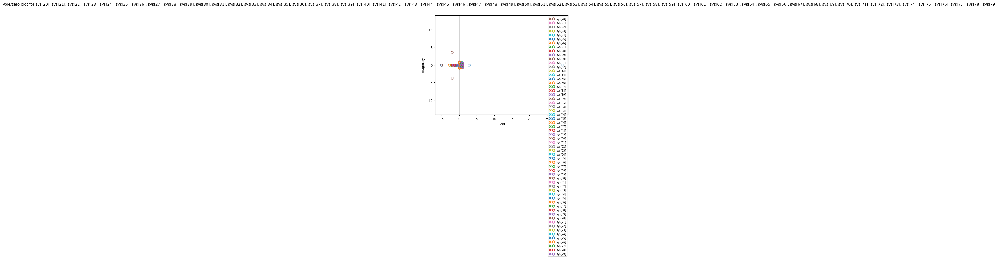

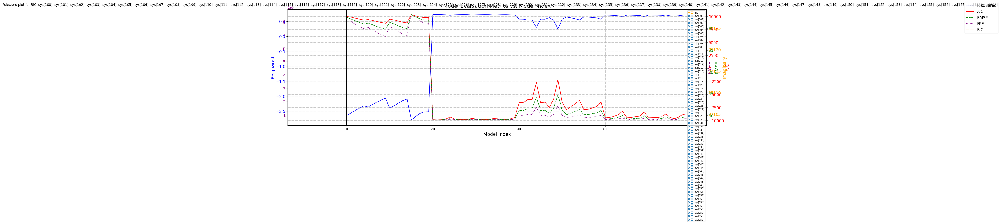

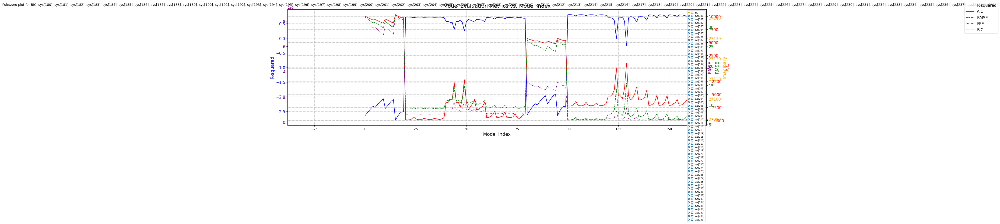

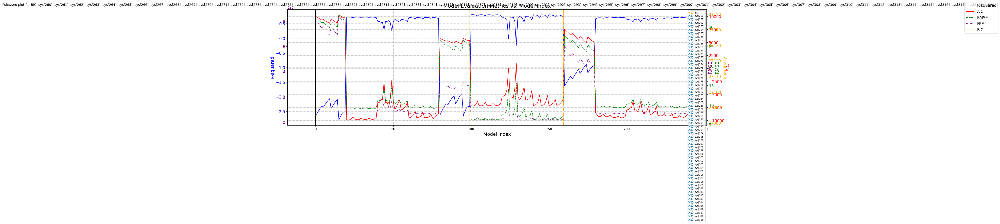

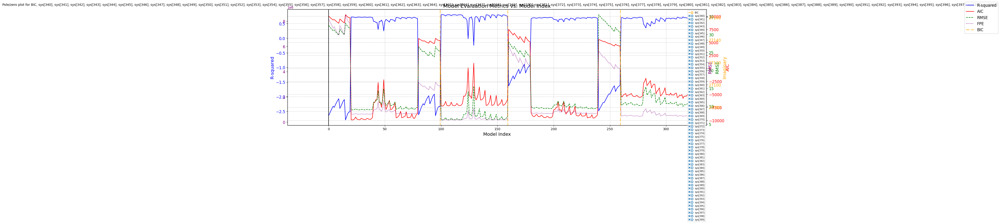

...

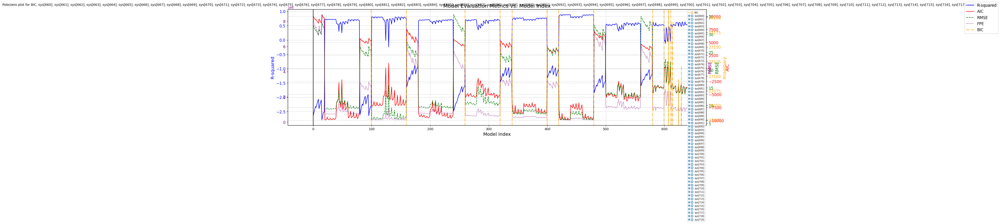

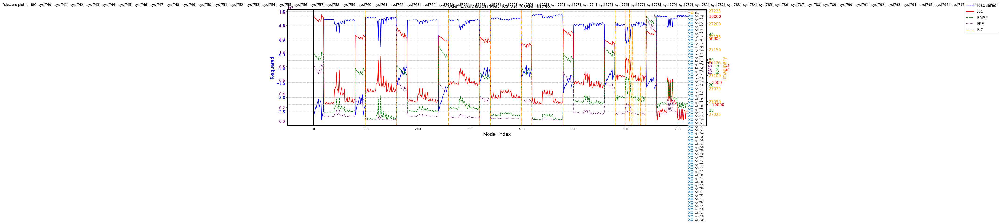

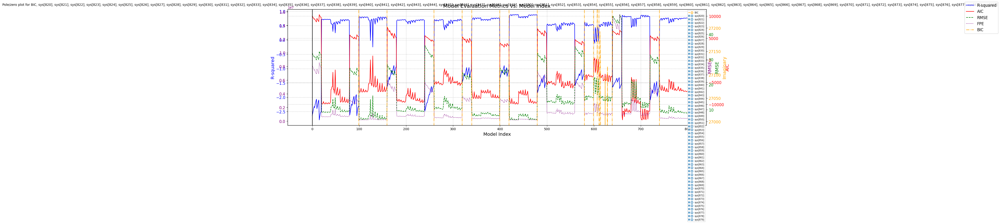

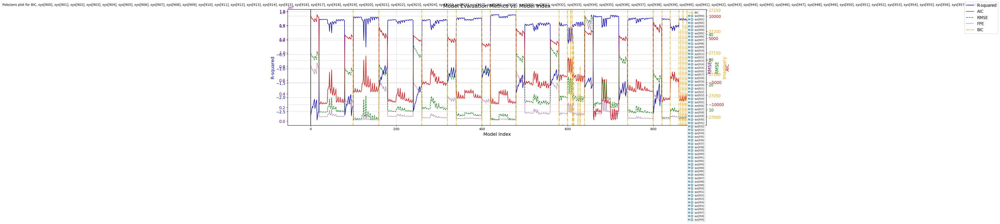

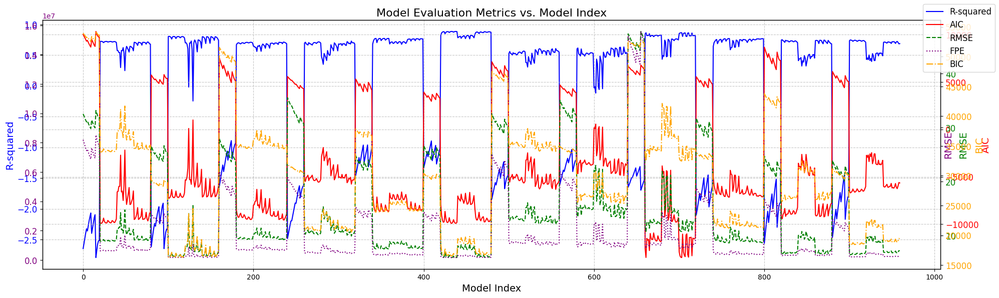

In [ ]:
from re import X
# Find the best model structure (time-invariant modelling)
results_df = pd.DataFrame(columns=['Athlete_Code','Model_Index', 'na', 'nb', 'd', 'AIC', 'Rsq','RMSE','BIC','FPE'])
selected_models = pd.DataFrame(columns=['Athlete_Code','ParamCount','ParamValues','Metrics'])  #ParamCount[na:nb:d] || ParamValues[na,nb] || Metrics[Rsq, AIC, FPE]

# Calculate ARX models to the evaluation data with all possible parameters to find the best fit by checking r-squared and AIC
# Define a max for a, b, and delay (d)
na_max = nb_max = xdelay_max = 4
model_count=0

##Loop through parameters
#Starts 1:1:0 .... 3,3,3               (1,na_max|1,nb_max|xdelay_max) (max=4)
#Starts 1:1:0 .... 4,4,4               (1,na_max+1|1,nb_max+1|xdelay_max+1)(max=4)
#Starts 0:1:0 .... 3,4,4               (na_max|1,nb_max+1|xdelay_max+1)(max=4)

for i in range(len(athlete_list)):
  data = athlete_list[i]
  model_count=0
  print(f"Athlete: {code_name[i]}")
  for na in range(na_max):
    for nb in range(1,nb_max+1):
      for d in range(xdelay_max+1):
        print('\nModel #{} Dataset:{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,code_name[i],na,nb,d))
        #load the associated data using dataloader(data, na, nb, d)
        X_loader, y_loader = dataloader(data, na,  nb, d)
        #print("X_loader:",X_loader)#print("y_loader:",y_loader)


        #Correction to use python## Only when values are equal to zero
        if X_loader.empty:#
            print("Skipping model due to empty X_loader.")
            continue # proceed to next iteration
        if y_loader.empty:
            print("Skipping model due to empty y_loader.")
            continue # proceed to next iteration


        ##Calculate the a and b parameters
        y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, na, nb, d)


        ## Model evaluation for each generated model use r_squared and aic def above
        # Calculate r-squared and AIC and RMSE and BIC and FPE


        print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))



        # Save relevant information to the empty lists
        new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b]})
        results_df = pd.concat([results_df, new_row], ignore_index=True)

        # Update the model counter
        model_count += 1



  #Plot for each player/game
  fig, ax1 = plt.subplots(figsize=(20, 6))
  X_axis = np.arange(len(results_df)) #results_df['Model_Index']

  #For R-square Error
  ax1.plot(X_axis, results_df['Rsq'], color='blue', label='R-squared')
  ax1.set_xlabel('Model Index', fontsize=14)  # Increased font size
  ax1.set_ylabel('R-squared', color='blue', fontsize=14)  # Increased font size
  ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

  #For AIC
  ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
  ax2.plot(X_axis, results_df['AIC'], color='red', label='AIC')
  ax2.set_ylabel('AIC', color='red', fontsize=14)  # Increased font size
  ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size

  #For RMSE
  ax3 = ax1.twinx()
  ax3.plot(X_axis, results_df['RMSE'], color='green', label='RMSE', linestyle='--')
  ax3.set_ylabel('RMSE', color='green', fontsize=14)
  ax3.tick_params(axis='y', labelcolor='green', labelsize=12)

  #For FPE
  ax4 = ax1.twinx()
  ax4.plot(X_axis, results_df['FPE'], color='purple', label='FPE', linestyle=':')
  ax4.set_ylabel('RMSE', color='purple', fontsize=14)
  ax4.tick_params(axis='y', labelcolor='purple', labelsize=12)

  #For BIC
  ax5 = ax4.twinx()
  ax5.plot(X_axis, results_df['BIC'], color='orange', label='BIC', linestyle='-.')
  ax5.set_ylabel('BIC', color='orange', fontsize=14)
  ax5.tick_params(axis='y', labelcolor='orange', labelsize=12)

  # General graphic configs
  fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
  ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
  ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
  plt.title('Model Evaluation Metrics vs. Model Index', fontsize=16)  # Added title with increased font size
  plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()

In [ ]:
results_df

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,0,0,1,0,10018.367043,-2.646508,32.538160,53930.646087,8.198820e+06,[],[108.39783138461151]
1,A1M1,1,0,1,1,9835.450440,-2.561948,32.153837,53739.727384,8.005250e+06,[],[109.04348028704642]
2,A1M1,2,0,1,2,9645.129590,-2.476001,31.758536,53541.294820,7.808617e+06,[],[109.69736133981839]
3,A1M1,3,0,1,3,9461.294271,-2.394950,31.380915,53349.236301,7.623042e+06,[],[110.31272474402218]
4,A1M1,4,0,1,4,9298.054857,-2.324606,31.048527,53177.546996,7.461446e+06,[],[110.85129249317161]
...,...,...,...,...,...,...,...,...,...,...,...,...
955,A6M2,75,3,4,0,-6084.636549,0.711803,6.900740,18997.168715,2.341019e+05,"[2.196355362486569, -1.7895616472482654, 0.584...","[0.8711822507742575, -0.207354745507494, -0.79..."
956,A6M2,76,3,4,1,-6253.779846,0.721650,6.781659,18822.682166,2.260462e+05,"[2.1933011935122946, -1.785554085479578, 0.583...","[1.2161962020509893, -0.8610036760065074, -0.0..."
957,A6M2,77,3,4,2,-5980.964611,0.705790,6.972085,19090.238589,2.388703e+05,"[2.1914459496438137, -1.7862987493540838, 0.58...","[1.0877828060209733, 0.5985560311400908, -2.60..."
958,A6M2,78,3,4,3,-5607.180113,0.682543,7.242186,19458.763800,2.576842e+05,"[2.1862659230030017, -1.780432164054476, 0.583...","[2.3497462940958895, -1.8195026383336055, -1.4..."


In [ ]:
#Select Best Models
scaler = MinMaxScaler()
normalized_metrics = scaler.fit_transform(results_df[['AIC', 'Rsq', 'FPE', 'BIC', 'RMSE']])
# Create a new DataFrame with the normalized metrics
normalized_df = pd.DataFrame(normalized_metrics, columns=['AIC_norm', 'Rsq_norm', 'FPE_norm', 'BIC_norm', 'RMSE_norm'])
selection_df = pd.concat([results_df, normalized_df], axis=1)


#best_models_df = pd.DataFrame(columns=['Athlete_Code','ParamCount','ParamValues','Metrics'])  #ParamCount[na:nb:d] || ParamValues[na,nb] || Metrics[Rsq, AIC, FPE]
best_models_df = pd.DataFrame()


num_models = na_max*nb_max*(xdelay_max+1)
cases = len(results_df)/(num_models) #12

#LOOP for each case (models)
for i in range(int(cases)):
  print("Case: ",i,"Start: ",(i*num_models),"End: ",(i+1)*num_models)
  #Select each dataset models data
  selected_df = selection_df[(i*num_models):(i+1)*num_models].copy()

  #Create a Ranking Selection
  selected_df['AIC_rank'] = selected_df['AIC'].rank()
  selected_df['BIC_rank'] = selected_df['BIC'].rank()

  # Rank by Rsq
  selected_df['Rsq_rank'] = selected_df['Rsq'].rank(ascending=False)  # Note: ascending=False for Rsq

  # Calculate the combined ranking
  selected_df['Ranking'] = selected_df['Rsq_rank'] + selected_df['AIC_rank']+ selected_df['BIC_rank']

  best_df = selected_df.sort_values(by='Ranking', ascending=True).iloc[0]
  #new_row = pd.DataFrame({'Athlete_Code':[filter['Athlete_Code'][0]],'ParamCount'["{}:{}:{}".format(filter['na'][0],filter['nb'][0],filter['d'][0])],'ParamValues':[],'Metrics':[filter['Rsq'][0],filter['AIC'][0],filter['FPE'][0]]})

  #print(best_df)
  #print(selected_df.sort_values(by='Ranking', ascending=True))



  new_row = pd.DataFrame({'Athlete_Code': [best_df['Athlete_Code']],
                          'na': [best_df['na']],
                          'nb': [best_df['nb']],
                          'd': [best_df['d']],
                          'Ranking': [best_df['Ranking']],
                          'AIC_rank': [best_df['AIC_rank']],
                          'Rsq_rank': [best_df['Rsq_rank']],
                          'BIC_rank': [best_df['BIC_rank']],
                          'Rsq': [best_df['Rsq']],
                          'AIC': [best_df['AIC']],
                          'BIC': [best_df['BIC']],
                          'FPE': [best_df['FPE']],
                          'Parameters_a':[parameters_a],
                          'Parameters_b':[parameters_b]})

  best_models_df = pd.concat([best_models_df, new_row], ignore_index=True)

  #print(selected_df.sort_values(by='Rsq', ascending=False)[:3])
  #print(selected_df.sort_values(by='AIC', ascending=True)[:3])
  #print(selected_df.sort_values(by='FPE', ascending=True)[:3])


Case:  0 Start:  0 End:  80
Case:  1 Start:  80 End:  160
Case:  2 Start:  160 End:  240
Case:  3 Start:  240 End:  320
Case:  4 Start:  320 End:  400
Case:  5 Start:  400 End:  480
Case:  6 Start:  480 End:  560
Case:  7 Start:  560 End:  640
Case:  8 Start:  640 End:  720
Case:  9 Start:  720 End:  800
Case:  10 Start:  800 End:  880
Case:  11 Start:  880 End:  960


In [ ]:
best_models_df

,Athlete_Code,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,A1M1,1,1,1,3.0,1.0,1.0,1.0,0.722288,-9913.530782,33997.700448,6.243022e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
1,A1M2,1,1,1,3.0,1.0,1.0,1.0,0.804200,-7265.478476,16258.200534,1.705110e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
2,A2M1,3,4,1,3.0,1.0,1.0,1.0,0.709525,-9552.010572,34542.696412,6.677319e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
3,A2M2,3,4,0,3.0,1.0,1.0,1.0,0.726973,-5770.705147,20526.231224,4.416951e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
4,A3M1,1,1,4,5.0,1.0,3.0,1.0,0.769506,-8639.758298,23883.641210,3.389779e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
5,A3M2,1,3,3,3.0,1.0,1.0,1.0,0.883155,-9910.707407,16531.451194,1.645240e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
6,A4M1,3,4,0,3.0,1.0,1.0,1.0,0.605469,-6328.062712,34093.618148,1.004757e+06,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
7,A4M2,3,4,0,3.0,1.0,1.0,1.0,0.631495,-4879.669261,25366.690850,8.584501e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
8,A5M1,3,1,3,3.0,1.0,1.0,1.0,0.862438,-13518.725705,32476.977362,7.950670e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."
9,A5M2,1,4,3,3.0,1.0,1.0,1.0,0.767969,-7146.870774,21221.631477,3.702689e+05,"[2.1964651223805656, -1.7982833911242504, 0.59...","[2.0605487782682457, -2.967036503315056, 1.795..."


In [ ]:
results_df.sort_values(by='Rsq', ascending=False)
#Rsq: 1,5,0,16,11,6,15,10,61
#AIC: 1,5,0,6,11,16,15,10,61
#FPE: 0,5,1,60,72,71,62,75,76

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
433,A3M2,33,1,3,3,-9910.707407,0.883155,5.962353,16531.451194,1.645240e+05,[0.9814369680556814],"[2.932728065301651, -2.001857153835328, 1.9265..."
438,A3M2,38,1,4,3,-9901.566060,0.883029,5.965100,16540.571662,1.647114e+05,[0.9812392004312193],"[2.8639899515086413, -1.6277990114795693, 1.30..."
437,A3M2,37,1,4,2,-9896.558087,0.882847,5.970198,16552.038664,1.650287e+05,[0.9807220125123799],"[1.6566828504294762, -0.08374367146297601, -0...."
432,A3M2,32,1,3,2,-9896.053258,0.882729,5.973680,16552.563283,1.651854e+05,[0.9815957472667369],"[1.970561973402509, -1.7815802940105494, 2.656..."
428,A3M2,28,1,2,3,-9831.545309,0.881029,6.016823,16610.632865,1.675075e+05,[0.9827136340774631],"[1.5078325739352036, 1.1531925924292383]"
...,...,...,...,...,...,...,...,...,...,...,...,...
80,A1M2,0,0,1,0,5734.788243,-2.617079,26.580349,29260.978261,3.151764e+06,[],[89.04864822739364]
0,A1M1,0,0,1,0,10018.367043,-2.646508,32.538160,53930.646087,8.198820e+06,[],[108.39783138461151]
95,A1M2,15,0,4,0,5773.944368,-2.647249,26.653921,29291.135944,3.171371e+06,[],"[118.83185264517081, -71.70992504561283, -92.5..."
16,A1M1,16,0,4,1,10090.407399,-2.680223,32.666905,53990.761234,8.265967e+06,[],"[149.72151907171812, -89.92180942856018, -117...."


In [163]:
#Simulation best model structure
number_a=1
number_b=2
d=0

data = athlete_list[2]
# print the relative dataframe and check its columns
y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)


'''y = np.zeros(len(data))
y_auto = np.zeros(len(data))
y_auto[:max(number_a,number_b+d)] = data['y'][0]
#works for (0,1,0),(1,0,0)
for k in range(max(number_a,number_b +d), len(X_loader)):
  ##AUTOMATIC
  # Add the contribution from autoregressive terms (endogenous variables)
  for i_a in range(1, number_a + 1):
      y_auto[k] += den[i_a-1] * y_auto[k - i_a]  # Note: parameters_a starts at index 0
  # Add the contribution from exogenous input terms (with delay d)
  for j_b in range(number_b):
    #print("Input: ",'u-{}'.format(j_b+d))
    y_auto[k] += num[j_b] * X_loader['u-{}'.format(j_b+d)].iloc[k-j_b-d]'''



#Ploting
plt.figure(figsize=(20, 6))
X_axis = np.arange(0,y_loader.shape[0])
print(X_axis)
# Plot the actual values (y_loader)
plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
# Plot the original data (y)    *AUTOMATIC
plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

# Add labels and title
plt.xlabel('Time / Index')
plt.ylabel('Values')
plt.title('Comparison of Real data (y_loader) and Model Prediction (y_auto)')
plt.legend()  # Add a legend
plt.grid(True) # Add grid lines for better readability
# Adjust the y-axis limits if necessary for better visualization
#plt.ylim([50, 200])
plt.show()

NameError: name 'athlete_list' is not defined

Athlete: A1M1

Model #0 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
<ipython-input-18-d00dfd0a3003>:20: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  one_4_all = pd.concat([one_4_all, new_row], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7151370788107558, Akaike's information criteria: -9714.73901872165
Athlete: A1M2

Model #1 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.7955200529599864, Akaike's information criteria: -7070.118165155924
Athlete: A2M1

Model #2 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.6811110453980813, Akaike's information criteria: -8841.284435520352
Athlete: A2M2

Model #3 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.7026399147460015, Akaike's information criteria: -5400.713516721713
Athlete: A3M1

Model #4 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7022255172489347, Akaike's information criteria: -7132.891272813207
Athlete: A3M2

Model #5 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.8462559688927636, Akaike's information criteria: -8652.283686215738
Athlete: A4M1

Model #6 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.5374379556280356, Akaike's information criteria: -5252.8176172296835
Athlete: A4M2

Model #7 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.5993736617647822, Akaike's information criteria: -4479.816848069687
Athlete: A5M1

Model #8 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.8465261016561005, Akaike's information criteria: -12778.087154642883
Athlete: A5M2

Model #9 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.6847175090407909, Akaike's information criteria: -5654.61974715965
Athlete: A6M1

Model #10 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


its regression yield r squared: 0.7396106742423703, Akaike's information criteria: -9172.183180759372
Athlete: A6M2

Model #11 
with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay
its regression yield r squared: 0.7332213832569769, Akaike's information criteria: -6473.832309395477


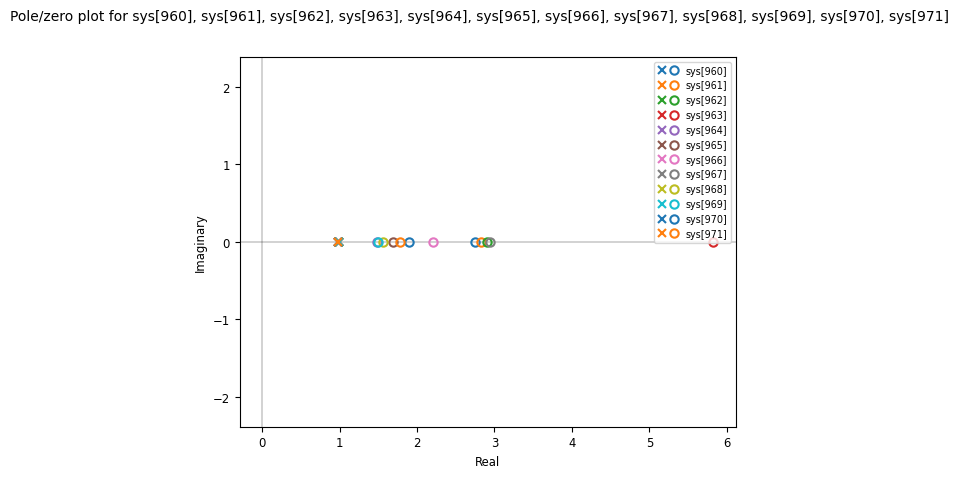

In [ ]:
#Select one model and applie to all the datasets
number_a=1
number_b=2
d=0
one_4_all = pd.DataFrame(columns=['Athlete_Code', 'na', 'nb', 'd','SSG','TC' ,'AIC', 'Rsq','RMSE','BIC','FPE'])
model_count=0

for i in range(len(athlete_list)):
  data = athlete_list[i]
  print(f"Athlete: {code_name[i]}")
  print('\nModel #{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,number_a,number_b,d))
  #load the associated data using dataloader(data, na, nb, d)

  y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)



  new_row = pd.DataFrame({'Athlete_Code': code_name[i],'SSG':[SSG],'TC':[tau], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b], 'na': [number_a], 'nb': [number_b], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})

  one_4_all = pd.concat([one_4_all, new_row], ignore_index=True)



  print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))

  # Save relevant information to the empty lists
  #new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})
  #results_df = pd.concat([results_df, new_row], ignore_index=True)
        # Update the model counter
  model_count += 1



#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?



In [ ]:
one_4_all

In [ ]:
#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?
athlete_codes = one_4_all['Athlete_Code'].to_list()

#Plot for each player/game
fig, ax1 = plt.subplots(figsize=(20, 6))
X_axis = athlete_codes #results_df['Model_Index']

#plot parameters A
ax1.plot(X_axis, one_4_all['Parameters_a'].str[0].tolist(), color='blue', label='A1')
#ax1.plot(X_axis, one_4_all['Param_a'].str[1].tolist(), color='blue', label='A2')
#ax1.plot(X_axis, one_4_all['Param_a'].str[2].tolist(), color='blue', label='A3')
ax1.set_xlabel('Athlete Code', fontsize=14)  # Increased font size
ax1.set_ylabel('Value', fontsize=14)  # Increased font size
ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

#Plot parameters B
ax1.plot(X_axis, one_4_all['Parameters_b'].str[0].tolist(), color='red', label='B0')
ax1.plot(X_axis, one_4_all['Parameters_b'].str[1].tolist(), color='orange', label='B1')
#ax1.plot(X_axis, one_4_all['Param_b'].str[2].tolist(), color='red', label='B2')

'''#First param B
x2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(X_axis, one_4_all['Param_b'].str[0].tolist(), color='red', label='AIC')
#ax2.plot(X_axis, one_4_all['Param_b'].str[1].tolist(), color='red', label='AIC')
ax2.set_ylabel('Param_b', color='red', fontsize=14)  # Increased font size
ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size
'''


# General graphic configs
fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
plt.title('Model Parameters for each dataset', fontsize=16)  # Added title with increased font size
plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()


In [ ]:
den, num

In [ ]:
one_4_all

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Extract the 'b' parameter values and athlete codes
b_values = one_4_all['Parameters_b'].to_list()
athlete_codes = one_4_all['Athlete_Code'].to_list()

num_athletes = len(athlete_codes)
num_params = len(b_values[0])  # Assuming all athletes have the same number of 'b' parameters

# Create an array to store the parameter values for each position
param_positions = [[] for _ in range(num_params)]
for athlete_params in b_values:
    for i, param_value in enumerate(athlete_params):
        param_positions[i].append(param_value)

# Create the plot
plt.figure(figsize=(10, 6))  # Adjust figure size as needed

for i, position_values in enumerate(param_positions):
    plt.plot(athlete_codes, position_values, label=f"Position {i}")

# Customize the plot
plt.xlabel("Athlete Code")
plt.ylabel("Parameter Value")
plt.title("B parameter comparison by position")
plt.legend()
plt.grid(True)
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability

plt.show()

In [ ]:
best_models_df

In [ ]:
one_4_all


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game1: 0.7151370788107558


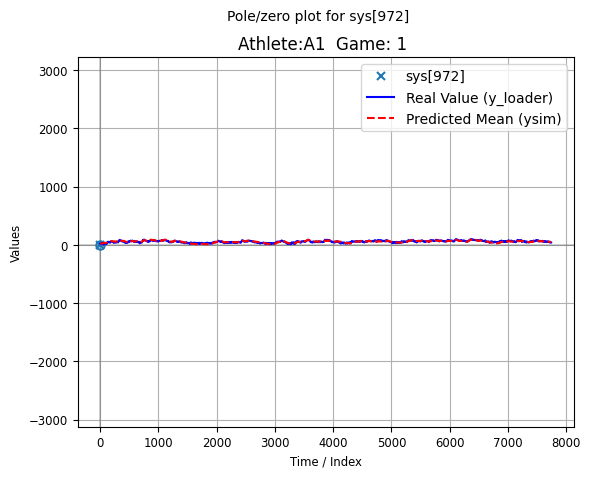


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.7955200529599864

/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


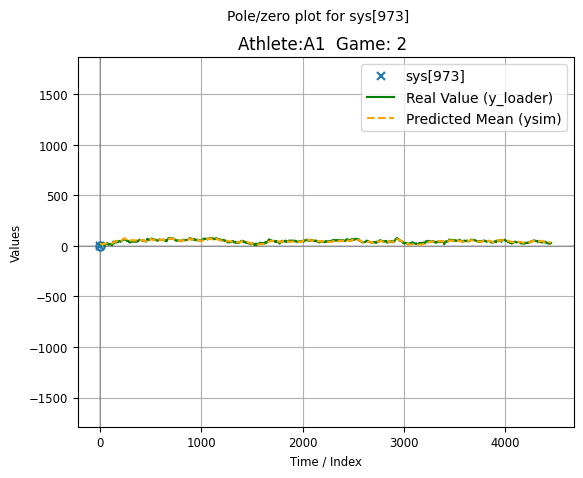

<ipython-input-19-cd8586648f00>:73: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  athlete_mean_model = pd.concat([athlete_mean_model, new_row], ignore_index=True)
/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(



Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.7955200529599864


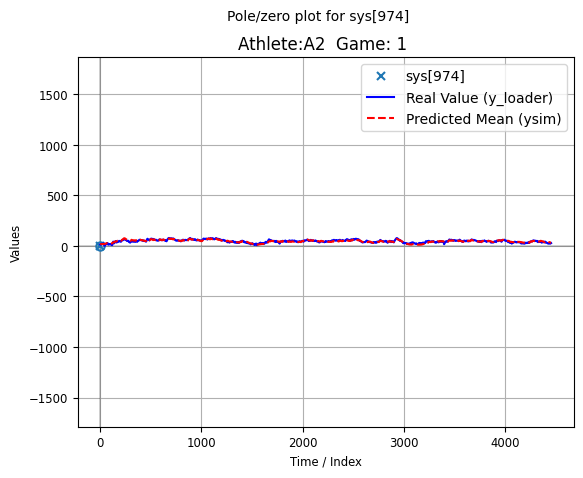


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game2: 0.6811110453980813


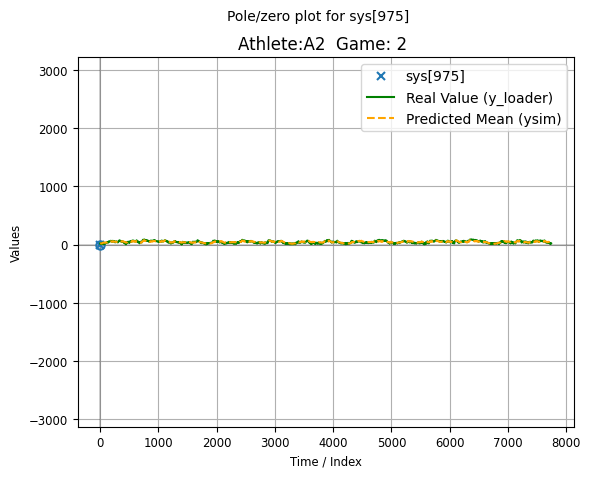


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game1: 0.6811110453980813


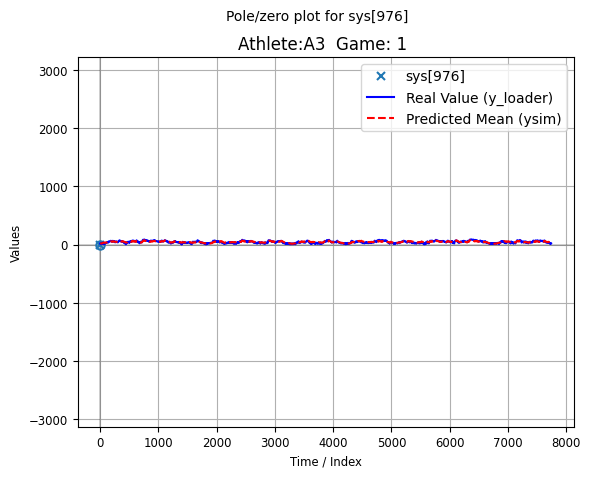


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game2: 0.7026399147460015


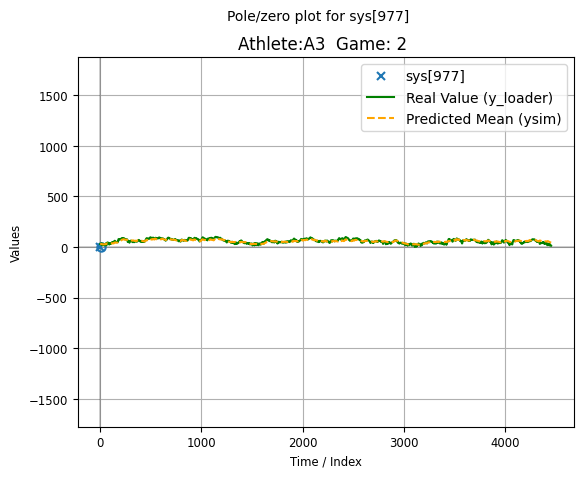


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game1: 0.7026399147460015


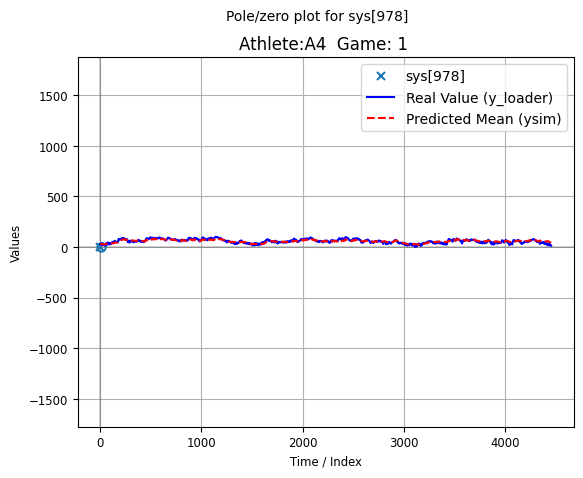


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game2: 0.7022255172489347


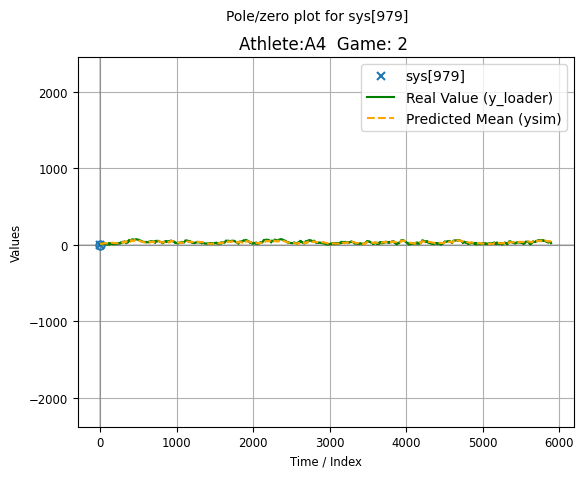


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game1: 0.7022255172489347


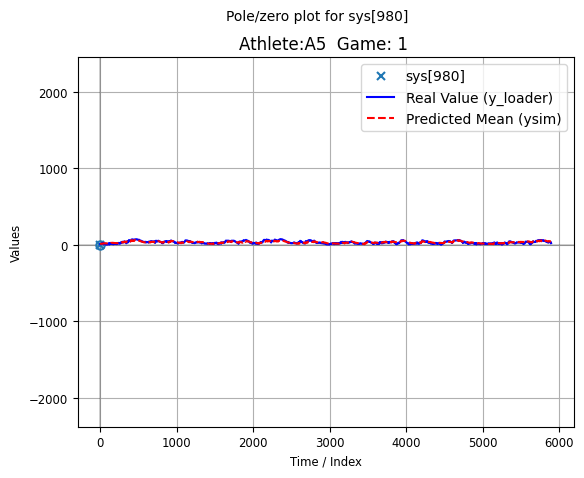


Model with 1 a parameters, 2 b parameters and 0 time delay
Game2: 0.8462559688927636


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


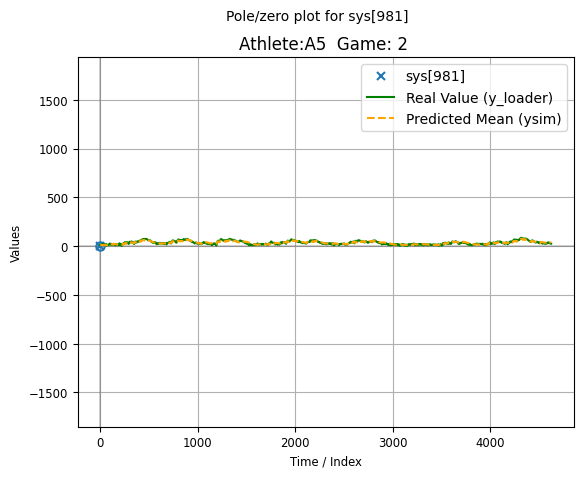


Model with 1 a parameters, 2 b parameters and 0 time delay
Game1: 0.8462559688927636


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


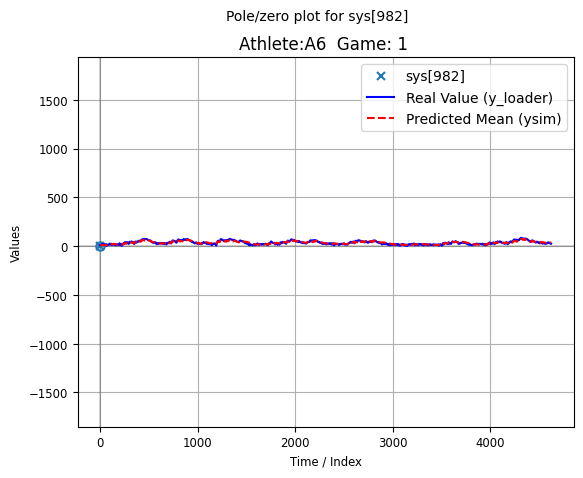


Model with 1 a parameters, 2 b parameters and 0 time delay


/usr/local/lib/python3.10/dist-packages/control/pzmap.py:318: FutureWarning: pole_zero_plot() return value of poles, zeros is deprecated; use pole_zero_map()
  warnings.warn(


Game2: 0.5374379556280356


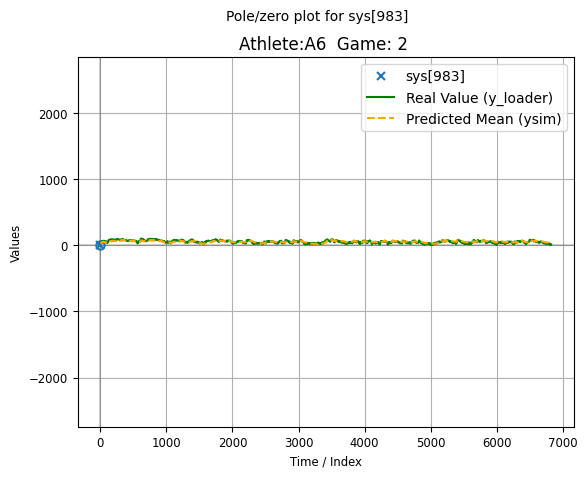

In [ ]:
# Biological interpretation

#First Order Model
##
#  Code Here
##


#Second Order Model
##
#  Code Here
##




#Athlete Average Moder
#structure: 1:2:0
#for p_case in best_models_df.iterrows():
counter = 0
number_a=1
number_b=2
d=0
athlete_mean_model = pd.DataFrame(columns=['Athlete', 'Parameters_a', 'Parameters_b', 'Rsq_M1', 'AIC_M1', 'Rsq_M2', 'AIC_M2'])

for pcase in one_4_all.iterrows():
  #print(pcase)

  if pcase[1]["Athlete_Code"][3] == '1':    #First Game
    params_a_memory = pcase[1]['Parameters_a']
    params_b_memory = pcase[1]['Parameters_b']
    counter += 1

  else: #second game
    mean_a = (params_a_memory + pcase[1]['Parameters_a']) / 2
    mean_b = (params_b_memory + pcase[1]['Parameters_b']) / 2

    #Simulation
    #Simulation for first Game
    y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared1, aic1, Rmse1, bic1, fpe1 = model_generator(athlete_list[counter-1], number_a, number_b, d)

    ## Simulate values of Y
    #Plot Simulation
    print("Game1:",r_squared1)
    plt.plot(y_loader, label='Real Value (y_loader)', color='blue')
    plt.plot(np.arange(len(ysim)), ysim, label='Predicted Mean (ysim)', color='red', linestyle='--')
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title('Athlete:{}  Game: 1 '.format(pcase[1]['Athlete_Code'][:2]))
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability
    plt.show()


      ##Simulation for Second Game
    X_loader, y_loader = dataloader(athlete_list[counter], number_a, number_b, d)
    y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared2, aic2, Rmse2, bic2, fpe2 = model_generator(athlete_list[counter], number_a, number_b, d)

    #Plot Simulation
    print("Game2:",r_squared2)
    plt.plot(y_loader, label='Real Value (y_loader)', color='green')
    plt.plot(np.arange(len(ysim)), ysim, label='Predicted Mean (ysim)', color='orange', linestyle='--')
    plt.xlabel('Time / Index')
    plt.ylabel('Values')
    plt.title('Athlete:{}  Game: 2 '.format(pcase[1]['Athlete_Code'][:2]))
    plt.legend()  # Add a legend
    plt.grid(True) # Add grid lines for better readability
    plt.show()


    #Save to the Dataframe
    new_row = pd.DataFrame({'Athlete': [pcase[1]['Athlete_Code'][:2]],'Parameters_a':[mean_a], 'Parameters_b':[mean_b], 'Rsq_M1':[r_squared1], 'AIC_M1':[aic1], 'Rsq_M2':[r_squared2], 'AIC_M2':[aic2]})
    athlete_mean_model = pd.concat([athlete_mean_model, new_row], ignore_index=True)
    plt.show()







In [ ]:
athlete_mean_model

 # Time-varying dynamics

In [ ]:
na = 2
nb = 1
d = 1

#INCORPORATE ASSIGNMENT DATA
X_loader, y_loader = dataloader(athlete_list[1], na, nb, d)
N = len(y_loader)
y = y_loader#.values.reshape(-1,1)
u = X_loader['u-{}'.format(d)].values.reshape(-1,1)

N = len(y_loader)
t = np.arange(N)                                        # example for 'time'/points 0-(N-1)
f = 2 * np.pi / 40                                      # f = chosen frequence for square wave


e = np.random.randn(N, 1) * np.sqrt(0.16)               # Noise vector e-N(0,0.16), 'standard normal distribution'is mean 0, standard deviation 1.
a1 = np.ones((N,1)) * -1                                # a1 = constant
a2 = np.ones((N,1)) * 0.25                              # a2 = constant (if you have a2 means it is second order system)
b0 = np.ones((N,1))
b0[200:899] = 2                                         # b0 = variable
# delay = 1


y = np.zeros((N,1))                                     # start with an empty vector for y
for k in range(max(na, nb+d-1), N):
    y[k] = -a1[k] * y[k-1] - a2[k] * y[k-2] + b0[k] * u[k-d] + e[k]  # if we have a2 means it is a second order system.

plt.plot(u)
plt.show()
plt.plot(y)

In [ ]:
# Time-variant - recursive ARX

dm = 3                              # Number of parameters to estimate
# Initialise matrix
X = np.zeros((dm,1))              # prepare an input matrix that can be used in the loop, size is the number of parameters
P = 1000 * np.eye(dm)            # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
a_hat = np.ones((dm,1))         # Minimum value to not create error in case of 0 division


# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))


# Loop over all the data
for k in range(max(na, nb+d-1), N):
    # 1. Update the matrix X with the new data
    X[0] = - y[k-1]
    X[1] = - y[k-2]
    X[2] = u[k-d]

    # 2. Update gain matrix g
    g = (P @ X) / (1 +( X.T @ P @ X))

    # 3. Update covariance matrix P
    P = P - g @ X.T @ P

    # 4. Re-estimate the parameter coefficients
    yhat =  X.T @ a_hat      # y = data vector * parameters vetor
    error = y[k] - yhat
    a_hat = a_hat + g * error
    # OR: a_hat = a_hat + g * ( y(k) - (X' * a_hat))

    # 5. Store estimates (get the diagonal elements of a_hat that correspond to a1, a2, b0)
    a1est[k] = a_hat[0]
    a2est[k] = a_hat[1]
    b0est[k] = a_hat[2]

# Simulate model (step 2)
ysim2 = np.zeros((N,1))
for k in range(max(na, nb+d-1), N):
    ysim2[k] = - a1est[k] * ysim2[k-1] - a2est[k] * ysim2[k-2] + b0est[k] * u[k-d]

plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)

plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.legend()
plt.show()

plt.plot(y)
plt.plot(ysim2)

print('R2:',r_2(y, ysim2))


In [ ]:
#Time-variant - recursive ARX RDW (rectancular data weighing)
Win = 500;                  # window size
# Initialise matrix
X_add = np.zeros((dm,1))
X_remove = np.zeros((dm,1))
P = 1000 * np.eye(dm)             # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
A_hat = np.ones((dm,1))           # Minimum value to don't create error in case of 0 division
# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))

for k in range(max(na, nb+d-1), N):
    # 1. Update the matrix X with the new data
    X_add[0] = -y[k-1]
    X_add[1] = -y[k-2]
    X_add[2] = u[k-1]

    # 2. Update gain matrix
    g = P @ X_add / (1 + X_add.T @ P @ X_add)  # inverse of matrix is 'devision'

    # 3. Update covariance matrix P
    P = P - g @ X_add.T @ P

    # 4. Re-estimate the parameter coefficients based on the new data
    yhat = X_add.T @ A_hat
    error = y[k] - yhat
    A_hat = A_hat + g * error

    # 5 Remove effect of old data every data at (k-s)th instant
    if k - Win - max(nb + d - 1, na) > 0:
        # 5.a Update the matrix X(k-s) with the new data
        X_remove[0] = -y[k - Win - 1] #a1
        X_remove[1] = -y[k - Win - 2] #a2
        X_remove[2] = u[k - Win - d] #b0
        # 5.b Update gain matrix
        g = -P @ X_remove / (1 + X_remove.T @ P @ X_remove)
        # 5.c Update covariance matrix P
        P = (P - g @ X_remove.T @ P)
        # 5.d Re-estimate the parameter coefficients based on the new data
        yhat = X_remove.T @ A_hat
        error = y[k - Win] - yhat
        A_hat = A_hat + g * error

    a1est[k] = A_hat[0]
    a2est[k] = A_hat[1]
    b0est[k] = A_hat[2]

# Simulate model (step 3)
ysim3 = np.zeros((N,1))
for k in range(max(na, nb+d-1), N):
    ysim3[k] = -a1est[k] * ysim3[k-1] - a2est[k] * ysim3[k-2] + b0est[k] * u[k-d]


plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)
plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.show()
plt.plot(y)
plt.plot(ysim3)

print('R2:',r_2(y, ysim3))




In [ ]:
#Step 4 - Time-varying recursive ARX with EWP (exponentially weighted past)
Alpha = 0.985

# Initialise matrix
X = np.zeros((dm,1))
P = 1000 * np.eye(dm)             # Covariance matrix set to large value because of uncertainty at the beginning due to lack of measurement
a_hat = np.ones((dm,1))       # Minimum value to don't create error in case of 0 division
# Information to be stored in the loop
a1est = np.zeros((N,1))
a2est = np.zeros((N,1))
b0est = np.zeros((N,1))

#Loop over all the data
for k in range(max(na, nb+d-1), N):

    # 1. Update the matrix X with the new data
    X[0] = -y[k-1]
    X[1] = -y[k-2]
    X[2] = u[k-d]

    # 2. Update gain matrix
    g = P @ X / (Alpha + X.T @ P @ X)

    # 3. Update covariance matrix P
    P = (P - g @ X.T @ P) / Alpha

    # 4. Re-estimate the parameter coefficients based on the new data
    yhat = X.T @ a_hat
    error = y[k] - yhat
    a_hat = a_hat + g * error

    a1est[k] = a_hat[0]
    a2est[k] = a_hat[1]
    b0est[k] = a_hat[2]


# Simulate model
ysim4 = np.zeros((N,1))

for k in range(max(na, nb+d-1), N):
    ysim4[k] = -a1est[k] * ysim4[k-1] - a2est[k] * ysim4[k-2] + b0est[k] * u[k-d]

plt.plot(a1est)
plt.plot(a2est)
plt.plot(b0est)

plt.plot(a1)
plt.plot(a2)
plt.plot(b0)
plt.show()
plt.plot(y)
plt.plot(ysim4)

print('R2:',r_2(y, ysim4))


In [ ]:
#2ºSystem Identification
def calcmodel(data, na, nb, d):
    # Load the associated data using dataloader(data, na, nb, d)

    X_loader, y_loader = dataloader(data, na, nb, d)


    # Estimate the a and b parameters vector [a0...an, b0...bm].T by the formula inv(X.T dot X) dot X.T dot y
    params = np.linalg.inv(X_loader.T @ X_loader) @ X_loader.T @ y_loader
    #params = np.linalg.solve(X_loader.T, X_loader) @ X_loader.T @ y_loader
    params = params.values


    parameters_a = params[:na]
    parameters_b = params[na:]


    # Optional: Calculate the predicted values of Y via Matrix-Vector multiplication (this is for prediction, not simulation)
    Y_pred = np.dot(X_loader, params)


    #Calculate a simulation using the predicted parameters use the following structure:
    ysim = np.zeros((len(X_loader)+1,1))  # the plus one is because the first value is initialized and not simulated

    ysim[0] = y_loader.values[0]    # initialize the first value
    max_lag = max(na, nb + d)  # Maximum lag across both endogenous and exogenous variables

    for k in range(max_lag, len(X_loader)):
        #Add the contribution from autoregressive terms (endogenous variables)
        for i_a in range(1, na + 1):
            #ysim[k] += parameters_a[i_a - 1] * ysim[k - i_a]
            ysim[k] += parameters_a[i_a - 1] * X_loader.iloc[k, i_a]

        #Add the contribution from exogenous input ter\ms (with delay d)
        for j_b in range(1, nb + 1):
            #ysim[k] += estimation[i_a - 1] * ysim[k - i_a - X_loader['u-{}'.format(d)]]                    #to get the column at delay u-d use this syntax X_loader['u-{}'.format(d)]
            ysim[k] += parameters_b[j_b-1] * X_loader['u-{}'.format(d)].iloc[k-j_b]


    # Calculate r-squared
    y_loader = y_loader.values.reshape(-1,1)
    SS_res = np.sum((y_loader - ysim[1:]) ** 2)  # Residual sum of squares
    SS_tot = np.sum((y_loader - np.mean(y_loader)) ** 2)  # Total sum of squares
    rsq = 1 - (SS_res / SS_tot)
    #print("ss_red:",SS_res,"ss_tot",SS_tot,"RSQ:",rsq)


    # Calculate AIC
    n = len(y_loader)  # Number of observations
    # Number of parameters (including intercept)
    aic =  2 * (na + nb) + len(y_loader) * np.log(1 - rsq) # Evaluates the complexicity of the Model


    return Y_pred, ysim, params, rsq, aic




print(calcmodel(data,0,1,0))
print(calcmodel(data,1,0,0))


In [ ]:
pds = pd.DataFrame(columns=["Athlete", "na", "nb", "d", "Params", "RSQ", "AIC"])

# Parameter ranges
na_max = nb_max = xdelay_max = 3

for i in range(len(athlete_list)):
    print(f"Athlete: {code_name[i]}")


In [ ]:
pds

In [ ]:
# Initialize an empty DataFrame to store results
pds = pd.DataFrame(columns=["Athlete", "na", "nb", "d", "Params", "RSQ", "AIC"])

# Parameter ranges
na_max = nb_max = xdelay_max = 3
# Iterate over each athlete
for i in range(len(athlete_list)):
    print(f"Athlete: {code_name[i]}")
    athlete = athlete_list[i]
    # Iterate over possible values of na, nb, and d
    for na in range(1,na_max+1):
      for nb in range(1,nb_max+1):
        for d in range(1,xdelay_max+1):
              # Calculate model with specified parameters
              Y_pred, ysim, params, rsq, aic = calcmodel(athlete, na=na, nb=nb, d=d)


              # Add the result as a new row to the DataFrame
              pds = pd.concat([pds, pd.DataFrame({
                  "Athlete": f"{code_name[i]}",
                  "na": [na],
                  "nb": [nb],
                  "d": [d],
                  "Params": [params],
                  "RSQ": [rsq],
                  "AIC": [aic]
              })], ignore_index=True)

# Display final DataFrame with all results
#print(pds)


#Logs
'''
Run   Time
1     24:23       #First version(5)
2     24:23          #Add to dataframe(5)
3     25:xx        #No Idea(5)
4     5:xx         #Normal(3)
'''

In [ ]:

A1M1 = pds[pds['Athlete'] == "A4M1"]
percentile_75_1 = A1M1['AIC'].quantile(0.9)
percentile_75_2 = np.percentile(A1M1['AIC'],90)
#print(percentile_75_1, percentile_75_2)
#A1M1 = A1M1[A1M1['RSQ'] >= percentile_75]
#print(A1M1)

percentile_95 = A1M1['RSQ'].quantile(0.75)
fig, ax1 = plt.subplots()
plt.figure(figsize=(10, 6))
ax1.plot(A1M1["RSQ"])
ax1.set_xlabel('Model')
ax1.set_ylabel('RSQ')
ax2 = ax1.twinx()
ax2.plot(A1M1["AIC"], color='red')
ax2.set_ylabel('AIC', color='red')
ax1.legend(['RSQ'], loc='upper left')
ax2.legend(['AIC'], loc='upper right')
plt.show()
#pds
#Logs
'''
Total: 1500 Models
'''
A1M1[['na', 'nb','d','RSQ','AIC']][0:]

In [ ]:
#3 Biological interpretation

# 2º Practical assignment

In [6]:
uploaded = files.upload()

Saving Mutation334_C1_In.csv to Mutation334_C1_In.csv
Saving Mutation334_C1_Out.csv to Mutation334_C1_Out.csv
Saving Mutation334_C2_In.csv to Mutation334_C2_In.csv
Saving Mutation334_C2_Out.csv to Mutation334_C2_Out.csv
Saving Mutation334_C3_In.csv to Mutation334_C3_In.csv
Saving Mutation334_C3_Out.csv to Mutation334_C3_Out.csv
Saving Mutation334_C4_In.csv to Mutation334_C4_In.csv
Saving Mutation334_C4_Out.csv to Mutation334_C4_Out.csv
Saving Mutation334_C5_In.csv to Mutation334_C5_In.csv
Saving Mutation334_C5_Out.csv to Mutation334_C5_Out.csv
Saving Mutation334_C6_In.csv to Mutation334_C6_In.csv
Saving Mutation334_C6_Out.csv to Mutation334_C6_Out.csv
Saving Mutation343_C1_In.csv to Mutation343_C1_In.csv
Saving Mutation343_C1_Out.csv to Mutation343_C1_Out.csv
Saving Mutation343_C2_In.csv to Mutation343_C2_In.csv
Saving Mutation343_C2_Out.csv to Mutation343_C2_Out.csv
Saving Mutation343_C3_In.csv to Mutation343_C3_In.csv
Saving Mutation343_C3_Out.csv to Mutation343_C3_Out.csv
Saving Mut

In [121]:
M_334_df = pd.DataFrame()
M_343_df = pd.DataFrame()
WT_df = pd.DataFrame()
Unknown_df = pd.DataFrame()

# Mutant 334
for i in range(1,7):
  load_input = pd.read_csv('Mutation334_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('Mutation334_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  M_334_df = pd.concat([M_334_df, load_input, load_output], axis=1)

# Mutant 343
for i in range(1,7):
  load_input = pd.read_csv('Mutation343_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('Mutation343_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  M_343_df = pd.concat([M_343_df, load_input, load_output], axis=1)

# WildType
for i in range(1,7):
  load_input = pd.read_csv('WildType_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('WildType_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  WT_df = pd.concat([WT_df, load_input, load_output], axis=1)


# WildType
for i in range(1,3):
  load_input = pd.read_csv('Unknown_C{}_In.csv'.format(i), names=['u_C{}'.format(i)])
  load_output = pd.read_csv('Unknown_C{}_Out.csv'.format(i), names=['y_C{}'.format(i)])
  Unknown_df = pd.concat([Unknown_df, load_input, load_output], axis=1)

In [172]:

# Mutant 334

M334_C1_In_df = pd.read_csv('Mutation334_C1_In.csv', names=['u'])
M334_C2_In_df = pd.read_csv('Mutation334_C2_In.csv', names=['u'])
M334_C3_In_df = pd.read_csv('Mutation334_C3_In.csv', names=['u'])
M334_C4_In_df = pd.read_csv('Mutation334_C4_In.csv', names=['u'])
M334_C5_In_df = pd.read_csv('Mutation334_C5_In.csv', names=['u'])
M334_C6_In_df = pd.read_csv('Mutation334_C6_In.csv', names=['u'])

M334_C1_Out_df = pd.read_csv('Mutation334_C1_Out.csv', names=['y'])
M334_C2_Out_df = pd.read_csv('Mutation334_C2_Out.csv', names=['y'])
M334_C3_Out_df = pd.read_csv('Mutation334_C3_Out.csv', names=['y'])
M334_C4_Out_df = pd.read_csv('Mutation334_C4_Out.csv', names=['y'])
M334_C5_Out_df = pd.read_csv('Mutation334_C5_Out.csv', names=['y'])
M334_C6_Out_df = pd.read_csv('Mutation334_C6_Out.csv', names=['y'])

Mutant_334_list = [M334_C1_In_df,
M334_C2_In_df,
M334_C3_In_df,
M334_C4_In_df,
M334_C5_In_df,
M334_C6_In_df,
M334_C1_Out_df,
M334_C2_Out_df,
M334_C3_Out_df,
M334_C4_Out_df,
M334_C5_Out_df,
M334_C6_Out_df] #12

# Mutant 343

M343_C1_In_df = pd.read_csv('Mutation343_C1_In.csv', names=['u'])
M343_C2_In_df = pd.read_csv('Mutation343_C2_In.csv', names=['u'])
M343_C3_In_df = pd.read_csv('Mutation343_C3_In.csv', names=['u'])
M343_C4_In_df = pd.read_csv('Mutation343_C4_In.csv', names=['u'])
M343_C5_In_df = pd.read_csv('Mutation343_C5_In.csv', names=['u'])
M343_C6_In_df = pd.read_csv('Mutation343_C6_In.csv', names=['u'])

M343_C1_Out_df = pd.read_csv('Mutation343_C1_Out.csv', names=['y'])
M343_C2_Out_df = pd.read_csv('Mutation343_C2_Out.csv', names=['y'])
M343_C3_Out_df = pd.read_csv('Mutation343_C3_Out.csv', names=['y'])
M343_C4_Out_df = pd.read_csv('Mutation343_C4_Out.csv', names=['y'])
M343_C5_Out_df = pd.read_csv('Mutation343_C5_Out.csv', names=['y'])
M343_C6_Out_df = pd.read_csv('Mutation343_C6_Out.csv', names=['y'])

Mutant_343_list = [M343_C1_In_df,
M343_C2_In_df,
M343_C3_In_df,
M343_C4_In_df,
M343_C5_In_df,
M343_C6_In_df,
M343_C1_Out_df,
M343_C2_Out_df,
M343_C3_Out_df,
M343_C4_Out_df,
M343_C5_Out_df,
M343_C6_Out_df] #12

# WildType

WildType_C1_In_df = pd.read_csv('WildType_C1_In.csv', names=['u'])
WildType_C2_In_df = pd.read_csv('WildType_C2_In.csv', names=['u'])
WildType_C3_In_df = pd.read_csv('WildType_C3_In.csv', names=['u'])
WildType_C4_In_df = pd.read_csv('WildType_C4_In.csv', names=['u'])
WildType_C5_In_df = pd.read_csv('WildType_C5_In.csv', names=['u'])
WildType_C6_In_df = pd.read_csv('WildType_C6_In.csv', names=['u'])

WildType_C1_Out_df = pd.read_csv('WildType_C1_Out.csv', names=['y'])
WildType_C2_Out_df = pd.read_csv('WildType_C2_Out.csv', names=['y'])
WildType_C3_Out_df = pd.read_csv('WildType_C3_Out.csv', names=['y'])
WildType_C4_Out_df = pd.read_csv('WildType_C4_Out.csv', names=['y'])
WildType_C5_Out_df = pd.read_csv('WildType_C5_Out.csv', names=['y'])
WildType_C6_Out_df = pd.read_csv('WildType_C6_Out.csv', names=['y'])

WildType_list = [WildType_C1_In_df,
WildType_C2_In_df,
WildType_C3_In_df,
WildType_C4_In_df,
WildType_C5_In_df,
WildType_C6_In_df,
WildType_C1_Out_df,
WildType_C2_Out_df,
WildType_C3_Out_df,
WildType_C4_Out_df,
WildType_C5_Out_df,
WildType_C6_Out_df] #12

# Unknown

Unknown_C1_In_df = pd.read_csv('Unknown_C1_In.csv', names=['u'])
Unknown_C2_In_df = pd.read_csv('Unknown_C2_In.csv', names=['u'])

Unknown_C1_Out_df = pd.read_csv('Unknown_C1_Out.csv', names=['y'])
Unknown_C2_Out_df = pd.read_csv('Unknown_C2_Out.csv', names=['y'])

UnknownType_list = [Unknown_C1_In_df,
Unknown_C2_In_df,
Unknown_C1_Out_df,
Unknown_C2_Out_df] #4


In [104]:
M_334_df[118:122]

,u_C1,y_C1,u_C2,y_C2,u_C3,y_C3,u_C4,y_C4,u_C5,y_C5,u_C6,y_C6
118,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000
119,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000,0,0.000000
120,1,0.000000,1,0.000000,1,0.000000,1,0.000000,1,0.000000,1,0.000000
121,1,-0.000368,1,0.003944,1,0.008307,1,-0.001548,1,0.009084,1,0.006624


In [139]:
for variation in [M_334_df, M_343_df, WT_df, Unknown_df]:
  for i in range(0,len(variation.columns),2):
    input = variation.columns[i]
    output = variation.columns[i+1]
    print(input, output)
    data = pd.concat([variation[input], variation[output]], axis=1)
    data2 = variation[[input, output]].copy()
    if (data.values == data2.values).all():
      print('Inputs are all the Equal!')

data2

u_C1 y_C1
Inputs are all the Equal!
u_C2 y_C2
Inputs are all the Equal!
u_C3 y_C3
Inputs are all the Equal!
u_C4 y_C4
Inputs are all the Equal!
u_C5 y_C5
Inputs are all the Equal!
u_C6 y_C6
Inputs are all the Equal!
u_C1 y_C1
Inputs are all the Equal!
u_C2 y_C2
Inputs are all the Equal!
u_C3 y_C3
Inputs are all the Equal!
u_C4 y_C4
Inputs are all the Equal!
u_C5 y_C5
Inputs are all the Equal!
u_C6 y_C6
Inputs are all the Equal!
u_C1 y_C1
Inputs are all the Equal!
u_C2 y_C2
Inputs are all the Equal!
u_C3 y_C3
Inputs are all the Equal!
u_C4 y_C4
Inputs are all the Equal!
u_C5 y_C5
Inputs are all the Equal!
u_C6 y_C6
Inputs are all the Equal!
u_C1 y_C1
Inputs are all the Equal!
u_C2 y_C2
Inputs are all the Equal!


,u_C2,y_C2
0,0,0.000000
1,0,0.000000
2,0,0.000000
3,0,0.000000
4,0,0.000000
...,...,...
1281,1,-0.008968
1282,1,-0.010152
1283,1,-0.010319
1284,1,-0.014991


Inputs are all the Equal!
Inputs are all the Equal!
Inputs are all the Equal!


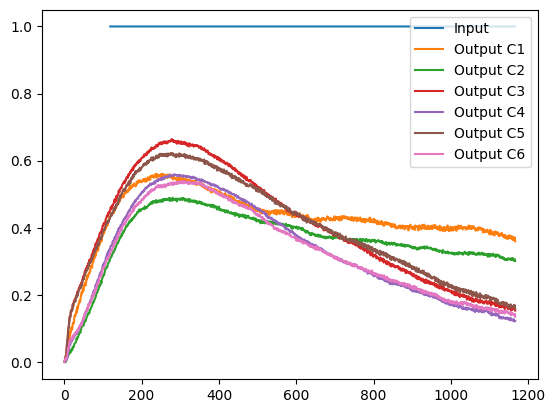

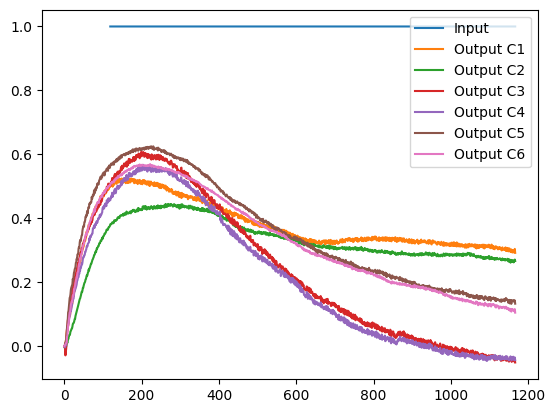

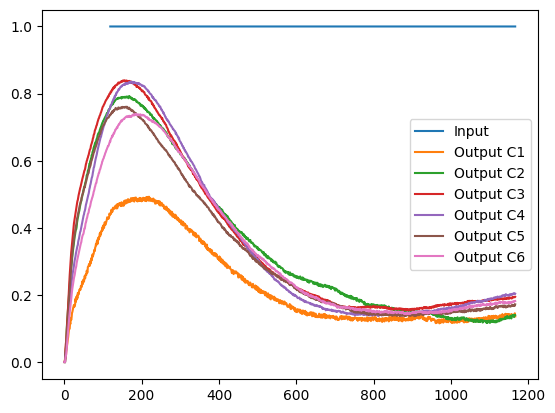

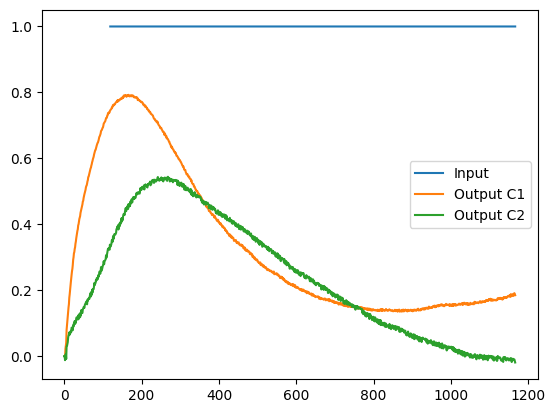

In [202]:
for variation in [M_334_df, M_343_df, WT_df]:
  i= 0
  if variation.iloc[:, i].all() == variation.iloc[:, i+2].all() == variation.iloc[:, i+4].all() == variation.iloc[:, i+6].all() == variation.iloc[:, i+8].all() == variation.iloc[:, i+10].all():
      print('Inputs are all the Equal!')



for variation in [M_334_df, M_343_df, WT_df, Unknown_df]:
  counter = 1
  #input = variation.iloc[119:, 0] # Access column by index using iloc
  #plt.plot(input, label='Input'.format(counter))
  input = variation.iloc[119:, 0] # Access column by index using iloc
  plt.plot(input, label='Input'.format(counter))
  for i in range(0,len(variation.columns),2): #0,2,..8,10 (6X)
    #variation.iloc[:, i] = variation.iloc[:, i] - variation.iloc[:, i].min()
    #variation.iloc[:, i] = variation.iloc[:, i] - variation.iloc[:, i].mean()
    #variation.iloc[:, i] = variation.iloc[:, i] / variation.iloc[:, i].std()

    output = variation.iloc[119:, i+1] # Access next column for output



    plt.plot(output, label='Output C{}'.format(counter))
    plt.legend()
    counter += 1
  plt.show()





In [173]:
#1ºData Preparation
#Pre-processing && Ploting
for lists in [Mutant_334_list,Mutant_343_list,WildType_list,UnknownType_list]:
  pds = pd.DataFrame(columns=['Input','Output'])


#Remove the first 119 values (0 or 1) for all the datasets and reset the index for 0
all_datasets_df = [df.iloc[119:].reset_index(drop=True) for df in [M_334_df, M_343_df, WT_df, Unknown_df]]


# 2. System identification

In [165]:
data = [M_334_df, M_343_df, WT_df, Unknown_df][i]
data

,u_C1,y_C1,u_C2,y_C2,u_C3,y_C3,u_C4,y_C4,u_C5,y_C5,u_C6,y_C6
0,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000
1,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000
2,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000
3,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000
4,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000,0,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...
1281,1,0.13916,1,0.13859,1,0.19373,1,0.20339,1,0.16927,1,0.18023
1282,1,0.13626,1,0.13378,1,0.19409,1,0.20399,1,0.16765,1,0.17953
1283,1,0.14153,1,0.14058,1,0.19328,1,0.20335,1,0.17064,1,0.18141
1284,1,0.14536,1,0.13916,1,0.19274,1,0.20446,1,0.16757,1,0.18138


In [205]:
na_max = nb_max = xdelay_max = 4
model_count=0
code_name = ["M_334","M_343","WT","Unknown"]
all_datasets_df = [df.iloc[119:].reset_index(drop=True) for df in [M_334_df, M_343_df, WT_df, Unknown_df]]

final_results_df = pd.DataFrame(columns=['Athlete_Code','Model_Index','na','nb','d','AIC','Rsq','RMSE','BIC','FPE','Parameters_a','Parameters_b'])

##Loop through parameters
#Starts 1:1:0 .... 3,3,3               (1,na_max|1,nb_max|xdelay_max) (max=4)
#Starts 1:1:0 .... 4,4,4               (1,na_max+1|1,nb_max+1|xdelay_max+1)(max=4)
#Starts 0:1:0 .... 3,4,4               (na_max|1,nb_max+1|xdelay_max+1)(max=4)
counter = nm_count = 0
for variation in [M_334_df, M_343_df, WT_df, Unknown_df]:

  for i in range(0,len(variation.columns),2):
    input = variation.columns[i]
    output = variation.columns[i+1]
    data = pd.concat([variation[input].rename("u"), variation[output].rename("y")], axis=1)
    model_counter = 0

    for na in range(na_max):
      for nb in range(1,nb_max+1):
        for d in range(xdelay_max+1):
          #print(data)
          #Calculate Model
          y_loader, ysim, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, na, nb, d)

          #Save Results
          new_row = pd.DataFrame({'Athlete_Code': code_name[nm_count-1],'Model_Index': [model_counter], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b]})
          final_results_df = pd.concat([final_results_df, new_row], ignore_index=True)


          model_counter += 1
  nm_count += 1







Model with 0 a parameters, 1 b parameters and 0 time delay

Model with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-205-960a04d28118>:30: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_results_df = pd.concat([final_results_df, new_row], ignore_index=True)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 1 time delay

Model with 0 a parameters, 1 b parameters and 2 time delay

Model with 0 a parameters, 1 b parameters and 3 time delay

Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)




Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encounte


Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay

Model with 0 a parameters, 4 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay

Model with 0 a parameters, 2 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay

Model with 0 a parameters, 3 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay

Model with 0 a parameters, 3 b parameters and 4 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay

Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b parameters and 0 time delay

Model with 1 a parameters, 4 b parameters and 1 time delay

Model with 1 a parameters, 4 b parameters and 2 time delay

Model with 1 a parameters, 4 b parameters and 3 time delay

Model with 1 a parameters, 4 b paramete

<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 1 b parameters and 4 time delay

Model with 0 a parameters, 2 b parameters and 0 time delay

Model with 0 a parameters, 2 b parameters and 1 time delay

Model with 0 a parameters, 2 b parameters and 2 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 2 b parameters and 3 time delay

Model with 0 a parameters, 2 b parameters and 4 time delay

Model with 0 a parameters, 3 b parameters and 0 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 1 time delay

Model with 0 a parameters, 3 b parameters and 2 time delay

Model with 0 a parameters, 3 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 3 b parameters and 4 time delay

Model with 0 a parameters, 4 b parameters and 0 time delay

Model with 0 a parameters, 4 b parameters and 1 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 2 time delay

Model with 0 a parameters, 4 b parameters and 3 time delay


<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)
<ipython-input-175-3c8cf6670396>:59: RuntimeWarning: divide by zero encountered in scalar divide
  tau = -1 / np.log(dominant_pole)



Model with 0 a parameters, 4 b parameters and 4 time delay

Model with 1 a parameters, 1 b parameters and 0 time delay

Model with 1 a parameters, 1 b parameters and 1 time delay

Model with 1 a parameters, 1 b parameters and 2 time delay

Model with 1 a parameters, 1 b parameters and 3 time delay

Model with 1 a parameters, 1 b parameters and 4 time delay

Model with 1 a parameters, 2 b parameters and 0 time delay

Model with 1 a parameters, 2 b parameters and 1 time delay

Model with 1 a parameters, 2 b parameters and 2 time delay

Model with 1 a parameters, 2 b parameters and 3 time delay

Model with 1 a parameters, 2 b parameters and 4 time delay

Model with 1 a parameters, 3 b parameters and 0 time delay

Model with 1 a parameters, 3 b parameters and 1 time delay

Model with 1 a parameters, 3 b parameters and 2 time delay

Model with 1 a parameters, 3 b parameters and 3 time delay

Model with 1 a parameters, 3 b parameters and 4 time delay

Model with 1 a parameters, 4 b paramete

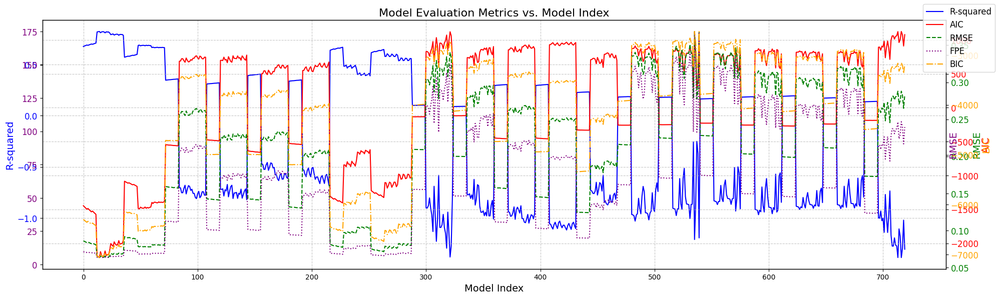

In [190]:
#Plot for each player/game
fig, ax1 = plt.subplots(figsize=(20, 6))
X_axis = np.arange(len(final_results_df)) #results_df['Model_Index']

#For R-square Error
ax1.plot(X_axis, final_results_df['Rsq'], color='blue', label='R-squared')
ax1.set_xlabel('Model Index', fontsize=14)  # Increased font size
ax1.set_ylabel('R-squared', color='blue', fontsize=14)  # Increased font size
ax1.tick_params(axis='y', labelcolor='blue', labelsize=12)  # Increased tick label size

#For AIC
ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.plot(X_axis, final_results_df['AIC'], color='red', label='AIC')
ax2.set_ylabel('AIC', color='red', fontsize=14)  # Increased font size
ax2.tick_params(axis='y', labelcolor='red', labelsize=12)  # Increased tick label size

#For RMSE
ax3 = ax1.twinx()
ax3.plot(X_axis, final_results_df['RMSE'], color='green', label='RMSE', linestyle='--')
ax3.set_ylabel('RMSE', color='green', fontsize=14)
ax3.tick_params(axis='y', labelcolor='green', labelsize=12)

#For FPE
ax4 = ax1.twinx()
ax4.plot(X_axis, final_results_df['FPE'], color='purple', label='FPE', linestyle=':')
ax4.set_ylabel('RMSE', color='purple', fontsize=14)
ax4.tick_params(axis='y', labelcolor='purple', labelsize=12)

#For BIC
ax5 = ax4.twinx()
ax5.plot(X_axis, final_results_df['BIC'], color='orange', label='BIC', linestyle='-.')
ax5.set_ylabel('BIC', color='orange', fontsize=14)
ax5.tick_params(axis='y', labelcolor='orange', labelsize=12)

# General graphic configs
fig.legend(loc="upper right", fontsize=12)  # Add a legend for both plots, increased font size
ax1.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
ax2.grid(True, linestyle='--', alpha=0.7)  # Added grid with dashed lines and transparency
plt.title('Model Evaluation Metrics vs. Model Index', fontsize=16)  # Added title with increased font size
plt.tight_layout()  # Adjust layout to prevent overlapping elements
plt.show()

In [195]:
final_results_df.sort_values(by='Rsq', ascending=False)

,Athlete_Code,Model_Index,na,nb,d,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
14,Unknown,14,1,1,2,-2210.868721,0.822062,0.063536,-7057.957893,5.195439,[0.9885461046149534],[0.005228353666433904]
17,Unknown,17,1,2,1,-2195.049662,0.820135,0.063879,-7036.981877,5.259894,[0.9885461046148104],"[-0.0003678499999680653, 0.0055962036664203236]"
13,Unknown,13,1,1,1,-2195.185670,0.819633,0.064110,-7040.374873,5.293839,[0.9887981709601034],[0.005115382036030049]
20,Unknown,20,1,3,0,-2180.303551,0.818339,0.064197,-7017.078810,5.320697,[0.9885461046149548],"[1.2282245727513205e-13, -0.000367850000048876..."
18,Unknown,18,1,2,2,-2180.369934,0.818307,0.064060,-7024.238691,5.285596,[0.9890008303292618],"[0.01490780395549192, -0.00988324295421771]"
...,...,...,...,...,...,...,...,...,...,...,...,...
717,WT,33,2,3,1,1076.013715,-1.296816,0.282543,-3204.924357,103.143971,"[0.5773678607655528, 0.4224479185116377]","[-0.012250999999913581, 0.022507233651319684, ..."
719,WT,35,2,3,3,1078.120875,-1.303592,0.282884,-3196.788204,103.233085,"[0.572202295919566, 0.42759194618649854]","[0.010011766246979178, -0.023663993912721136, ..."
321,M_334,33,2,3,1,1121.353719,-1.379500,0.340542,-2726.201274,149.836504,"[0.6207919369339903, 0.3790426772820538]","[-0.00601729999998946, -0.01896120867778952, 0..."
713,WT,29,2,2,1,1123.007583,-1.384675,0.287934,-3166.105217,107.033582,"[0.5745699221446352, 0.4251813184836593]","[-0.012250999999941843, 0.01229858079093974]"


In [196]:
#Select Best Models
scaler = MinMaxScaler()
normalized_metrics = scaler.fit_transform(final_results_df[['AIC', 'Rsq', 'FPE', 'BIC', 'RMSE']])
# Create a new DataFrame with the normalized metrics
normalized_df = pd.DataFrame(normalized_metrics, columns=['AIC_norm', 'Rsq_norm', 'FPE_norm', 'BIC_norm', 'RMSE_norm'])
selection_df = pd.concat([final_results_df, normalized_df], axis=1)


best_models_df = pd.DataFrame()


num_models = na_max*nb_max*(xdelay_max+1)
cases = len(final_results_df)/(num_models) #12

#LOOP for each case (models)
for i in range(int(cases)):
  print("Case: ",i,"Start: ",(i*num_models),"End: ",(i+1)*num_models)
  #Select each dataset models data
  selected_df = selection_df[(i*num_models):(i+1)*num_models].copy()

  #Create a Ranking Selection
  selected_df['AIC_rank'] = selected_df['AIC'].rank()
  selected_df['BIC_rank'] = selected_df['BIC'].rank()

  # Rank by Rsq
  selected_df['Rsq_rank'] = selected_df['Rsq'].rank(ascending=False)  # Note: ascending=False for Rsq

  # Calculate the combined ranking
  selected_df['Ranking'] = selected_df['Rsq_rank'] + selected_df['AIC_rank']#+ selected_df['BIC_rank']
  best_df = selected_df.sort_values(by='Ranking', ascending=True).iloc[0]

  new_row = pd.DataFrame({'Athlete_Code': [best_df['Athlete_Code']],
                          'na': [best_df['na']],
                          'nb': [best_df['nb']],
                          'd': [best_df['d']],
                          'Ranking': [best_df['Ranking']],
                          'AIC_rank': [best_df['AIC_rank']],
                          'Rsq_rank': [best_df['Rsq_rank']],
                          'BIC_rank': [best_df['BIC_rank']],
                          'Rsq': [best_df['Rsq']],
                          'AIC': [best_df['AIC']],
                          'BIC': [best_df['BIC']],
                          'FPE': [best_df['FPE']],
                          'Parameters_a':[parameters_a],
                          'Parameters_b':[parameters_b]})

  #Save new model
  best_models_df = pd.concat([best_models_df, new_row], ignore_index=True)

  #print(selected_df.sort_values(by='Rsq', ascending=False)[:3])
  #print(selected_df.sort_values(by='AIC', ascending=True)[:3])
  #print(selected_df.sort_values(by='FPE', ascending=True)[:3])

Case:  0 Start:  0 End:  36
Case:  1 Start:  36 End:  72
Case:  2 Start:  72 End:  108
Case:  3 Start:  108 End:  144
Case:  4 Start:  144 End:  180
Case:  5 Start:  180 End:  216
Case:  6 Start:  216 End:  252
Case:  7 Start:  252 End:  288
Case:  8 Start:  288 End:  324
Case:  9 Start:  324 End:  360
Case:  10 Start:  360 End:  396
Case:  11 Start:  396 End:  432
Case:  12 Start:  432 End:  468
Case:  13 Start:  468 End:  504
Case:  14 Start:  504 End:  540
Case:  15 Start:  540 End:  576
Case:  16 Start:  576 End:  612
Case:  17 Start:  612 End:  648
Case:  18 Start:  648 End:  684
Case:  19 Start:  684 End:  720


In [197]:
best_models_df

,Athlete_Code,na,nb,d,Ranking,AIC_rank,Rsq_rank,BIC_rank,Rsq,AIC,BIC,FPE,Parameters_a,Parameters_b
0,Unknown,1,1,2,2.0,1.0,1.0,1.0,0.822062,-2210.868721,-7057.957893,5.195439,[0.9994611184689967],[0.00012198911819480231]
1,Unknown,1,1,1,2.0,1.0,1.0,1.0,0.688587,-1493.961178,-6537.534201,7.831579,[0.9994611184689967],[0.00012198911819480231]
2,Unknown,0,3,3,2.0,1.0,1.0,5.0,0.358445,-562.141194,-4714.455486,31.796807,[0.9994611184689967],[0.00012198911819480231]
3,Unknown,0,3,3,2.0,1.0,1.0,9.0,0.320699,-488.963914,-4992.163763,25.595237,[0.9994611184689967],[0.00012198911819480231]
4,Unknown,0,3,3,2.0,1.0,1.0,1.0,0.405261,-659.129015,-4997.359888,25.491545,[0.9994611184689967],[0.00012198911819480231]
5,Unknown,0,3,3,2.0,1.0,1.0,4.0,0.349266,-543.956887,-5196.968307,21.810745,[0.9994611184689967],[0.00012198911819480231]
6,M_334,0,3,3,2.0,1.0,1.0,1.0,0.667943,-1405.133349,-6534.161689,7.673098,[0.9994611184689967],[0.00012198911819480231]
7,M_334,0,3,3,2.0,1.0,1.0,1.0,0.646402,-1324.680320,-6734.655733,6.560616,[0.9994611184689967],[0.00012198911819480231]
8,M_334,0,2,3,7.0,2.0,5.0,8.0,0.102106,-133.968302,-3993.954741,56.233123,[0.9994611184689967],[0.00012198911819480231]
9,M_334,0,1,3,10.0,1.0,9.0,5.0,0.089841,-118.682556,-4118.890762,51.382176,[0.9994611184689967],[0.00012198911819480231]



Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay


<ipython-input-208-3f769bc9ab73>:25: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  one_to_all = pd.concat([one_to_all, new_row], ignore_index=True)



Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.4959324378236563, Akaike's information criteria: 1072.6670126028444


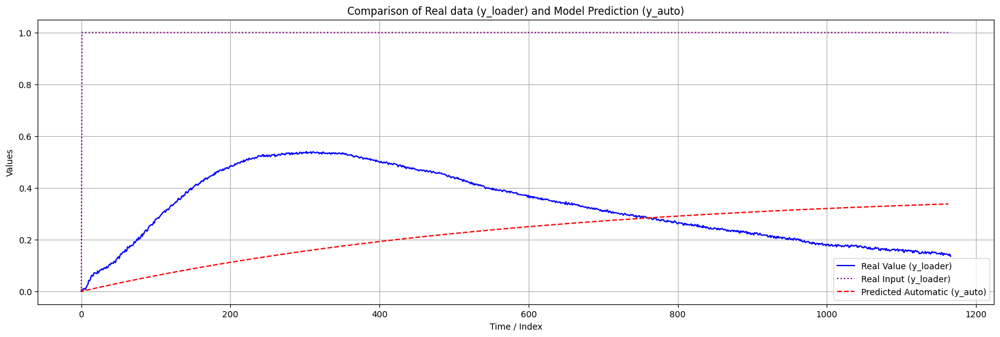


Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.9569409334149688, Akaike's information criteria: 1269.9567290400807


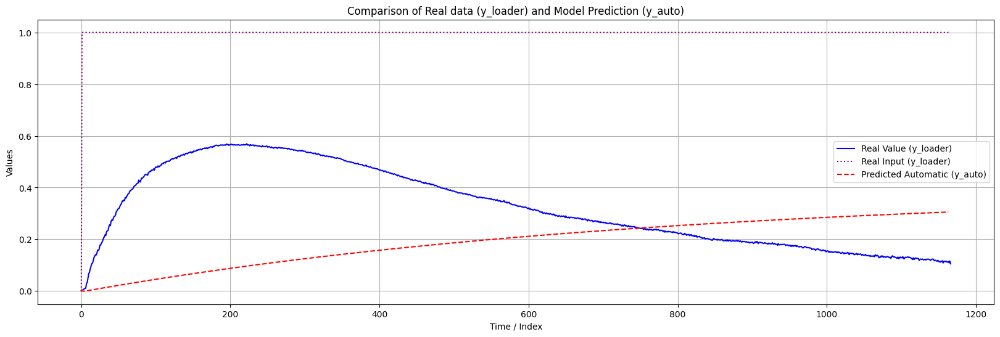


Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.333828314269236, Akaike's information criteria: 994.5016080792066


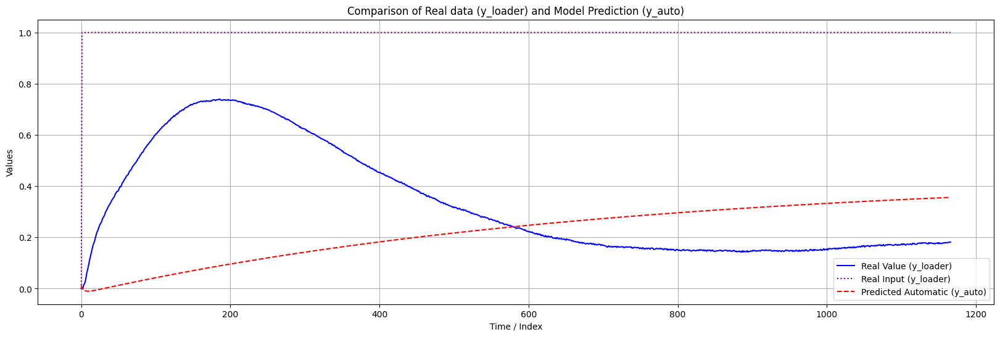


Model with 3 a parameters, 1 b parameters and 0 time delay

Model with 3 a parameters, 1 b parameters and 0 time delay
its regression yield r squared: -1.622809500270865, Akaike's information criteria: 1130.3824273276289


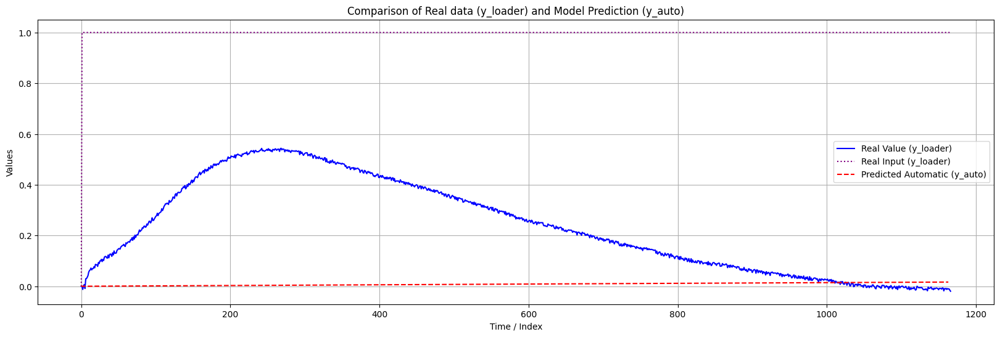

In [208]:
#Select one model and applie to all the datasets
number_a=3
number_b=1
d=0
one_to_all = pd.DataFrame(columns=['Athlete_Code', 'na', 'nb', 'd','SSG','TC' ,'AIC', 'Rsq','RMSE','BIC','FPE'])
counter = nm_count = 0


for variation in all_datasets_df:
  nm_count += 1
  for i in range(0,len(variation.columns),2):
    input = variation.columns[i]
    output = variation.columns[i+1]
    data = pd.concat([variation[input].rename("u"), variation[output].rename("y")], axis=1)

    #print('\nModel #{} \nwith {} a parameters, {} b parameters and {} time delay'.format(model_count,number_a,number_b,d))
    #load the associated data using dataloader(data, na, nb, d)

    y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)



    new_row = pd.DataFrame({'Athlete_Code': code_name[nm_count-1],'SSG':[SSG],'TC':[tau], 'Parameters_a':[parameters_a], 'Parameters_b':[parameters_b], 'na': [number_a], 'nb': [number_b], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})

    one_to_all = pd.concat([one_to_all, new_row], ignore_index=True)



  print("its regression yield r squared: {}, Akaike's information criteria: {}".format(r_squared, aic))

  # Save relevant information to the empty lists
  #new_row = pd.DataFrame({'Athlete_Code': code_name[i],'Model_Index': [model_count], 'na': [na], 'nb': [nb], 'd': [d], 'AIC': [aic], 'Rsq': [r_squared],'RMSE':[Rmse], 'BIC':[bic],'FPE':[fpe]})
  #results_df = pd.concat([results_df, new_row], ignore_index=True)
        # Update the model counter
  model_count += 1


  #Plot
  #Ploting
  plt.figure(figsize=(20, 6))
  X_axis = np.arange(0,y_loader.shape[0])
  #print(X_axis)
  # Plot the actual values (y_loader)
  plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
  plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
  # Plot the original data (y)    *AUTOMATIC
  plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

  # Add labels and title
  plt.xlabel('Time / Index')
  plt.ylabel('Values')
  plt.title('Comparison of Real data (y_loader) and Model Prediction (y_auto)')
  plt.legend()  # Add a legend
  plt.grid(True) # Add grid lines for better readability
  # Adjust the y-axis limits if necessary for better visualization
  #plt.ylim([50, 200])
  plt.show()


#Do the parameter estimates vary a lot between the subjects or between the volleyball matches?



In [162]:
one_to_all

,Athlete_Code,na,nb,d,SSG,TC,AIC,Rsq,RMSE,BIC,FPE,Parameters_a,Parameters_b
0,M_334,1,1,2,0.456469,-86.805582,-2210.868721,0.822062,0.063536,-7057.957893,5.195439,[0.9885461046149534],[0.005228353666433904]
1,M_334,1,1,2,0.404544,-153.770586,-1467.057647,0.682277,0.078621,-6511.329792,7.955279,[0.9935179057038688],[0.002622292886405667]
2,M_334,1,1,2,0.470592,-558.383086,723.616733,-0.752224,0.260607,-3436.297453,87.408053,[0.9982107174852854],[0.000842021243120017]
3,M_334,1,1,2,0.401558,-671.294916,695.212337,-0.713858,0.224627,-3817.530903,64.938795,[0.9985114507551115],[0.000597738923006059]
4,M_334,1,1,2,0.449266,-408.631284,544.378587,-0.523764,0.226119,-3800.538391,65.804588,[0.9975557980022473],[0.001098097162702321]
5,M_334,1,1,2,0.384377,-535.517191,585.581947,-0.573494,0.203064,-4076.493160,53.069587,[0.9981343887335746],[0.0007170989227502964]
6,M_343,1,1,2,0.397732,-93.446849,-871.586599,0.494624,0.095896,-6001.650457,11.835360,[0.989355784480516],[0.00423354037221191]
7,M_343,1,1,2,0.355286,-112.454112,-1186.117016,0.604500,0.075994,-6598.512893,7.432656,[0.991146905402264],[0.003145384311067975]
8,M_343,1,1,2,0.126461,-2965.649523,813.298257,-0.879087,0.302620,-3052.763883,117.862936,[0.9996628625823011],[4.263487047801882e-05]
9,M_343,1,1,2,0.132158,-2477.059493,731.011143,-0.762352,0.278350,-3267.285886,99.715283,[0.9995963770035659],[5.334204132756442e-05]


In [ ]:
#Simulation best model structure
number_a=1
number_b=2
d=0

data = athlete_list[2]
# print the relative dataframe and check its columns
y_loader, y_auto, parameters_a, parameters_b, SSG, tau, r_squared, aic, Rmse, bic, fpe = model_generator(data, number_a, number_b, d)


#Ploting
plt.figure(figsize=(20, 6))
X_axis = np.arange(0,y_loader.shape[0])
print(X_axis)
# Plot the actual values (y_loader)
plt.plot(data['y'], label='Real Value (y_loader)', color='blue')
plt.plot(data['u'], label='Real Input (y_loader)', color='purple', linestyle=':')
# Plot the original data (y)    *AUTOMATIC
plt.plot(X_axis, y_auto, label='Predicted Automatic (y_auto)', color='red', linestyle='--')

# Add labels and title
plt.xlabel('Time / Index')
plt.ylabel('Values')
plt.title('Comparison of Real data (y_loader) and Model Prediction (y_auto)')
plt.legend()  # Add a legend
plt.grid(True) # Add grid lines for better readability
# Adjust the y-axis limits if necessary for better visualization
#plt.ylim([50, 200])
plt.show()

In [ ]:
def dataloader(data, na, nb, d):

    # Initialize empty arrays for lagged features
    u = data['u']
    X = pd.DataFrame()
    y = data['y']


    # Create lagged features for input ('b' parameters)
    for i in range(0,nb):
        X['u-{}'.format(i + d)] = u.shift(i + d)
    # Create lagged features for output ('a' parameters)
    for i in range(1,na+1):
        X['y-{}'.format(i)] = y.shift(i)


    X = X.iloc[max(na,nb+d):]
    # Set the target values
    y = y[max(na,nb+d):]

    X.reset_index(drop=True, inplace=True)
    y.reset_index(drop=True, inplace=True)
    return X, y